In [418]:
from neural_priors.utils.data import get_all_behavioral_data, get_all_subject_ids #Subject, , get_all_behavioral_data
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import os.path as op
from scipy import stats, odr, optimize
import warnings

In [419]:
plt.rcParams['legend.frameon'] = False
np.set_printoptions(linewidth=140)
pd.set_option('display.width', 170) # 80
pd.options.mode.copy_on_write = True
pd.set_option('display.max_columns', 70)

In [420]:
import apc_utils as apc

In [421]:
NARROW = 'narrow'
WIDE = 'wide'
CONDITIONS = [NARROW, WIDE]
COLORS_COND = {NARROW:'C0', WIDE:'C1'}

In [422]:
def lognormal_pdf_mode_fwhm(x, mode, fwhm):
    sigma = 1./(np.sqrt(2.*np.log(2.))) * np.arcsinh(fwhm/(mode*2.))
    sigma2 = sigma**2
    p = (mode / x) * np.exp(.5*sigma2 - .5 *((np.log(x/mode) - sigma2)**2)/sigma2)
    return p

In [423]:
bids_folder = '../../ds-neuralpriors'

In [424]:
beh = get_all_behavioral_data(bids_folder=bids_folder) #, subjects=[f'{i}'.rjust(2,'0') for i in range(1,23)])
#beh = beh.droplevel(['session', 'run', 'trial_nr'])

In [425]:
beh

onset  phase  response  nr_frames     n  jitter  start_marker_position  response_time   onset_abs  duration   range  error  \
subject session run trial_nr                                                                                                                                    
01      1       1   1          68.826307      5       NaN       30.0  11.0     6.0                   24.0            NaN   76.378611  0.500457  narrow    NaN   
                    2          76.016292      5      19.0       31.0  23.0     4.0                   14.0       1.317963   83.568595  0.517188  narrow   -4.0   
                    3          87.026471      5      25.0       30.0  23.0     6.0                   11.0       0.834244   94.578775  0.500469  narrow    2.0   
                    4          97.085656      5      24.0       30.0  22.0     5.0                   22.0       1.701381  104.637959  0.500559  narrow    2.0   
                    5         106.744768      5      17.0       31.0  21.0     5.0                   22.0       2.018881  114.297072  0.517009  narrow   -4.0   
...                                  ...    ...       ...        ...   ...     ...                    ...            ...         ...       ...     ...    ...   
38      2       8   26        289.983797      5      33.0       30.0  26.0     5.0                   37.0       2.102051  293.033664  0.500383    wide    7.0   
                    27        297.874381      5      28.0       30.0  31.0     4.0                   25.0       0.800716  300.924248  0.500441    wide   -3.0   
                    28        309.251606      5      13.0       30.0  11.0     6.0                   18.0       0.697490  312.301473  0.500356    wide    2.0   
                    29        318.076386      5      30.0       31.0  28.0     4.0                   16.0       0.330698  321.126253  0.517094    wide    2.0   
                    30        327.168103      5      34.0       30.0  32.0     5.0                   30.0       0.230110  330.217970  0.500479    wide    2.0   

                              abs_error  squared_error  
subject session run trial_nr                            
01      1       1   1               NaN            NaN  
                    2               4.0           16.0  
                    3               2.0            4.0  
                    4               2.0            4.0  
                    5               4.0           16.0  
...                                 ...            ...  
38      2       8   26              7.0           49.0  
                    27              3.0            9.0  
                    28              2.0            4.0  
                    29              2.0            4.0  
                    30              2.0            4.0  

[16800 rows x 14 columns]

## Bin edges

In [426]:
BINS_EDGES = {NARROW:{}, WIDE:{}}
BINS_EDGES[NARROW]['A'] = np.arange(10,27,1)-.5
BINS_EDGES[WIDE]['A']   = np.arange(10,42,1)-.5
#
BINS_EDGES[NARROW][2] = np.array([9.5, 17.5, 25.5])
BINS_EDGES[NARROW][3] = np.array([9.5, 14.5, 20.5, 25.5])
BINS_EDGES[NARROW][4] = np.array([9.5, 13.5, 17.5, 21.5, 25.5])
BINS_EDGES[NARROW][5] = np.array([9.5, 12.5, 15.5, 19.5, 22.5, 25.5])
BINS_EDGES[NARROW][6] = np.array([9.5, 11.5, 14.5, 17.5, 20.5, 23.5, 25.5])
BINS_EDGES[NARROW][7] = np.array([9.5, 11.5, 13.5, 16.5, 18.5, 21.5, 23.5, 25.5])
#
BINS_EDGES[WIDE][2] = np.array([9.5, 24.5, 40.5])
BINS_EDGES[WIDE][3] = np.array([9.5, 19.5, 30.5, 40.5])
BINS_EDGES[WIDE][4] = np.array([9.5, 16.5, 24.5, 32.5, 40.5])
BINS_EDGES[WIDE][5] = np.array([9.5, 15.5, 21.5, 28.5, 34.5, 40.5])
BINS_EDGES[WIDE][6] = np.array([9.5, 14.5, 19.5, 24.5, 30.5, 35.5, 40.5])
BINS_EDGES[WIDE][7] = np.array([9.5, 13.5, 17.5, 22.5, 27.5, 32.5, 36.5, 40.5])

In [427]:
def count_nb_int(bins_edges):
    counts = []
    for i in range(len(bins_edges)-1):
        a = int( np.ceil( bins_edges[i] ) )
        b = bins_edges[i+1]
        if b == np.floor(b):
            if i+1 < len(bins_edges)-1: # not the last
                b = int(np.floor(b)-1)
            else:
                b = int(b)
        else:
            b = int(np.floor(b))
        counts.append( b-a+1 )
    return counts

In [428]:
for rg in [NARROW, WIDE]:
    print(rg)
    for k,v in BINS_EDGES[rg].items():
        print(k, count_nb_int(v), sum(count_nb_int(v)) )

narrow
A [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1] 16
2 [8, 8] 16
3 [5, 6, 5] 16
4 [4, 4, 4, 4] 16
5 [3, 3, 4, 3, 3] 16
6 [2, 3, 3, 3, 3, 2] 16
7 [2, 2, 3, 2, 3, 2, 2] 16
wide
A [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1] 31
2 [15, 16] 31
3 [10, 11, 10] 31
4 [7, 8, 8, 8] 31
5 [6, 6, 7, 6, 6] 31
6 [5, 5, 5, 6, 5, 5] 31
7 [4, 4, 5, 5, 5, 4, 4] 31


## Compute summary statistics 

In [429]:
def estimate_mean_responses_empirical(data):
    xs = np.arange( data.n.min(), data.n.max()+1 )
    return {x:data.response[data.n==x].mean() for x in xs}
#
def estimate_mean_responses_ols(data, return_pars=False):
    A = np.vstack([data.n, np.ones(len(data.n))]).T
    m, c = np.linalg.lstsq(A, data.response, rcond=None)[0]
    xs = np.arange( data.n.min(), data.n.max()+1 )
    r = { x : m*x + c for x in xs}
    if return_pars:
        return r, (m, c)
    return r
#
def estimate_mean_responses_gaussian_kernel(data, conv_w, xs=None):
    if xs is None:
        xs = np.arange(int(data.n.min()), int(data.n.max())+1)
    return dict( zip( *apc.smooth_ys(conv_w, data.n, data.response, xs) ) )

In [430]:
subject_ids = beh.index.get_level_values('subject').unique()

In [431]:
nbSubjs = len(subject_ids)
binSizes = ['A', 7]
binNs   = {cond:{k:[] for k in binSizes} for cond in CONDITIONS} # binNs[NARROW][7] = array of shape (nb subjects, 7)
binAvgs = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binAvgs_sem = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binStds = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binStds_sesd = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binSqrtMses = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binSqrtMses_se = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binLogNs    = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binAvgLogRs = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binAvgLogRs_sem = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
for ii,sid in enumerate( subject_ids ):
    sdat = beh.loc[sid] #dfAn.xs(str(sid).rjust(2, '0'), 0, 'subject')
    for cond in CONDITIONS:
        datC = sdat[sdat.range==cond]
        datC = datC[~pd.isna(datC.response)]
        #mresps = estimate_mean_responses_empirical(datC)
        #ax.plot(*list(zip(*mresps.items())), c=COLORS_COND[cond], marker='.', ms=5, mec='none', alpha=.4, lw=1)
        mresps = estimate_mean_responses_gaussian_kernel(datC, conv_w={NARROW:.5, WIDE:1}[cond]*2)
        #ax.plot(*list(zip(*mresps.items())), c=COLORS_COND[cond], ls='-', )
        datC['excursion'] = datC.apply(axis=1, func=lambda row: row.response - mresps[row.n])
        for k in binSizes:
            bins_edges = BINS_EDGES[cond][k]
            binned_data = apc.split_in_bins(datC, bin_edges=bins_edges, xs='n')
            avgz = [b.response.mean() for b in binned_data]
            avgz_sem = [ stats.sem(b.response) for b in binned_data]
            stdz = [b.excursion.std() if len(b.excursion)>1 else np.nan for b in binned_data]
            stdz_sesd = [apc.sesd( b.excursion ) if len(b.excursion)>1 else np.nan for b in binned_data]
            ns = np.array([b.n.mean() for b in binned_data])
            logns = np.array([np.log(b.n).mean() for b in binned_data])
            logrs = np.array([np.log(b.response).mean() for b in binned_data])
            logrs_sem = np.array([stats.sem(np.log(b.response)) for b in binned_data])
            sqrt_msez = [ np.sqrt( (b.error**2).mean() ) for b in binned_data ]
            sqrt_msez_se = [ apc.sesd( b.error ) for b in binned_data ] ### Correct???
            binStds[cond][k].append(stdz)
            binAvgs[cond][k].append(avgz)
            binNs[cond][k].append(ns)
            binAvgs_sem[cond][k].append(avgz_sem)
            binStds_sesd[cond][k].append(stdz_sesd)
            binSqrtMses[cond][k].append(sqrt_msez)
            binSqrtMses_se[cond][k].append(sqrt_msez_se)
            binLogNs[cond][k].append(logns)
            binAvgLogRs[cond][k].append(logrs)
            binAvgLogRs_sem[cond][k].append(logrs_sem)
for cond in CONDITIONS:
    for k in binSizes:
        binNs[cond][k] = np.array(binNs[cond][k])
        binAvgs[cond][k] = np.array(binAvgs[cond][k])
        binStds[cond][k] = np.array(binStds[cond][k])
        binAvgs_sem[cond][k] = np.array(binAvgs_sem[cond][k])
        binStds_sesd[cond][k] = np.array(binStds_sesd[cond][k])
        binSqrtMses[cond][k] = np.array(binSqrtMses[cond][k])
        binSqrtMses_se[cond][k] = np.array(binSqrtMses_se[cond][k])
        binLogNs[cond][k] = np.array(binLogNs[cond][k])
        binAvgLogRs[cond][k] = np.array(binAvgLogRs[cond][k])
        binAvgLogRs_sem[cond][k] = np.array(binAvgLogRs_sem[cond][k])

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/numpy/core/_meth

In [432]:
######## POOLING DATA ACROSS SUBJECTS ########
binSizes = ['A', 7]
binNs_pooled   = {cond:{k:[] for k in binSizes} for cond in CONDITIONS} # binNs[NARROW][7] = array of shape (7,)
binAvgs_pooled = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binAvgs_sem_pooled = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binStds_pooled = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binStds_sesd_pooled = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binSqrtMses_pooled = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
binSqrtMses_se_pooled = {cond:{k:[] for k in binSizes} for cond in CONDITIONS}
#for ii,sid in enumerate( subject_ids ):
#    sdat = beh.loc[sid] #dfAn.xs(str(sid).rjust(2, '0'), 0, 'subject')
for cond in CONDITIONS:
    datC = beh[beh.range==cond]
    datC = datC[~pd.isna(datC.response)]
    #mresps = estimate_mean_responses_empirical(datC)
    #ax.plot(*list(zip(*mresps.items())), c=COLORS_COND[cond], marker='.', ms=5, mec='none', alpha=.4, lw=1)
    mresps = estimate_mean_responses_gaussian_kernel(datC, conv_w={NARROW:.5, WIDE:1}[cond]*2)
    #ax.plot(*list(zip(*mresps.items())), c=COLORS_COND[cond], ls='-', )
    datC['excursion'] = datC.apply(axis=1, func=lambda row: row.response - mresps[row.n])
    for k in binSizes:
        bins_edges = BINS_EDGES[cond][k]
        binned_data = apc.split_in_bins(datC, bin_edges=bins_edges, xs='n')
        avgz = [b.response.mean() for b in binned_data]
        avgz_sem = [ stats.sem(b.response) for b in binned_data]
        stdz = [b.excursion.std() if len(b.excursion)>1 else np.nan for b in binned_data]
        stdz_sesd = [apc.sesd( b.excursion ) if len(b.excursion)>1 else np.nan for b in binned_data]
        ns = np.array([b.n.mean() for b in binned_data])
        sqrt_msez = [ np.sqrt( (b.error**2).mean() ) for b in binned_data ]
        sqrt_msez_se = [ apc.sesd( b.error ) for b in binned_data ] ### Correct???
        binStds_pooled[cond][k] = np.array(stdz)
        binAvgs_pooled[cond][k] = np.array(avgz)
        binNs_pooled[cond][k]   = np.array(ns)
        binAvgs_sem_pooled[cond][k]  = np.array(avgz_sem)
        binStds_sesd_pooled[cond][k] = np.array(stdz_sesd)
        binSqrtMses_pooled[cond][k]  = np.array(sqrt_msez)
        binSqrtMses_se_pooled[cond][k] = np.array(sqrt_msez_se)

## Estimate vs Number

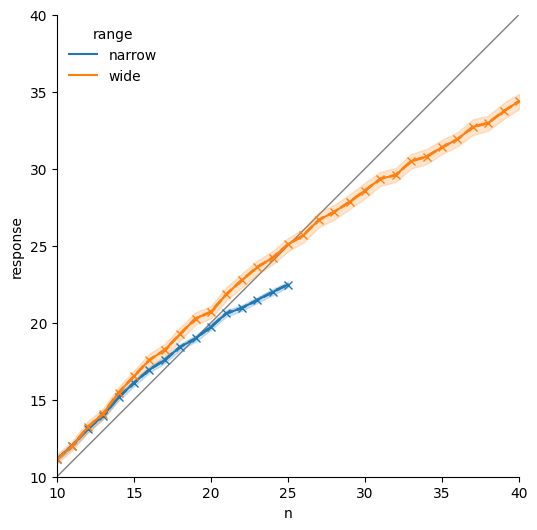

In [433]:
plt.figure(figsize=(6,6))
ax = sns.lineplot(x='n', y='response', data=beh, hue='range',)
ax.set_aspect(1)
apc.removeAxSpines(ax)
ax.axline((10,10), slope=1, c='grey', ls='-', lw=1, zorder=-1000)
for rg in [NARROW, WIDE]:
    dfrg = beh[beh.range==rg]
    #mresps = estimate_mean_responses_ols(dfrg[~pd.isna(dfrg.response)])
    #ax.plot(*list(zip(*mresps.items())), c=COLORS_COND[rg], ls='--', lw=1)
    #mresps = estimate_mean_responses_gaussian_kernel(dfrg, conv_w=1)
    #ax.plot(*list(zip(*mresps.items())), c=COLORS_COND[rg], ls=':', lw=1)
    ax.plot( binNs_pooled[rg]['A'], binAvgs_pooled[rg]['A'], 'x--',  c=COLORS_COND[rg], lw=2)
ax.set_xlim(10,40); ax.set_ylim(10,40);

KeyboardInterrupt: 

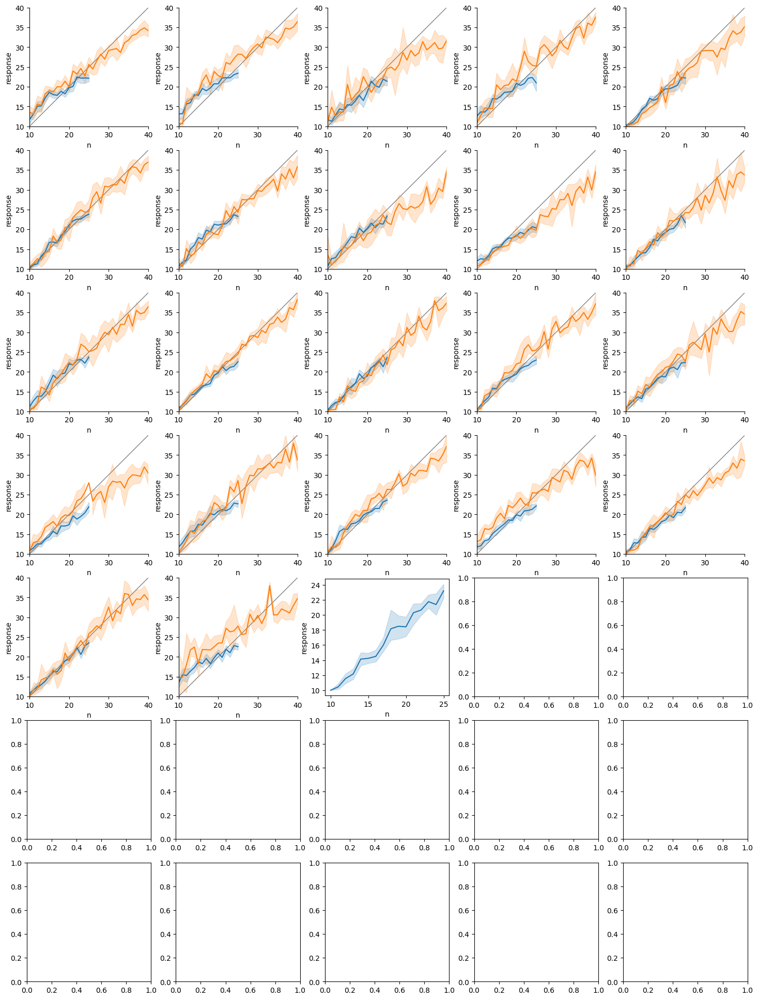

In [434]:
nbSubjs = len(subject_ids)
ncols = 5; nrows = int(np.ceil(nbSubjs/ncols))
fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(18,3.5*np.ceil(nbSubjs/ncols)) )
all_axs = axs.flatten()
for ii,sid in enumerate( subject_ids ):
    ax = all_axs[ii]
    ax.set_aspect(1)
    sdat = beh.loc[sid] #.xs(str(sid).rjust(2, '0'), 0, 'subject')
    for cond in CONDITIONS:
        datC = sdat[sdat.range==cond]
        sns.lineplot(data=datC, x='n', y='response', ax=ax)
    apc.removeAxSpines(ax)
    ax.axline((10,10), slope=1, c='grey', ls='-', lw=1, zorder=-1000)
    ax.set_xlim(10,40); ax.set_ylim(10,40);
ii += 1
while ii < len(all_axs):
    all_axs[ii].axis('off')
    ii+=1

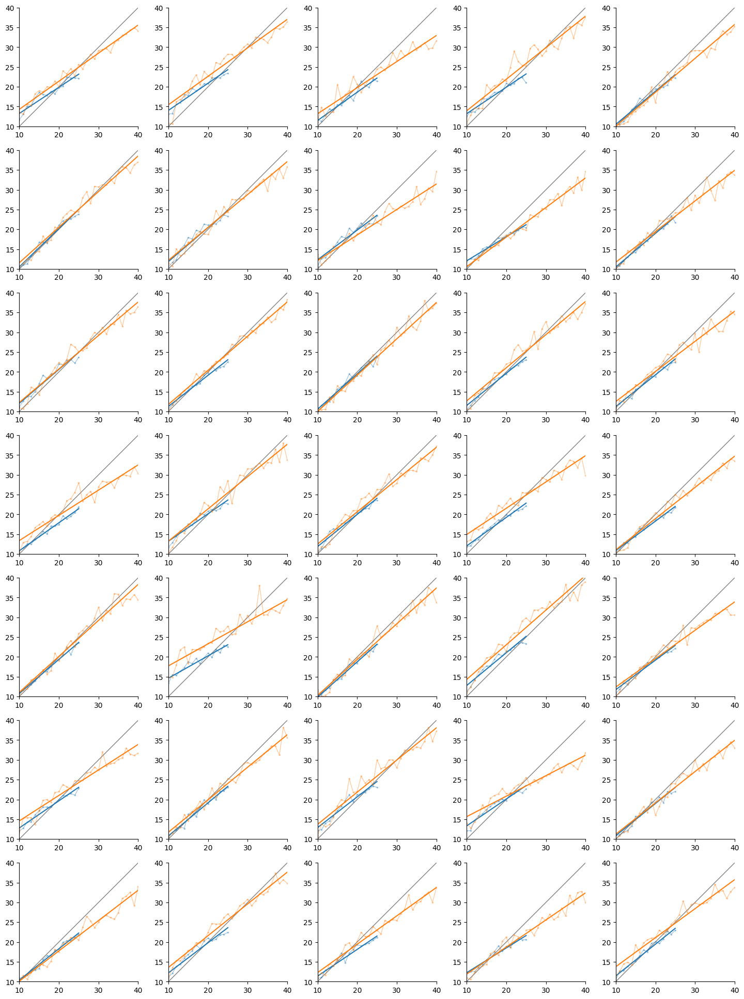

In [ ]:
nbSubjs = len(subject_ids)
ncols = 5; nrows = int(np.ceil(nbSubjs/ncols))
fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(18,3.5*np.ceil(nbSubjs/ncols)) )
all_axs = axs.flatten()
for ii,sid in enumerate( subject_ids ):
    ax = all_axs[ii]
    ax.set_aspect(1)
    sdat = beh.loc[sid] #.xs(str(sid).rjust(2, '0'), 0, 'subject')
    for cond in CONDITIONS:
        datC = sdat[sdat.range==cond]
        datC = datC[~pd.isna(datC.response)]
        mresps = estimate_mean_responses_empirical(datC)
        ax.plot(*list(zip(*mresps.items())), c=COLORS_COND[cond], marker='.', ms=5, mec='none', alpha=.4, lw=1)
        mresps = estimate_mean_responses_ols(datC)
        ax.plot(*list(zip(*mresps.items())), c=COLORS_COND[cond], ls='-') #, lw=1)
        #mresps = estimate_mean_responses_gaussian_kernel(datC, conv_w={NARROW:.5, WIDE:1}[cond]*1)
        #ax.plot(*list(zip(*mresps.items())), c=COLORS_COND[cond], ls='-', )
    apc.removeAxSpines(ax)
    ax.axline((10,10), slope=1, c='grey', ls='-', lw=1, zorder=-1000)
    ax.set_xlim(10,40); ax.set_ylim(10,40);
ii += 1
while ii < len(all_axs):
    all_axs[ii].axis('off')
    ii+=1

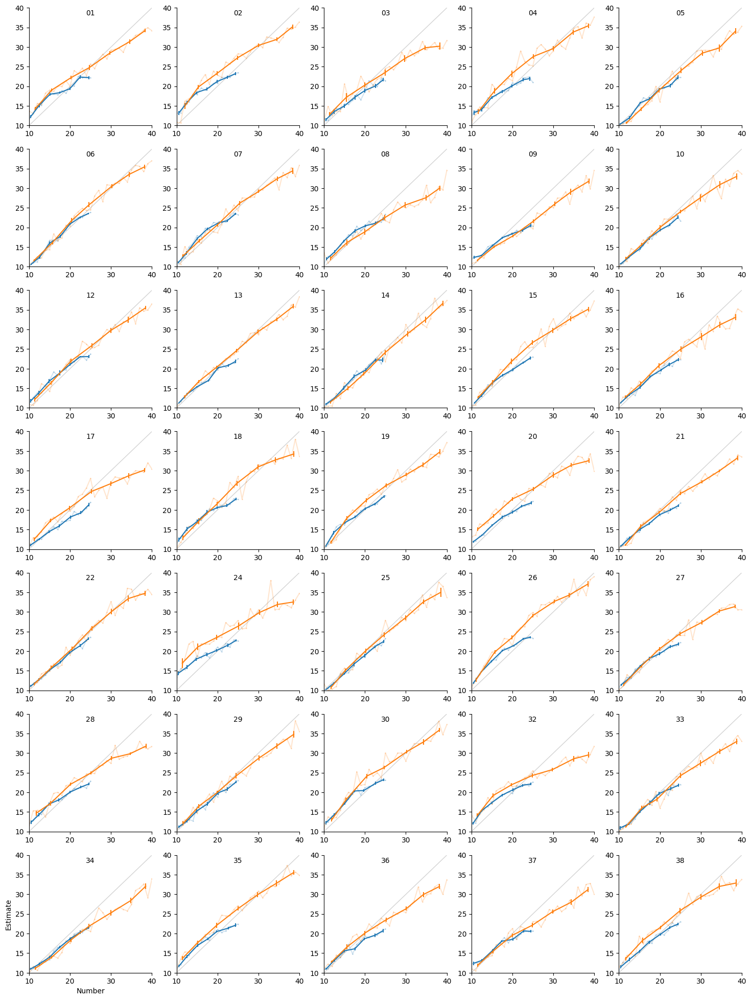

In [ ]:
normalize = False
ncols = 5; nrows = int(np.ceil(nbSubjs/ncols))
fig, axs = plt.subplots(ncols=ncols, nrows=int(np.ceil(nbSubjs/ncols)), figsize=(18,3.5*np.ceil(nbSubjs/ncols)) )
all_axs = axs.flatten()
binSizes = ['A', 7]
for ii,sid in enumerate( subject_ids ):
    ax = all_axs[ii]
    for cond in CONDITIONS:
        for k in binSizes:
            ns = binNs[cond][k][ii]
            avgz = binAvgs[cond][k][ii]
            avgz_sem = binAvgs_sem[cond][k][ii]
            if normalize:
                ns = (ns-10)/( 15 if cond==NARROW else 30 )
            if k=='A':
                ax.plot(ns, avgz, '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
            else:
                ax.errorbar(ns, avgz, yerr=avgz_sem, c=COLORS_COND[cond], label=cond)
    apc.removeAxSpines(ax)
    ax.axline((10,10), slope=1, c='lightgrey', ls='-', lw=1, zorder=-1000)
    ax.set_xlim(0,1) if normalize else ax.set_xlim(10,40)
    ax.set_ylim(10,40)
    ax.set_title(sid, y=.9, fontsize=10)
#axs[0,0].set_xlabel( ('normalized ' if normalize else '') + 'n'); axs[0,0].set_ylabel('response'); 
axs[nrows-1,0].set_xlabel( ('normalized ' if normalize else '') + 'Number'); axs[nrows-1,0].set_ylabel('Estimate'); 
ii += 1
while ii < len(all_axs):
    all_axs[ii].axis('off')
    ii+=1

In [ ]:
binNs[cond][k].shape

(35, 7)

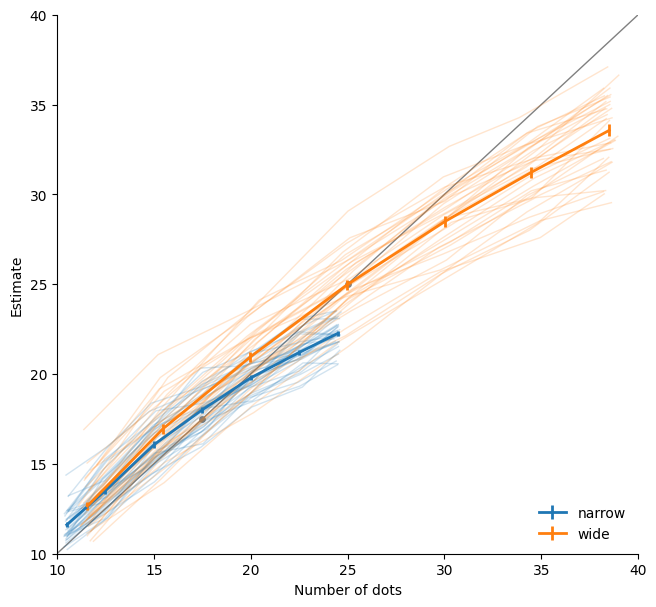

In [ ]:
fig, ax = plt.subplots(figsize=(7.5,7))
for cond in CONDITIONS:
    k = 7
    ns = binNs[cond][k] # shape = (nbSubj, k)
    avgzz = binAvgs[cond][k]
    xx = ns.mean(axis=0)
    plt.errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=2)
    #plt.errorbar(xx, np.nanmean(avgzz, axis=0), np.std( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond)
    plt.plot(ns.T, avgzz.T, c=COLORS_COND[cond], lw=1, alpha=.2, zorder=-100)
ax.set_xlabel('Number of dots')
ax.set_ylabel('Estimate')
ax.axline((10,10), slope=1, c='grey', ls='-', lw=1, zorder=-1000)
ax.set_xlim(10,40) if not normalize else ax.set_xlim(0,1);
ax.set_ylim(10,40)
ax.scatter([17.5,25], [17.5,25], s=15, c='grey', zorder=-1000)
apc.removeAxSpines(ax);
ax.legend(loc='lower right');

### Log estimate vs log number

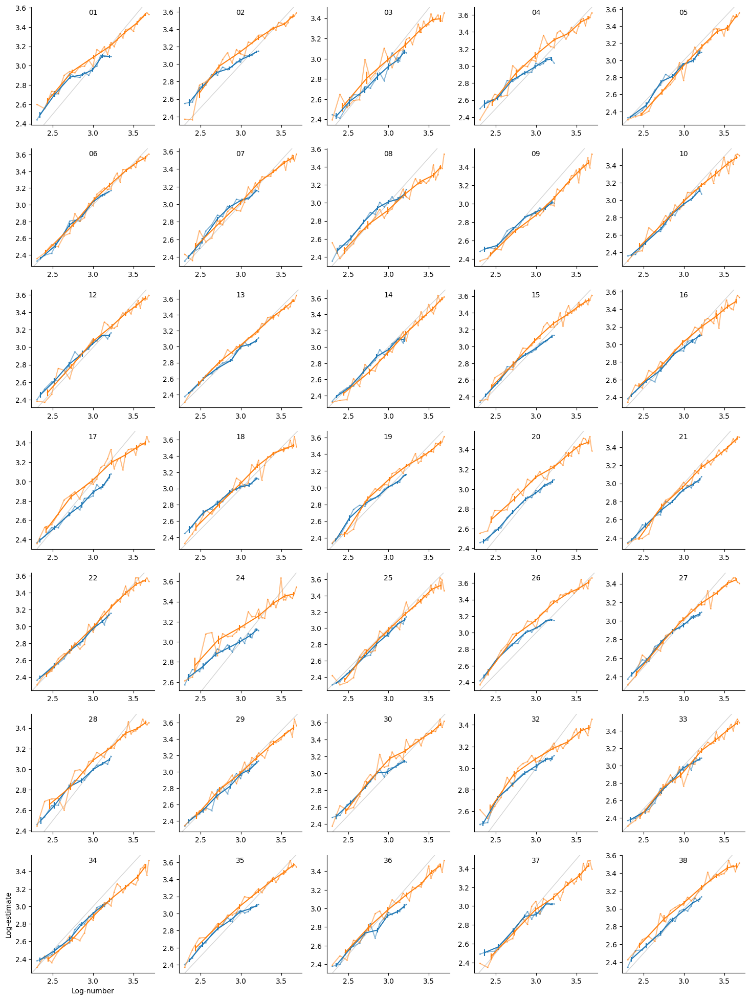

In [ ]:
ncols = 5; nrows = int(np.ceil(nbSubjs/ncols))
fig, axs = plt.subplots(ncols=ncols, nrows=int(np.ceil(nbSubjs/ncols)), figsize=(18,3.5*np.ceil(nbSubjs/ncols)) )
all_axs = axs.flatten()
binSizes = ['A', 7]
for ii,sid in enumerate( subject_ids ):
    ax = all_axs[ii]
    for cond in CONDITIONS:
        for k in binSizes:
            logns = binLogNs[cond][k][ii]
            avglogz = binAvgLogRs[cond][k][ii]
            avglogz_sem = binAvgLogRs_sem[cond][k][ii]
            if k=='A':
                ax.plot(logns, avglogz, '.-', c=COLORS_COND[cond], alpha=.5, ms=2)
            else:
                ax.errorbar(logns, avglogz, yerr=avglogz_sem, c=COLORS_COND[cond], label=cond)
    apc.removeAxSpines(ax)
    ax.axline((3,3), slope=1, c='lightgrey', ls='-', lw=1, zorder=-1000)
    #ax.set_xlim(0,1) if normalize else ax.set_xlim(10,40)
    #ax.set_ylim(10,40)
    ax.set_title(sid, y=.9, fontsize=10)
#axs[0,0].set_xlabel( ('normalized ' if normalize else '') + 'n'); axs[0,0].set_ylabel('response'); 
axs[nrows-1,0].set_xlabel( 'Log-number'); axs[nrows-1,0].set_ylabel('Log-estimate'); 
ii += 1
while ii < len(all_axs):
    all_axs[ii].axis('off')
    ii+=1

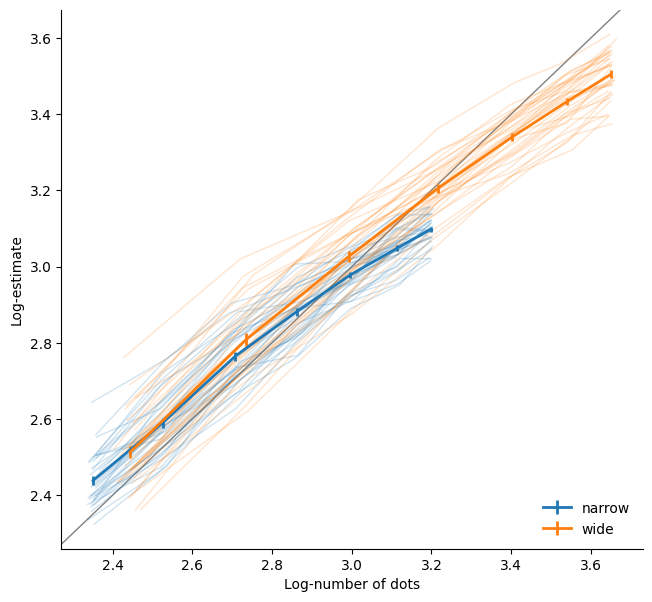

In [ ]:
fig, ax = plt.subplots(figsize=(7.5,7))
for cond in CONDITIONS:
    k = 7
    logns = binLogNs[cond][k] # shape = (nbSubj, k)
    avglogzz = binAvgLogRs[cond][k]
    xx = logns.mean(axis=0)
    plt.errorbar(xx, np.nanmean(avglogzz, axis=0), stats.sem( avglogzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=2)
    #plt.errorbar(xx, np.nanmean(avgzz, axis=0), np.std( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond)
    plt.plot(logns.T, avglogzz.T, c=COLORS_COND[cond], lw=1, alpha=.2, zorder=-100)
ax.set_xlabel('Log-number of dots')
ax.set_ylabel('Log-estimate')
ax.axline((3,3), slope=1, c='grey', ls='-', lw=1, zorder=-1000)
#ax.set_xlim(10,40) if not normalize else ax.set_xlim(0,1);
#ax.set_ylim(10,40)
#ax.scatter([17.5,25], [17.5,25], s=15, c='grey', zorder=-1000)
apc.removeAxSpines(ax);
ax.legend(loc='lower right');

## Std dev vs Number

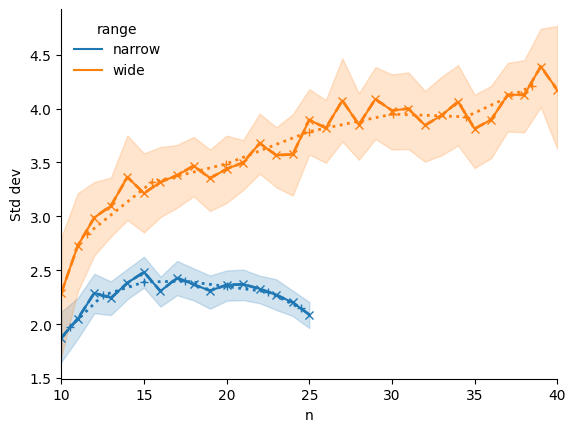

In [ ]:
#### Pooled data ####
ax = sns.lineplot(x='n', y='response', data=beh, hue='range', estimator='std')
for x in ['top', 'right']: ax.spines[x].set_visible(False);
#ax.plot([41, 80], [41, 80], c='grey', ls='-', lw=1, zorder=-1000)
ax.set_xlim(10,40); #ax.set_ylim(41,80); 
ax.set_ylabel('Std dev')
for cond in CONDITIONS:
    ax.plot( binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], 'x--',  c=COLORS_COND[cond], lw=2)
    ax.plot( binNs_pooled[cond][7], binStds_pooled[cond][7], '+:',  c=COLORS_COND[cond], lw=2)

11.035353992145769 1.0848273131051383e-11
13.983903614415029 5.771632310468524e-24
17.50314799496824 9.907275605180011e-44
21.243372725316952 6.385287576447889e-40
25.029206461628167 4.0261070047830256e-64
28.497721919868 7.617501611929497e-49
31.497857894403012 4.751795919125416e-61


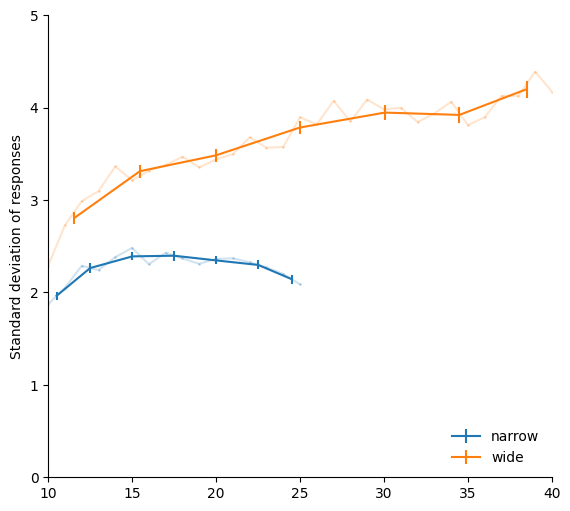

In [ ]:
##### this pools all the subjects #####
fig, ax = plt.subplots(figsize=(6.5,6))
binned_excursions_cond = {}
binned_xmean_cond = {}
normalize = 0
for cond in CONDITIONS:
    datC = beh[beh.range==cond]
    datC = datC[~pd.isna(datC.response)]
    #mresps = estimate_mean_responses_gaussian_kernel(datC, conv_w=1.5)
    mresps = estimate_mean_responses_empirical(datC)
    #mresps = estimate_mean_responses_ols(datC)
    datC['excursion'] = datC.apply(axis=1, func=lambda row: row.response - mresps[row.n])
    for k in ['A', 7,]:
        bins_edges = BINS_EDGES[cond][k]
        binned_data = apc.split_in_bins(datC, bin_edges=bins_edges, xs='n')
        xx = np.array( [b.n.mean() for b in binned_data] )
        if normalize:
            xx = (xx-10)/( 15 if cond==NARROW else 30 )
        if k=='A':
            ax.plot(xx, [b.excursion.std() for b in binned_data], '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
        else:
            binned_excursions_cond[cond] = [b.excursion for b in binned_data]
            binned_xmean_cond[cond] = xx
            ax.errorbar(xx, [b.excursion.std() for b in binned_data], yerr=[apc.sesd(b.excursion) for b in binned_data], c=COLORS_COND[cond], label=cond)
ax.set_xlabel('Number of dots' + ', normalized' if normalize else '')
ax.set_ylabel('Standard deviation of responses');
ax.set_xlim(10,40) if not normalize else ax.set_xlim(0,1);
ax.set_ylim(0,5)
apc.removeAxSpines(ax);
ax.legend(loc='lower right');
#
xs = []
pvs = []
for i in range(len(binned_xmean_cond[CONDITIONS[0]])):
    x = .5*sum( binned_xmean_cond[cond][i] for cond in CONDITIONS )
    xs.append(x)
    pv = stats.levene(*[binned_excursions_cond[cond][i] for cond in CONDITIONS]).pvalue
    pvs.append(pv)
    print(x, pv)
#pvs = np.array(pvs)
#for x,pv in zip(xs,pvs):
#    ax.text(x,2.0, s='$***$' if pv<=.001 else '$**$' if pv<=0.01 else '$*$' if pv<0.05 else '', ha='center', fontsize=14, usetex=True)

In [ ]:
binNs[NARROW][7].mean(axis=0)

array([10.50760556, 12.50468807, 15.01801177, 17.49579715, 20.00840718, 22.50704765, 24.49245539])

In [ ]:
binned_xmean_cond

{'narrow': array([10.50524309, 12.50496032, 15.01749838, 17.50048591, 20.00991408, 22.5058296 , 24.49848332]),
 'wide': array([11.5654649 , 15.46284691, 19.98879761, 24.98625954, 30.04849885, 34.48961424, 38.49723247])}

['A', 7]


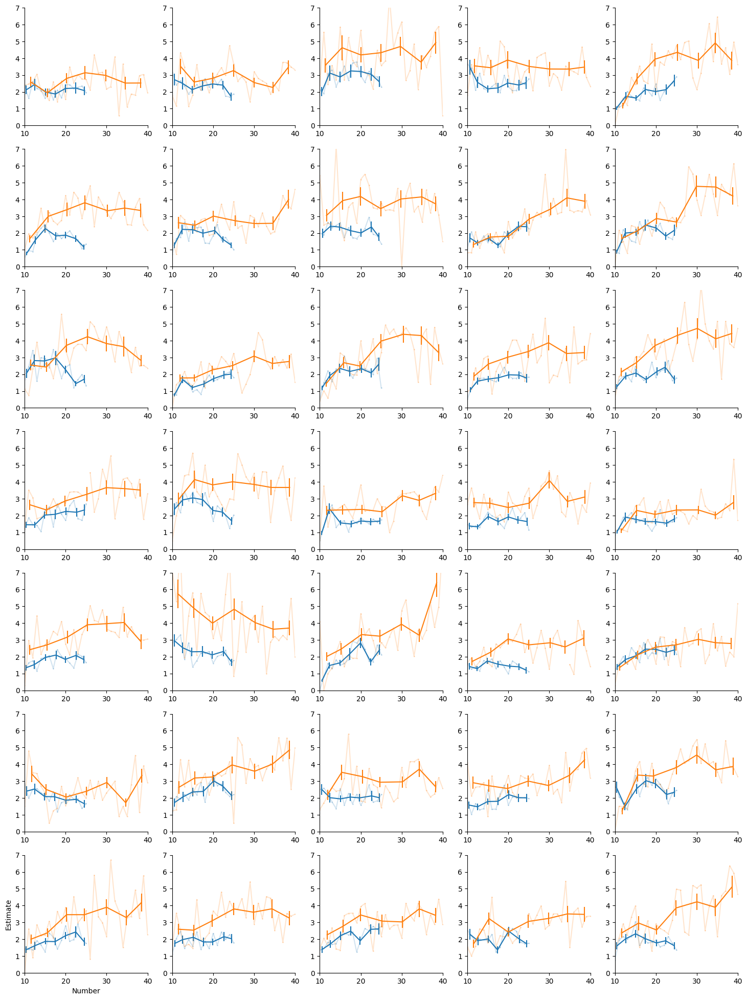

In [ ]:
normalize = False
ncols = 5; nrows = int(np.ceil(nbSubjs/ncols))
fig, axs = plt.subplots(ncols=ncols, nrows=nrows, figsize=(18,3.5*np.ceil(nbSubjs/ncols)) )
all_axs = axs.flatten()
print(binSizes)
for ii,sid in enumerate( subject_ids ):
    ax = all_axs[ii]
    for cond in CONDITIONS:
        for k in binSizes:
            ns = binNs[cond][k][ii]
            stdz = binStds[cond][k][ii]
            stdz_sesd = binStds_sesd[cond][k][ii]
            if normalize:
                ns = (ns-10)/( 15 if cond==NARROW else 30 )
            if k=='A':
                ax.plot(ns, stdz, '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
            else:
                ax.errorbar(ns, stdz, yerr=stdz_sesd, c=COLORS_COND[cond], label=cond)
    apc.removeAxSpines(ax)
    #ax.axline((10,10), slope=1, c='grey', ls='-', lw=1, zorder=-1000)
    ax.set_xlim(0,1) if normalize else ax.set_xlim(10,40);
    ax.set_ylim(0,7);
#axs[0,0].set_xlabel( ('normalized ' if normalize else '') + 'n'); axs[0,0].set_ylabel('std dev'); 
axs[nrows-1,0].set_xlabel( ('normalized ' if normalize else '') + 'Number'); axs[nrows-1,0].set_ylabel('Estimate'); 

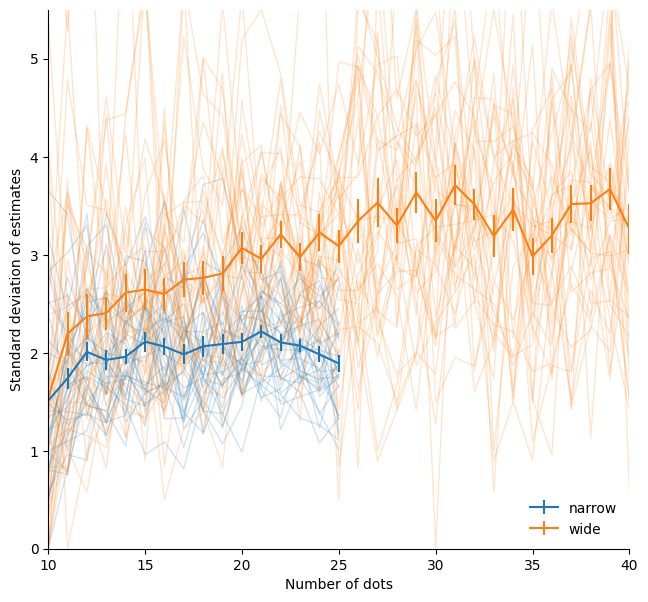

In [ ]:
fig, ax = plt.subplots(figsize=(7.5,7))
normalize = False
for cond in CONDITIONS:
    k = 'A'
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = np.nanmean(ns, axis=0)
    if normalize:
        xx = (xx-10)/( 15 if cond==NARROW else 30 )
    ax.errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0, nan_policy='omit' ), c=COLORS_COND[cond], label=cond)
    nns = ( (ns-10)/( 15 if cond==NARROW else 30 ) ) if normalize else ns
    ax.plot(nns.T, stdzz.T, c=COLORS_COND[cond], lw=1, alpha=.2, zorder=-100)
ax.set_xlabel('Number of dots' + (', normalized' if normalize else '') )
ax.set_ylabel('Standard deviation of estimates');
ax.set_xlim(10,40) if not normalize else ax.set_xlim(0,1);
ax.set_ylim(0,5.5)
apc.removeAxSpines(ax);
ax.legend(loc='lower right');

In [ ]:
binNs[cond][k].shape

(35, 31)

In [ ]:
## for each subject and each condition: all excursions (pooling all the numbers)
excursions_cond = {cond:[] for cond in CONDITIONS}
for ii,sid in enumerate( subject_ids ):
    sdat = beh.loc[sid] #dfAn.xs(str(sid).rjust(2, '0'), 0, 'subject')
    for cond in CONDITIONS:
        datC = sdat[sdat.range==cond]
        datC = datC[~pd.isna(datC.response)]
        mresps = estimate_mean_responses_ols(datC)
        #mresps = estimate_mean_responses_empirical(datC)
        #mresps = estimate_mean_responses_gaussian_kernel(datC, conv_w={NARROW:.5, WIDE:1}[cond]*2)
        excursions = datC.apply(axis=1, func=lambda row: row.response - mresps[row.n])
        excursions_cond[cond].append( excursions.values )
stdz_cond = {cond:np.array([e.std() for e in excursions]) for cond,excursions in excursions_cond.items()}

In [ ]:
def odr_1dregression(x, y, data=None):
    if data is None:
        dat = odr.Data(x, y)
    else:
        dat = odr.Data(data[x], data[y])
    myodr = odr.ODR(dat, odr.unilinear, beta0=[1., 0.]) # start point = identity
    res = myodr.run()
    return res

def odr_pred(odr_res, x):
    B = odr_res.beta
    return B[0]*x + B[1]

Beta: [ 2.12450555 -1.1296083 ]
Beta Std Error: [0.43585874 0.92312939]
Beta Covariance: [[ 3.35096173 -7.05990061]
 [-7.05990061 15.03152682]]
Residual Variance: 0.0566920362062922
Inverse Condition #: 0.004637888034836808
Reason(s) for Halting:
  Sum of squares convergence


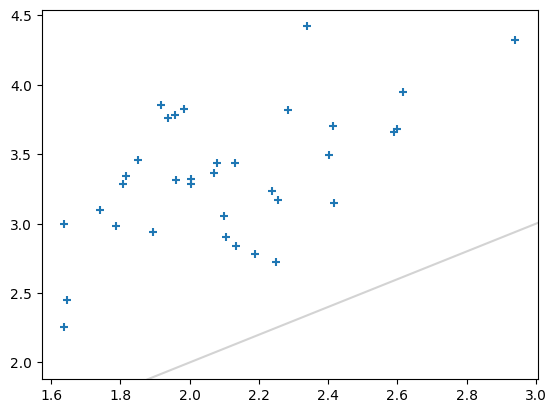

In [ ]:
res = odr_1dregression(stdz_cond[NARROW], stdz_cond[WIDE]); res.pprint()
plt.scatter( stdz_cond[NARROW], stdz_cond[WIDE], marker='+') 
plt.axline((2,2), slope=1, c='lightgrey')

Text(0.5, 0, 'Number')

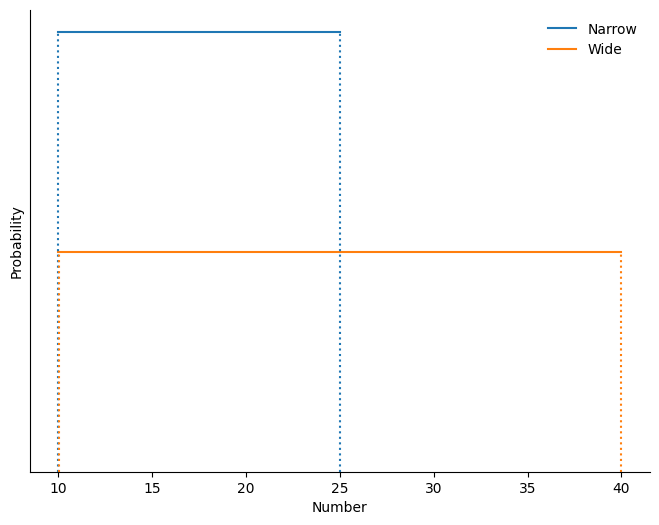

In [ ]:
fig, ax = plt.subplots(figsize=(8,6))
ax.plot([10, 25], [1/15, 1/15], c=COLORS_COND[NARROW], label='Narrow')
ax.plot([10, 40], [1/30, 1/30], c=COLORS_COND[WIDE], label='Wide')
ax.plot([10-.04,10-.04], [0, 1/15], c=COLORS_COND[NARROW], ls=':'); ax.plot([25,25], [0, 1/15], c=COLORS_COND[NARROW], ls=':')
ax.plot([10+.04,10+.04], [0, 1/30], c=COLORS_COND[WIDE], ls=':');   ax.plot([40,40], [0, 1/30], c=COLORS_COND[WIDE], ls=':')
ax.set_ylim(0,None)
apc.removeAxSpines(ax)
ax.legend()
ax.set_yticks([])
ax.set_ylabel('Probability')
ax.set_xlabel('Number')

## Intersection bias=0

$mx + c = x$ if $x=\frac{c}{1-m}$

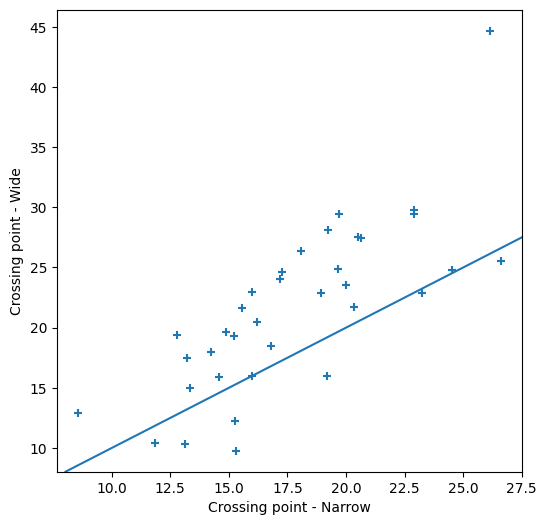

In [ ]:
fig, ax = plt.subplots(figsize=(6,6))
cross_idline = {NARROW:[], WIDE:[]}
slopes = {NARROW:[], WIDE:[]}
for ii,sid in enumerate( subject_ids ):
    sdat = beh.loc[sid] #dfAn.xs(str(sid).rjust(2, '0'), 0, 'subject')
    for cond in CONDITIONS:
        datC = sdat[sdat.range==cond]
        datC = datC[~pd.isna(datC.response)]
        mresps, (m,c) = estimate_mean_responses_ols(datC, return_pars=True)
        cross_idline[cond].append(c/(1-m))
        slopes[cond].append(m)
ax.scatter( cross_idline[NARROW], cross_idline[WIDE], marker='+' )
ax.set_xlabel('Crossing point - Narrow')
ax.set_ylabel('Crossing point - Wide')
stats.pearsonr( cross_idline[NARROW], cross_idline[WIDE] )
ax.axline((15,15), slope=1)

In [ ]:
slopes

{'narrow': [0.6613567283423863,
  0.6858054532377236,
  0.7151933580948223,
  0.6688754976631478,
  0.8373527644424922,
  0.9681747179289643,
  0.8582880277617126,
  0.7497946013430088,
  0.6083671824087212,
  0.8484239214983526,
  0.8575624931382637,
  0.7853608274486124,
  0.8945962505822468,
  0.814199677199835,
  0.8020424143556285,
  0.7081291176903329,
  0.6942133283394422,
  0.8131758084769889,
  0.7205572947921718,
  0.7431975114382224,
  0.859854876470975,
  0.5627890326492742,
  0.8909168517528971,
  0.8277623704568678,
  0.7453546129442621,
  0.6848267957616658,
  0.8340544950836715,
  0.776401374286992,
  0.6783894098179815,
  0.8110233112832792,
  0.7916770432005628,
  0.7612408969925931,
  0.6749042421190815,
  0.625680930060321,
  0.8005475508936671],
 'wide': [0.7098699028473456,
  0.7191417038453372,
  0.6590002634874912,
  0.7969476193809382,
  0.8565919477572805,
  0.8992118494182927,
  0.830899831599372,
  0.6449699284241758,
  0.7475457300915921,
  0.77361424643234

## Error

narrow
nan
wide
nan


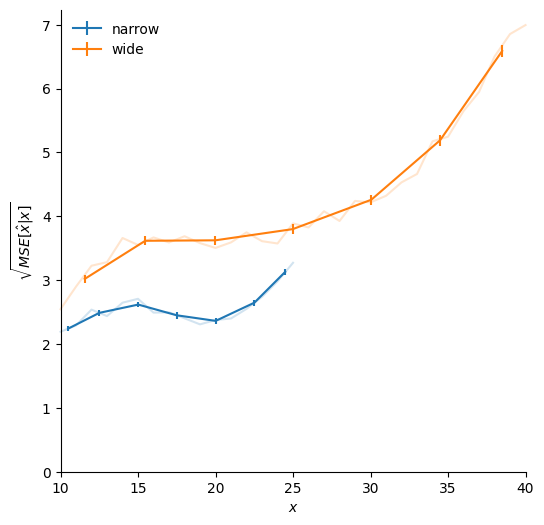

In [ ]:
fig, ax = plt.subplots(ncols=1, figsize=(6,6))
binned_errs_cond = {}
for k in ['A', 7,]:
    for cond in CONDITIONS:
        bin_edges = BINS_EDGES[cond][k]
        da = beh[beh.range==cond]
        binned_data = apc.split_in_bins(da, bin_edges, xs=da.n)
        binned_errors = apc.split_in_bins(da.error, bin_edges=bin_edges, xs=da.n)
        binned_errs_cond[cond] = binned_errors
        mses = np.array( [ (errs**2).mean() for errs in binned_errors] )
        sqrt_mses = np.sqrt(mses)
        se_sqrt_mses = np.array( [ apc.sesd(errs) for errs in binned_errors] ) ### Correct???
        xs = np.array([_da.n.mean() for _da in binned_data])
        c = COLORS_COND[cond]
        if k=='A':
            ax.plot(xs, sqrt_mses, c=c, alpha=.2, clip_on=False)
        else:
            ax.errorbar(xs, sqrt_mses, se_sqrt_mses, label=cond)
            print(cond)
            print(stats.levene( binned_errors[2], binned_errors[-1] ).pvalue)
#ax.axline((60,60), slope=1, c='lightgrey', zorder=-1000)
ax.set_xlim(10,40); ax.set_ylim(0,None);
apc.removeAxSpines(ax)
ax.legend()
ax.set_xlabel('$x$'); ax.set_ylabel('$\sqrt{MSE[\hat x|x]}$');

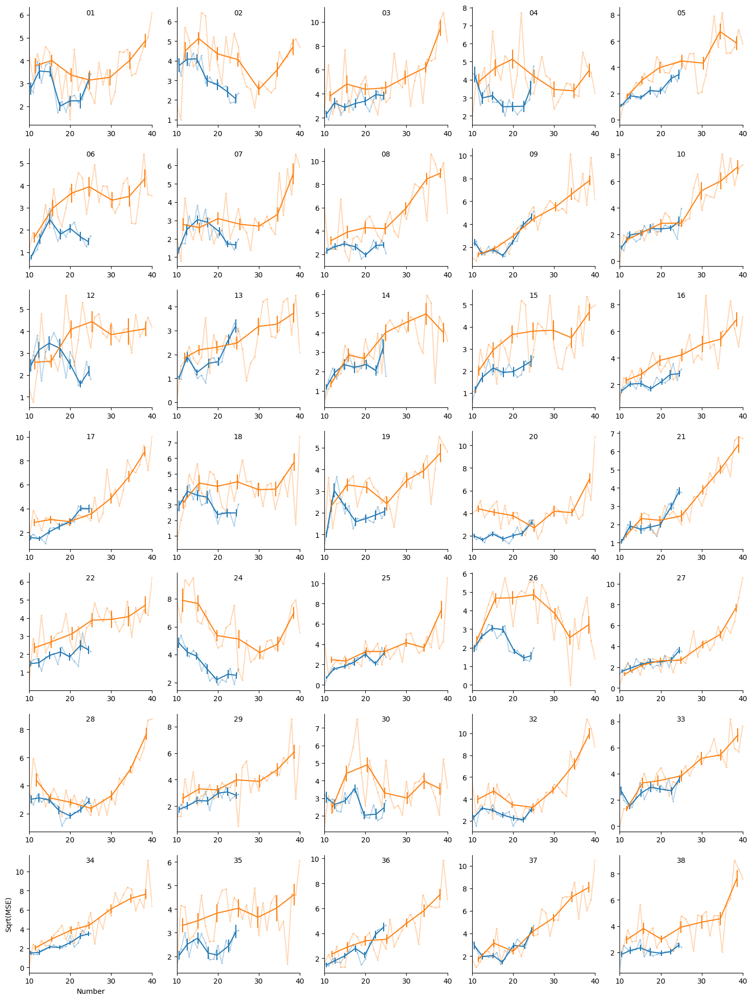

In [ ]:
normalize = False
ncols = 5; nrows = int(np.ceil(nbSubjs/ncols))
fig, axs = plt.subplots(ncols=ncols, nrows=int(np.ceil(nbSubjs/ncols)), figsize=(18,3.5*np.ceil(nbSubjs/ncols)) )
all_axs = axs.flatten()
binSizes = ['A', 7]
for ii,sid in enumerate( subject_ids ):
    ax = all_axs[ii]
    for cond in CONDITIONS:
        for k in binSizes:
            ns = binNs[cond][k][ii]
            sqrt_msez = binSqrtMses[cond][k][ii]
            sqrt_msez_se = binSqrtMses_se[cond][k][ii]
            if normalize:
                ns = (ns-10)/( 15 if cond==NARROW else 30 )
            if k=='A':
                ax.plot(ns, sqrt_msez, '.-', c=COLORS_COND[cond], alpha=.3, ms=2)
            else:
                ax.errorbar(ns, sqrt_msez, yerr=sqrt_msez_se, c=COLORS_COND[cond], label=cond)
    apc.removeAxSpines(ax)
    ax.set_xlim(0,1) if normalize else ax.set_xlim(10,40)
    ax.set_title(sid, y=.9, fontsize=10)
#axs[0,0].set_xlabel( ('normalized ' if normalize else '') + 'n'); axs[0,0].set_ylabel('response'); 
axs[nrows-1,0].set_xlabel( ('normalized ' if normalize else '') + 'Number'); axs[nrows-1,0].set_ylabel('Sqrt(MSE)'); 
ii += 1
while ii < len(all_axs):
    all_axs[ii].axis('off')
    ii+=1

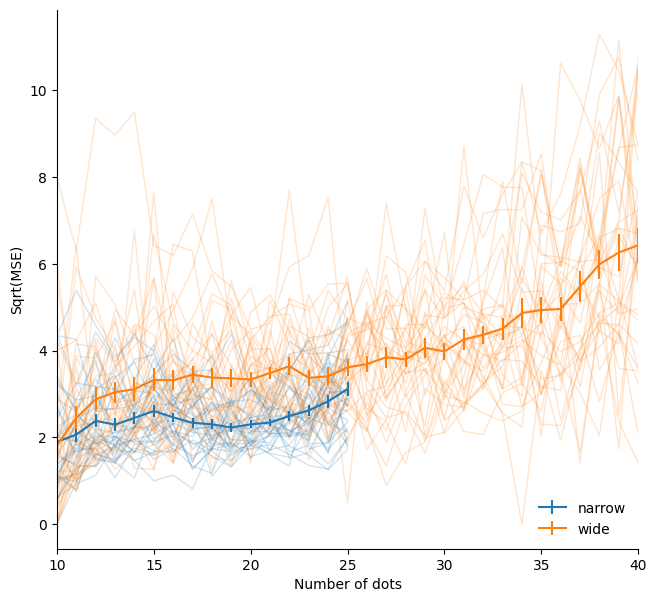

In [ ]:
fig, ax = plt.subplots(figsize=(7.5,7))
normalize = False
for cond in CONDITIONS:
    k = 'A'
    ns = binNs[cond][k] # shape = (nbSubj, k)
    sqrt_msez = binSqrtMses[cond][k]
    xx = np.nanmean(ns, axis=0)
    if normalize:
        xx = (xx-10)/( 15 if cond==NARROW else 30 )
    ax.errorbar(xx, np.nanmean(sqrt_msez, axis=0), stats.sem( sqrt_msez, axis=0, nan_policy='omit' ), c=COLORS_COND[cond], label=cond)
    nns = ( (ns-10)/( 15 if cond==NARROW else 30 ) ) if normalize else ns
    ax.plot(nns.T, sqrt_msez.T, c=COLORS_COND[cond], lw=1, alpha=.2, zorder=-100)
ax.set_xlabel('Number of dots' + (', normalized' if normalize else '') )
ax.set_ylabel('Sqrt(MSE)');
ax.set_xlim(10,40) if not normalize else ax.set_xlim(0,1);
#ax.set_ylim(0,5.5)
apc.removeAxSpines(ax);
ax.legend(loc='lower right');

# A closer look at the variability at the boundaries

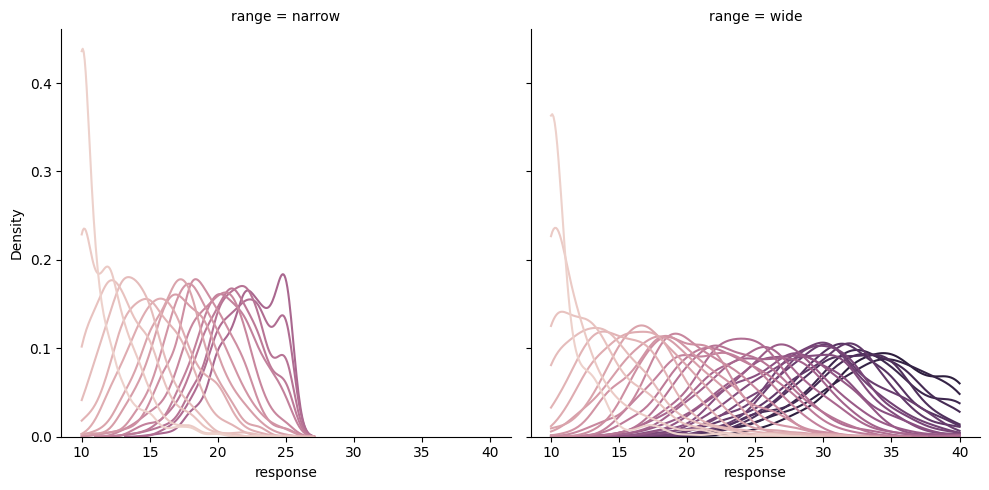

In [ ]:
g = sns.displot(beh, kind='kde', x='response', hue='n', col='range', clip=(10,40),
                legend=False, fill=False, common_norm=False, bw_adjust=1) # clip=(41,80), bw_adjust=1.2)
#[ax.set_xlim(41,80) for ax in g.axes[0]]

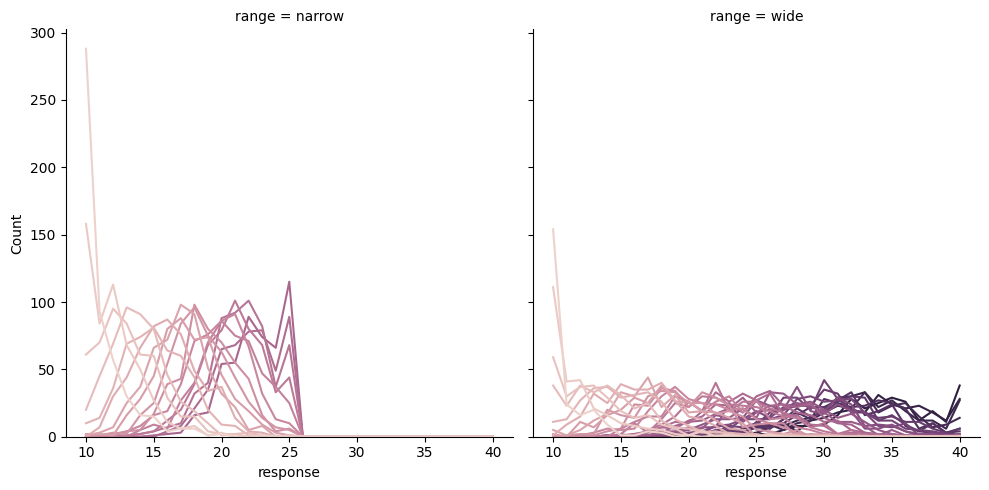

In [ ]:
g = sns.displot(beh, kind='hist', x='response', hue='n', col='range', bins=np.arange(9.5, 41.5, 1), element='poly', 
                legend=False, fill=False, common_norm=False,) # clip=(41,80), bw_adjust=1.2)
#[ax.set_xlim(41,80) for ax in g.axes[0]]

25 3.8957357028047555
37 4.127466071999994
38 4.127182526172444
39 4.389633732612565
40 4.174613016901649


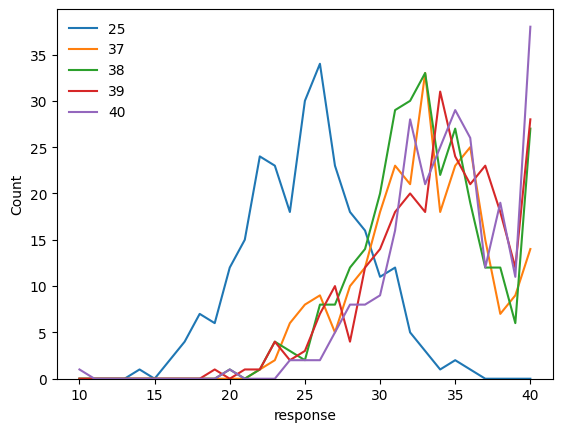

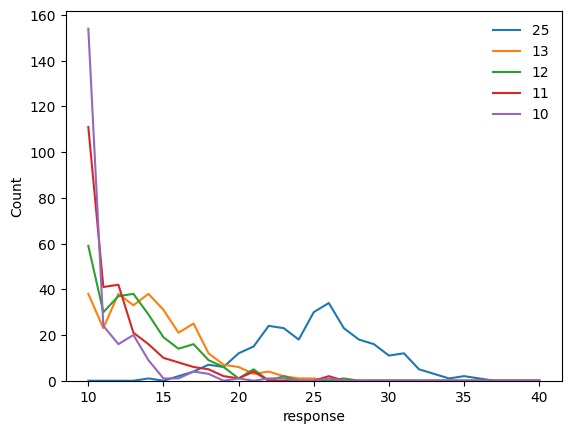

In [ ]:
for n in [25, 37, 38, 39, 40]:
    dat = beh[ (beh['range']==WIDE) & (beh['n']==n) ]
    #plt.hist(dat.response, histtype='step', bins=np.arange(9.5, 41.5))
    sns.histplot(data=dat, x='response', element='poly', fill=False, bins=np.arange(9.5, 41.5), label=n)
    print( n, dat.response.std() )
plt.legend()
plt.figure()
for n in reversed([10, 11, 12, 13, 25]):
    dat = beh[ (beh['range']==WIDE) & (beh['n']==n) ]
    #plt.hist(dat.response, histtype='step', bins=np.arange(9.5, 41.5))
    sns.histplot(data=dat, x='response', element='poly', fill=False, bins=np.arange(9.5, 41.5), label=n)
plt.legend()

# Model(s)

In [ ]:
import numerosity.numerosity as num

In [ ]:
XS_COND = {
    NARROW : np.arange(10, 26, 1),
    WIDE   : np.arange(10, 41, 1),
}
for xs in XS_COND.values():
    xs.flags.writeable = False
PRIORS_COND = {
    NARROW : np.ones(16)/16.,
    WIDE   : np.ones(31)/31.,
}
for pxs in PRIORS_COND.values():
    pxs /= pxs.sum()
    pxs.flags.writeable = False
WIDTHS_COND = { NARROW:15, WIDE:30 }

In [ ]:
def min_objf(f, x0s, v=True, return_all_res=False, **kwargs):
    bestF = np.inf
    bestRes = None
    if return_all_res:
        all_res = []
    for x0 in x0s:
        #try:
        res = optimize.minimize(f, x0=x0, **kwargs)
        #except Exception as e:
        #    print('!!', x0, 'threw an exception.')
        #    print(e)
        #    continue
        if v:
            print(x0, '->', res.x, res.fun)
        if res.fun < bestF:
            bestF = res.fun
            bestRes = res
        if return_all_res:
            all_res.append(res)
    if return_all_res:
        return bestRes, all_res
    return bestRes

In [519]:
type(res)

scipy.optimize._optimize.OptimizeResult

 fun: 3
   x: [1, 2, 3]

In [523]:
def min_objf_grid(objf, ranges, v=True, finish=True, compare_with_res=None, **kwargs):
    best_r = np.inf
    best_x = None
    ### Method 1: grid search
    res = optimize.brute( objf, ranges=ranges, full_output=True, finish=None)
    res = optimize.OptimizeResult( x=res[0], fun=res[1] )
    if res.fun < best_r:
        best_r = res.fun
        best_x = res.x
    if v:
        print(best_x, best_r)
    # Finish
    if finish:
        res = optimize.minimize(objf, x0=best_x, **kwargs )
    # Compare
    if compare_with_res is not None and compare_with_res.fun < res.fun:
            return compare_with_res
    return res
            

In [ ]:
import itertools

## Likelihood

In [ ]:
def mLL(dat, sxs, spxs, μxs, ν, σ, w, lo=10, NUM_RS=10_000):
    #print( ν, σ, w )
    pxhatx = num.probs_xhats_given_x_with_μxs(sxs, spxs, μxs, ν=ν, σ=σ, lo=lo, w=w, NUM_RS=NUM_RS)
    #print(pxhatx)
    pxhatx_onsupport = pxhatx[(sxs>=lo) & (sxs<=(lo+w))]
    logpxhatx = np.where(pxhatx_onsupport>0, pxhatx_onsupport, -np.inf)
    np.log(logpxhatx, out=logpxhatx, where=logpxhatx>0)
    #print(logpxhatx)
    return -logpxhatx[dat.n.astype(int)-lo,dat.response.astype(int)-lo].sum()

In [ ]:
def mLL_with_ν(dat, cond, ν, σ, NUM_RS=10_000): # straightfoward with ν
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    correct_w = WIDTHS_COND[cond]
    dat_ = dat[dat.range==cond]
    μxs = np.linspace(0, 1, len(xs))
    return mLL(dat_, xs, pxs, μxs, ν, σ, w=correct_w, lo=10, NUM_RS=NUM_RS)

def mLL_with_θ(dat, cond, θcost, σ, NUM_RS=10_000):
    w = WIDTHS_COND[cond]
    ν = θcost**(1/4) / np.sqrt(w)
    return mLL_with_ν(dat, cond, ν, σ, NUM_RS=NUM_RS)


In [ ]:
from functools import cache

In [ ]:
@cache
def mLL_allsubjects_with_ν(cond, ν, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_with_ν(dat, cond, ν, σ, NUM_RS=NUM_RS) 
@cache
def mLL_onesubject_with_ν(sid, cond, ν, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)].loc[sid]
    return mLL_with_ν(dat, cond, ν, σ, NUM_RS=NUM_RS) 

In [ ]:
mLL_allsubjects_with_ν(NARROW, ν=0, σ=3)

18197.772063538934

In [ ]:
mLL_onesubject_with_ν('07', NARROW, ν=0, σ=3)

511.60920044557497

## Rectified normal

In [ ]:
def rectified_normal_Pab(a, b, mu, sigma, lo, hi):
    '''Probability that x is in [a,b], where x is a r.v. with *rectified* normal density.'''
    assert np.all(a<=b)
    aa = np.asarray(a, dtype=float)
    bb = np.asarray(b, dtype=float)
    mm = np.asarray(mu, dtype=float)
    assert aa.shape == bb.shape
    r = np.zeros( np.broadcast_shapes(aa.shape, mm.shape) )
    mask_bigger = (aa<=lo) & (bb>=hi) # extreme case, [a,b] contains [lo,hi]
    r[...,mask_bigger] = 1.
    mask_lo = (aa<=lo) & (bb<hi)      # [a,b] contains lo (but not hi)
    r[...,mask_lo] = num.std_normal_cdf( (bb[mask_lo]-mm)/sigma )
    mask_hi = (aa>lo) & (bb>=hi)      # [a,b] contains hi (but not lo)
    r[...,mask_hi] = num.std_normal_cdf( -(aa[mask_hi]-mm)/sigma )
    mask_in = (aa>lo) & (bb<hi)       # [a,b] inside [lo,hi]
    r[...,mask_in] = num.std_normal_cdf_difference( (aa[mask_in]-mm)/sigma, (bb[mask_in]-mm)/sigma )
    return r

In [ ]:
print( stats.norm(loc=12, scale=2).cdf(12.5)-stats.norm(loc=12, scale=2).cdf(11.5) )
rectified_normal_Pab(a=11.5, b=12.5, mu=12, sigma=2, lo=10, hi=25)

0.1974126513658474


array(0.19741265)

In [ ]:
print( stats.norm(loc=12, scale=2).cdf(10.5) )
rectified_normal_Pab(a=9.5, b=10.5, mu=12, sigma=2, lo=10, hi=25)

0.2266273523768682


array(0.22662735)

In [ ]:
print( stats.norm(loc=22, scale=2).sf(24.5) )
rectified_normal_Pab(a=24.5, b=25.5, mu=22, sigma=2, lo=10, hi=25)

0.10564977366685535


array(0.10564977)

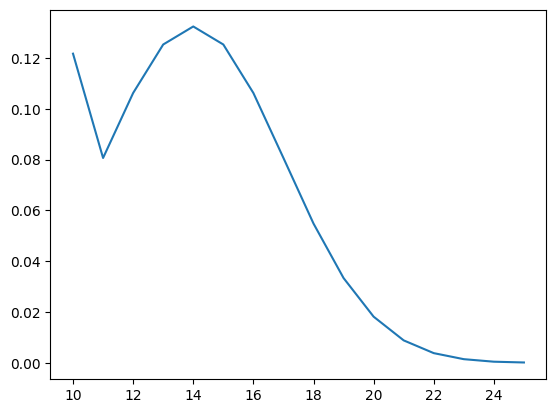

In [ ]:
plt.plot(XS_COND[NARROW], rectified_normal_Pab(a=XS_COND[NARROW]-.5, b=XS_COND[NARROW]+.5, mu=14, sigma=3, lo=10, hi=25) )

In [ ]:
def probs_xhats_given_xB_rectified(xB, lo, w, σ):
    '''Given a Bayesian estimate xB, and some *rectified*-Gaussian noise with parameter σ,
    this returns the probability of each possible discrete (integer) response xhat between lo and lo+w.'''
    hi = lo + w
    if σ == 0:
        ps = np.zeros(int(w)+1)
        ps[int(np.round(xB)-lo)] = 1.
        return ps
    xhats = num.discrete_xs(lo, w)
    ps = rectified_normal_Pab(a=xhats-.5, b=xhats+.5, mu=xB, sigma=σ, lo=lo-.5, hi=hi+.5)
    #assert np.allclose(ps.sum(axis=-1), 1)
    if not np.allclose(ps.sum(axis=-1), 1):
        warnings.warn('p xhats given xB does not sum to 1.')
    return ps

def probs_xhats_given_xBs_rectified_array(xBs, lo, w, σ):
    '''Same as probs_xhats_given_xB_rectified but for an array of xBs.'''
    assert xBs.ndim == 1
    if σ == 0:
        ps = np.zeros((len(xBs), int(w)+1))
        for ixB,xB in enumerate(xBs):
            ps[ixB, max(0,min(int(w),int(np.round(xB)-lo))) ] = 1.
        return ps
    return probs_xhats_given_xB_rectified(xBs[...,np.newaxis], lo, w, σ)

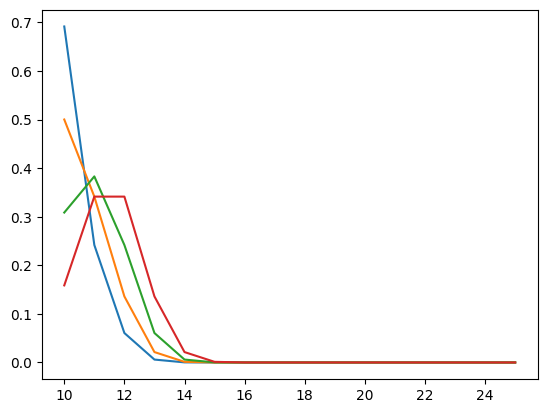

In [ ]:
plt.plot(XS_COND[NARROW], probs_xhats_given_xBs_rectified_array(np.array([10, 10.5, 11, 11.5]), lo=10, w=15, σ=1).T )

In [ ]:
def probs_xhats_given_x_with_μxs_rectified(sxs, spxs, μxs, ν, σ, lo=None, w=None, NUM_RS=10_000, NUM_STDS=4, MU_ON_01=True):
    assert sxs.shape == spxs.shape
    assert sxs.shape == μxs.shape
    lo = sxs[0] if lo is None else lo
    w  = (sxs[-1]-sxs[0]) if w is None else w
    if ν==0:
        p_xhats_given_xs = probs_xhats_given_xBs_rectified_array(sxs, lo=lo, w=w, σ=σ)
    else:
        if MU_ON_01:
            rs = np.linspace(-NUM_STDS*ν, 1+NUM_STDS*ν, num=NUM_RS)
        else:
            rs = np.linspace(μxs[0]-NUM_STDS*ν, μxs[-1]+NUM_STDS*ν, num=NUM_RS)
        p_rs_μxs = num.probs_rs_given_μxs(rs, μxs, ν) # shape = (size of sxs, NUM_RS)
        # If the noise is small some rs will have probability zero. To avoid problems further down, we filter them out.
        ind_impossible_rs = p_rs_μxs.max(axis=0) == 0
        p_possible_rs_μxs = p_rs_μxs[:, ~ind_impossible_rs]
        xBs = num.xBs_using_p_rs_μxs(sxs, spxs, p_possible_rs_μxs)
        #p_rs_μxs is p(r|x)   ### ===> it is p(xB(r) | x)
        p_xhats_given_xBs = probs_xhats_given_xBs_rectified_array(xBs, lo=lo, w=w, σ=σ) # shape = (NUM_RS_filtered, size of xhats)
        p_xhats_given_xs = np.dot(p_possible_rs_μxs, p_xhats_given_xBs) # p(xhat | x)
    #assert np.allclose( p_xhats_given_xs.sum(axis=1), 1 )
    if not np.allclose( p_xhats_given_xs.sum(axis=1), 1 ):
        warnings.warn('p_xhats_given_xs does not sum to 1.')
    return p_xhats_given_xs # p(xhat | x), shape = (size of sxs, size of xs). And p_xhats_given_xs[i] = probs of xhats given x=x_i

In [ ]:
def model_predictions_rectified(sxs, spxs, μxs, ν, σ, correct_xs=None, NUM_RS=100_000, MU_ON_01=True):
    if correct_xs is None: correct_xs = sxs
    pxhatx = probs_xhats_given_x_with_μxs_rectified(sxs, spxs, μxs, ν=ν, σ=σ, lo=correct_xs[0], w=correct_xs[-1]-correct_xs[0], NUM_RS=NUM_RS, MU_ON_01=MU_ON_01)
    pxhatx = pxhatx[ np.isin(sxs, correct_xs) ]
    #print(pxhatx.shape)
    avg_ests = (pxhatx*correct_xs).sum(axis=1)
    #print(avg_ests.shape)
    stddev_ests = np.sqrt( (pxhatx*(xs-avg_ests[...,np.newaxis])**2).sum(axis=1) )
    return pxhatx, avg_ests, stddev_ests

In [ ]:
def mLL_rectified(dat, sxs, spxs, μxs, ν, σ, w, lo=10, NUM_RS=10_000,MU_ON_01=True):
    #print( ν, σ, w )
    pxhatx = probs_xhats_given_x_with_μxs_rectified(sxs, spxs, μxs, ν=ν, σ=σ, lo=lo, w=w, NUM_RS=NUM_RS, MU_ON_01=MU_ON_01)
    #print(pxhatx)
    pxhatx_onsupport = pxhatx[(sxs>=lo) & (sxs<=(lo+w))]
    logpxhatx = np.where(pxhatx_onsupport>0, pxhatx_onsupport, -np.inf)
    np.log(logpxhatx, out=logpxhatx, where=logpxhatx>0)
    #print(logpxhatx)
    return -logpxhatx[dat.n.astype(int)-lo,dat.response.astype(int)-lo].sum()

In [ ]:
def mLL_with_ν_rectified(dat, cond, ν, σ, NUM_RS=10_000): # straightfoward with ν
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    correct_w = WIDTHS_COND[cond]
    dat_ = dat[dat.range==cond]
    μxs = np.linspace(0, 1, len(xs))
    return mLL_rectified(dat_, xs, pxs, μxs, ν, σ, w=correct_w, lo=10, NUM_RS=NUM_RS)


In [ ]:
@cache
def mLL_allsubjects_with_ν_rectified(cond, ν, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_with_ν_rectified(dat, cond, ν, σ, NUM_RS=NUM_RS) 
@cache
def mLL_onesubject_with_ν_rectified(sid, cond, ν, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)].loc[sid]
    return mLL_with_ν_rectified(dat, cond, ν, σ, NUM_RS=NUM_RS) 

In [ ]:
def objf_nocognoise_rectified(x):
    σ_n, σ_w = x
    r  = mLL_allsubjects_with_ν_rectified(NARROW, ν=0, σ=σ_n)
    r += mLL_allsubjects_with_ν_rectified(WIDE, ν=0, σ=σ_w)
    #print(x, r)
    return r
respooled_nocognoise_rect = min_objf(objf_nocognoise_rectified, x0s=itertools.product([1,2,5], repeat=2), bounds=[(0.,None),]*2)
print(respooled_nocognoise_rect)

(1, 1) -> [2.70048331 4.53737198] 41438.76737671515
(1, 2) -> [2.70048683 4.53737071] 41438.76737671158
(1, 5) -> [2.70048558 4.53736976] 41438.76737671135
(2, 1) -> [2.70048588 4.53737274] 41438.76737671013
(2, 2) -> [2.70048598 4.53737348] 41438.767376710886
(2, 5) -> [2.70049472 4.53737424] 41438.767376792064
(5, 1) -> [2.70048513 4.53736913] 41438.76737671273
(5, 2) -> [2.70048535 4.53737165] 41438.767376709875
(5, 5) -> [4.29289322 4.29289322] 42623.46286247031
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 41438.767376709875
        x: [ 2.700e+00  4.537e+00]
      nit: 12
      jac: [ 0.000e+00 -7.276e-04]
     nfev: 42
     njev: 14
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


In [442]:
def objf_basemodel_rectified(x):
    ν_n, σ = x
    ν_w = np.sqrt(2)*ν_n
    r  = mLL_allsubjects_with_ν_rectified(NARROW, ν=ν_n, σ=σ)
    r += mLL_allsubjects_with_ν_rectified(WIDE, ν=ν_w, σ=σ)
    #print(x, r)
    return r
res = min_objf(objf_basemodel_rectified, x0s=itertools.product([.001, .01, .1, .2], [2,3]), bounds=[(1e-5,2.), (1e-2,None), ] )
print(res)

(0.001, 2) -> [9.99965387e-04 3.75609419e+00] 42381.31584661787
(0.001, 3) -> [1.00031234e-03 3.75609403e+00] 42381.31584661799
(0.01, 2) -> [0.10814851 2.26332935] 40823.39288632963
(0.01, 3) -> [0.10814858 2.26332964] 40823.39288632662
(0.1, 2) -> [0.10814858 2.26332912] 40823.392886326816
(0.1, 3) -> [0.10814925 2.26332926] 40823.39288645127
(0.2, 2) -> [0.10814859 2.2633297 ] 40823.39288632647
(0.2, 3) -> [0.10814857 2.26333004] 40823.39288632675
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40823.39288632647
        x: [ 1.081e-01  2.263e+00]
      nit: 8
      jac: [-1.091e-02 -7.276e-04]
     nfev: 42
     njev: 14
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>


In [441]:
def add_subjects_data(axEst, axStd):
    for ic,cond in enumerate( CONDITIONS ):
        k = 7
        avgzz = binAvgs[cond][k]
        ns = binNs[cond][k] # shape = (nbSubj, k)
        stdzz = binStds[cond][k]
        xx = ns.mean(axis=0)
        if axEst is not None:
            axEst.plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
            axEst.errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
        if axStd is not None:
            axStd.plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
            axStd.errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
    if axEst is not None:
        axEst.axline((10,10), slope=1, color='lightgrey', zorder=-1000)
        axEst.set_xlim(10,40); axEst.set_ylim(10,40);
    if axStd is not None:
        axStd.set_xlim(10,40); axStd.set_ylim(0,None)

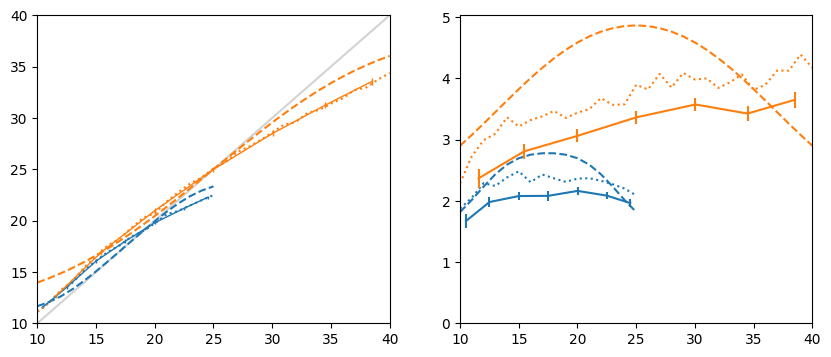

In [444]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = np.linspace(0,1,len(xs))
    σ = res.x[1]
    ν = res.x[0]*(np.sqrt(2) if cond==WIDE else 1)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=10_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
add_subjects_data(axs[0], axs[1])

In [ ]:
pxhatx[0].sum()

0.9999999999999998

array([2.90011975, 3.0763315 , 3.26036224, 3.44892764, 3.63833995, 3.82471189, 4.00417326, 4.17307649, 4.32816916, 4.4667159 , 4.58655863,
       4.6861132 , 4.76430989, 4.82049428, 4.85431145, 4.86559889, 4.85431145, 4.82049428, 4.76430989, 4.6861132 , 4.58655863, 4.4667159 ,
       4.32816916, 4.17307649, 4.00417326, 3.82471189, 3.63833995, 3.44892764, 3.26036224, 3.0763315 , 2.90011975])

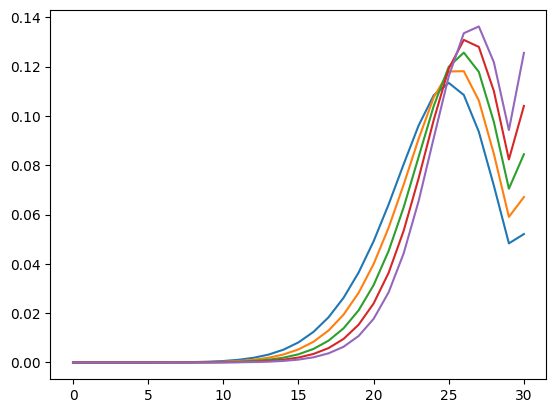

In [ ]:
plt.plot( pxhatx[-5:].T );
stddev_ests

In [ ]:
def μxs_and_ν_from_Ixs(Ixs, dx=1):
    '''Given Fisher information Ixs, returns μxs ranging from 0 to 1, together with noise parameter ν,
    such that a Gaussian r.v. with mean μ(x) and std dev ν has Fisher information I(x).
    `dx` is used for integration. The defaut dx=1 assumes that Ixs is defined for an array of numbers separated by 1 (e.g., integers).'''
    sqrtIxs = np.sqrt(Ixs)
    sqrtIxs = (sqrtIxs[1:]+sqrtIxs[:-1])/2 # we do this because sqrt(I(x)) is the derivative of μ(x), and μ(x) is set to 0 at the first x.
    ν = 1/( np.sum(sqrtIxs)*dx )
    μxs = np.r_[0, ν * np.cumsum(sqrtIxs) * dx]
    return μxs, ν

def opt_Ixs_μxs_and_ν(spxs, θcost, dx=1):
    '''Given a subjective prior spxs and a cost parameter θcost, returns the optimal Fisher information Ixs, along with μxs and ν (see`μxs_and_ν_from_Ixs`).
    `dx` is used for integration. The defaut dx=1 assumes that spxs is defined for an array of numbers separated by 1 (e.g., integers).'''
    if θcost==0:
        return np.ones_like(spxs)*np.inf, np.linspace(0,1,len(spxs)), 0.
    Ixs = (spxs**(2/3)) / np.sqrt( θcost * (spxs**(1/3)).sum() * dx )
    μxs, ν = μxs_and_ν_from_Ixs(Ixs, dx=dx)
    return Ixs, μxs, ν

In [ ]:
# with uniform priors ν should be θ^(1/4) / sqrt(width)
θcost = 10.5
opt_Ixs_μxs_and_ν(PRIORS_COND[WIDE], θcost)[2], θcost**(1/4)/( np.sqrt(30)  )

(0.3340849539751527, 0.32865231624539687)

narrow 0.26666666666666666 1.0
wide 0.18559214542766744 0.9999999999999997


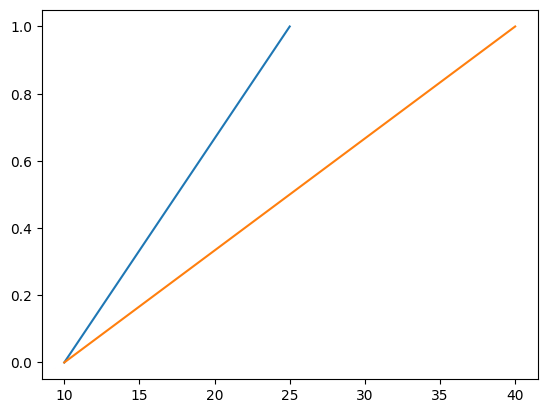

In [ ]:
for cond in CONDITIONS:
    pxs = PRIORS_COND[cond]
    θcost = 1
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(pxs, θcost)
    xs = XS_COND[cond]
    plt.plot(xs, μxs, c=COLORS_COND[cond])
    print(cond, ν, μxs[-1])

## Truncated normal

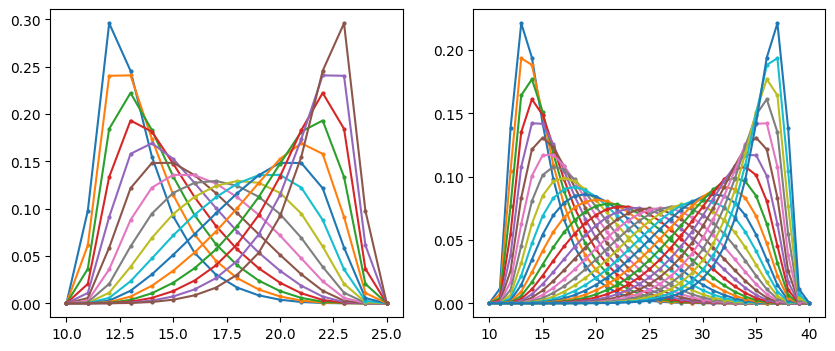

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    θcost = 1
    σ = 0
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(pxs, θcost)    
    pxhatx = num.probs_xhats_given_x_with_μxs(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[ic].plot(xs, pxhatx.T, 'o-', ms=2)

In [ ]:
subject_ids

Index(['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '24', '25', '26', '27', '28', '29',
       '30', '32', '33', '34', '35', '36', '37', '38'],
      dtype='object', name='subject')

In [ ]:
def model_predictions(sxs, spxs, μxs, ν, σ, correct_xs=None, NUM_RS=100_000):
    if correct_xs is None: correct_xs = sxs
    pxhatx = num.probs_xhats_given_x_with_μxs(sxs, spxs, μxs, ν=ν, σ=σ, lo=correct_xs[0], w=correct_xs[-1]-correct_xs[0], NUM_RS=NUM_RS)
    pxhatx = pxhatx[ np.isin(sxs, correct_xs) ]
    #print(pxhatx.shape)
    avg_ests = (pxhatx*correct_xs).sum(axis=1)
    #print(avg_ests.shape)
    stddev_ests = np.sqrt( (pxhatx*(xs-avg_ests[...,np.newaxis])**2).sum(axis=1) )
    return pxhatx, avg_ests, stddev_ests

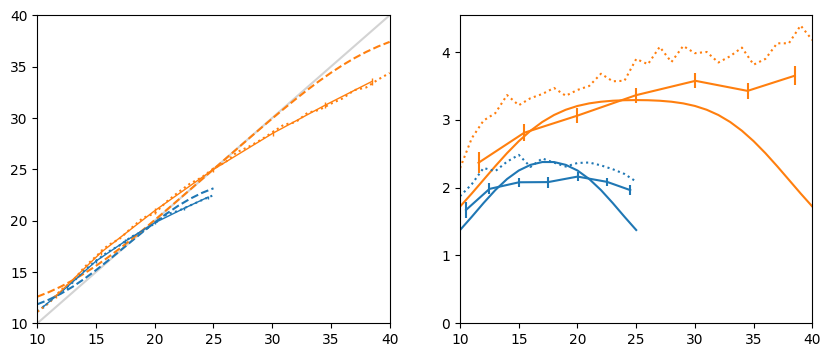

In [445]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    θcost = .1
    σ = 1
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(pxs, θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond])
add_subjects_data(axs[0], axs[1])

In [ ]:
θcost = .01
Ixs, μxs, ν_n = opt_Ixs_μxs_and_ν(PRIORS_COND[NARROW], θcost=θcost)
Ixs, μxs, ν_w = opt_Ixs_μxs_and_ν(PRIORS_COND[WIDE], θcost=θcost)
ν_n, ν_w, ν_w*np.sqrt(2)

(0.08432740427115679, 0.058689389538863365, 0.08299933065325822)

### No-cognitive-noise model

Model: $\nu=0$, $\sigma$ different in each condition.  
This can also be seen as a way to measure the overall noise separately in each condition.

In [ ]:
def objf_nocognoise(x):
    σ_n, σ_w = x
    r  = mLL_allsubjects_with_ν(NARROW, ν=0, σ=σ_n)
    r += mLL_allsubjects_with_ν(WIDE, ν=0, σ=σ_w)
    #print(x, r)
    return r
respooled_nocognoise = optimize.minimize(objf_nocognoise, x0=[3, 3], bounds=[(0.,None),]*2)
print(respooled_nocognoise)
####### Per subject
def objf_nocognoise_onesubj(x, sid):
    σ_n, σ_w = x
    r  = mLL_onesubject_with_ν(sid, NARROW, ν=0, σ=σ_n)
    r += mLL_onesubject_with_ν(sid, WIDE, ν=0, σ=σ_w)
    #print(x, r)
    return r
results_nocognoise = []
for sid in subject_ids:
    res = optimize.minimize(objf_nocognoise_onesubj, x0=[3, 3], args=(sid,), bounds=[(0.,None),]*2)
    if not res.success:
        print('!', sid)
        print(res)
    results_nocognoise.append([sid, res.x[0], res.x[1], res.fun])
results_nocognoise = pd.DataFrame(results_nocognoise, columns=['subject', 'sigma_n', 'sigma_w', 'mll'])
print('-LL =', results_nocognoise['mll'].sum() )
results_nocognoise


  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40835.2508301528
        x: [ 2.803e+00  4.756e+00]
      nit: 7
      jac: [-2.183e-03 -6.548e-03]
     nfev: 24
     njev: 8
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
-LL = 40396.66624669144


,subject,sigma_n,sigma_w,mll
0,01,3.098263,4.063359,1144.541639
1,02,3.713269,4.551815,1222.719136
2,03,3.736999,6.325157,1248.600036
3,04,3.487110,4.546494,1186.030894
4,05,2.372351,4.933552,1158.251398
5,06,1.942789,3.671270,1068.005608
6,07,2.549503,3.407594,1110.139683
7,08,2.870104,6.932362,1184.679525
8,09,3.046475,5.529635,1224.307946
9,10,2.440000,4.678000,1141.537451


In [ ]:
results_nocognoise['sigmaSq_n'] = results_nocognoise.sigma_n**2
results_nocognoise['sigmaSq_w'] = results_nocognoise.sigma_w**2

In [ ]:
results_nocognoise.mll.sum()

40396.66624669144

Subject $i$, prior $1$: $var_{i1} = \sigma_{i}^2 + w_1 \nu_i$  
Subject $i$, prior $2$: $var_{i2} = \sigma_{i}^2 + w_2 \nu_i$  
Thus $\nu_i = (var_{i2} - \sigma_{i}^2)/w_2$, and $var_{i1} = \sigma_{i}^2 + (var_{i2} - \sigma_{i}^2)w_1/w_2 = \sigma_{i}^2 (1-w_1/w_2) + var_{i2} w_1/w_2$  

Beta: [  5.63082232 -21.85481658]
Beta Std Error: [ 1.42295467 11.56121184]
Beta Covariance: [[ 0.33133176 -2.63386736]
 [-2.63386736 21.87195744]]
Residual Variance: 6.111095428631443
Inverse Condition #: 0.00252007585384593
Reason(s) for Halting:
  Sum of squares convergence


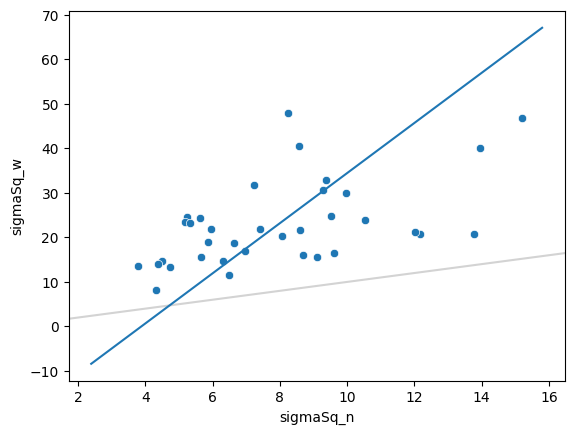

In [ ]:
sns.scatterplot(data=results_nocognoise, x='sigmaSq_n', y='sigmaSq_w' )
#sns.relplot(data=results_nocognoise, x='sigma_n', y='sigma_w' )
plt.axline((3,3), slope=1, c='lightgrey', zorder=-1000)
odr_res = odr_1dregression(data=results_nocognoise, x='sigmaSq_n', y='sigmaSq_w')
odr_res.pprint()
plt.plot(plt.xlim(), odr_pred(odr_res, np.array(plt.xlim()), ) )

Subject $i$, prior $1$: $var_{i1} = \sigma_{i}^2 + w_1 \nu_i$  
Subject $i$, prior $2$: $var_{i2} = \sigma_{i}^2 + w_2 \nu_i$  
Thus $var_{i2} - var_{i1} = \nu_i (w_2 - w_1)$.  

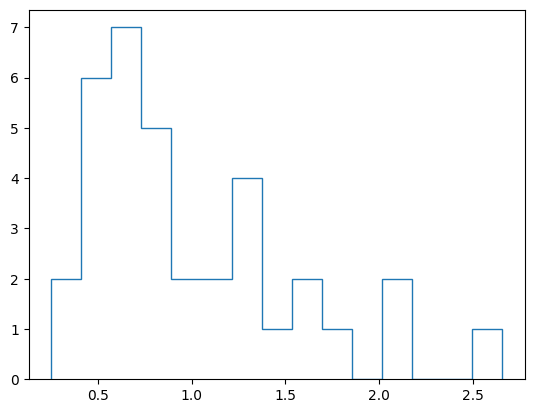

In [ ]:
plt.hist( (results_nocognoise.sigmaSq_w - results_nocognoise.sigmaSq_n)/15,  bins=15, histtype='step' );

In [ ]:
respooled_nocognoise

  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40835.2508301528
        x: [ 2.803e+00  4.756e+00]
      nit: 7
      jac: [-2.183e-03 -6.548e-03]
     nfev: 24
     njev: 8
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>

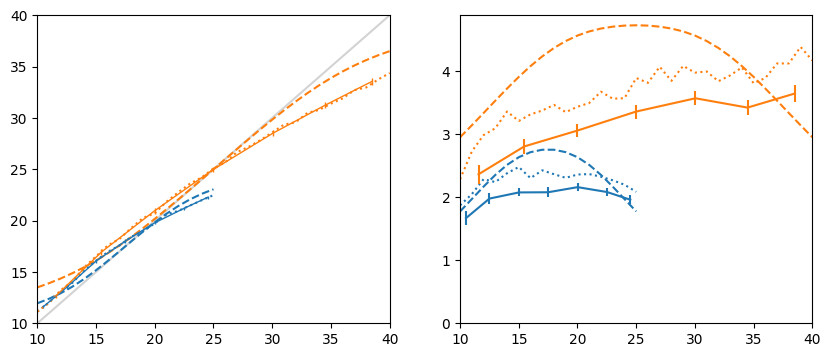

In [448]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = np.linspace(0,1,len(xs))
    σ = respooled_nocognoise.x[ic]
    pxhatx, avg_ests, stddev_ests = model_predictions(xs, pxs, μxs, ν=0, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
add_subjects_data(axs[0], axs[1])

### No-motor-noise model

Model: $\sigma=0$, $\nu$ different in each condition.  
This can also be seen as a way to measure the overall noise separately in each condition.

Basically this is impossible to fit.  
If the cognitive noise is too small, the model subject is too precise and some responses that actually occur are just impossible under the model.  
But if the cognitive noise is too high, the model subject has a strong central tendency, and responses near the boundary are basically impossible.

In [ ]:
def objf_nomotornoise(x):
    ν_n, ν_w = x
    r  = mLL_allsubjects_with_ν(NARROW, ν=ν_n, σ=0)
    print(r)
    r += mLL_allsubjects_with_ν(WIDE,   ν=ν_w, σ=0)
    print(x, r)
    return r
res = optimize.minimize(objf_nomotornoise, x0=[.05, .05], bounds=[(1e-3,.13),]*2 )
print(res)
####### Per subject
def objf_nomotornoise_onesubj(x, sid):
    ν_n, ν_w = x
    r  = mLL_onesubject_with_ν(sid, NARROW, ν=ν_n, σ=0)
    r += mLL_onesubject_with_ν(sid, WIDE, ν=ν_w, σ=0)
    #print(x, r)
    return r
results_nomotornoise = []
for sid in subject_ids:
    res = optimize.minimize(objf_nomotornoise_onesubj, x0=[.05, .05], args=(sid,), bounds=[(0.,.2),]*2)
    if not res.success:
        print('!', sid)
        print(res)
    results_nomotornoise.append([sid, res.x[0], res.x[1], res.fun])
results_nomotornoise = pd.DataFrame(results_nomotornoise, columns=['subject', 'nu_n', 'nu_w', 'mll'])
results_nomotornoise


49021.9196041791
[0.05 0.05] 94793.68341743588
49021.90540369622
[0.05000001 0.05      ] 94793.66921695299
49021.9196041791
[0.05       0.05000001] 94793.67131684197
21274.43266313607
[0.13 0.13] 49785.84893330755
21274.43320561312
[0.12999999 0.13      ] 49785.8494757846
21274.43266313607
[0.13       0.12999999] 49785.84941379193
  message: CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL
  success: True
   status: 0
      fun: 49785.84893330755
        x: [ 1.300e-01  1.300e-01]
      nit: 1
      jac: [-5.425e+04 -4.805e+04]
     nfev: 6
     njev: 2
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Docu

,subject,nu_n,nu_w,mll
0,01,0.05,0.05,2702.012762
1,02,0.05,0.05,3460.705608
2,03,0.05,0.05,4154.147648
3,04,0.05,0.05,3211.291797
4,05,0.05,0.05,2538.968328
5,06,0.05,0.05,1755.493479
6,07,0.05,0.05,2083.112719
7,08,0.05,0.05,3541.324461
8,09,0.05,0.05,3224.685652
9,10,0.05,0.05,2401.708216


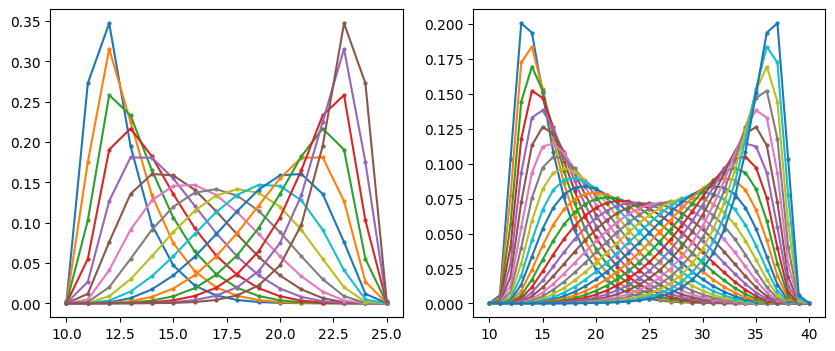

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    θcost = 1
    σ = 0
    μxs = np.linspace(0, 1, len(xs))
    ν = .2
    pxhatx = num.probs_xhats_given_x_with_μxs(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[ic].plot(xs, pxhatx.T, 'o-', ms=2)

### Both cognitive and motor noise 

#### Unconstrained nu
The motor noise stays the same across conditions but not the cognitive noise.  
Will this fit??? [No]

In [ ]:
def objf_unconstrained_ν(x):
    ν_n, ν_w, σ = x
    r  = mLL_allsubjects_with_ν(NARROW, ν=ν_n, σ=σ)
    r += mLL_allsubjects_with_ν(WIDE, ν=ν_w, σ=σ)
    #print(x, r)
    return r
#res = optimize.minimize(objf_unconstrained_ν, x0=[.01, .01, 2], bounds=[(1e-4,2.), (1e-4,2.), (1e-2,None), ])
#print(res)
#res = optimize.minimize(objf_unconstrained_ν, x0=[.1, .1, 2], bounds=[(1e-4,2.), (1e-4,2.), (1e-2,None), ])
#print(res)
res, all_res = min_objf(objf_unconstrained_ν, x0s=itertools.product([.0001, .001, .01, .1], [.001, .01, .1], [2,3]), return_all_res=True, bounds=[(1e-5,2.), (1e-5,2.), (1e-2,None), ] )
print(res)
#plt.scatter( [r.x[0] for r in all_res], [r.x[1] for r in all_res], marker='x')


(0.0001, 0.001, 2) -> [1.00000000e-04 9.99333044e-04 3.97062620e+00] 41635.23402349979
(0.0001, 0.001, 3) -> [1.00000000e-04 9.98927617e-04 3.97063042e+00] 41635.23402351038
(0.0001, 0.01, 2) -> [1.00418676e-04 1.00000000e-05 3.97062685e+00] 41635.234023499695
(0.0001, 0.01, 3) -> [1.00000000e-04 1.34961059e-01 2.82358961e+00] 40921.00561392048
(0.0001, 0.1, 2) -> [1.00006780e-04 1.34964840e-01 2.82362145e+00] 40921.005610687
(0.0001, 0.1, 3) -> [1.00010690e-04 1.34963894e-01 2.82362544e+00] 40921.00561070359
(0.001, 0.001, 2) -> [1.00055936e-03 9.99333044e-04 3.97062621e+00] 41635.23402349978
(0.001, 0.001, 3) -> [1.00000000e-03 9.98927640e-04 3.97063004e+00] 41635.23402350834
(0.001, 0.01, 2) -> [1.00043603e-03 1.06228053e-05 3.97062669e+00] 41635.23402349967
(0.001, 0.01, 3) -> [1.00000000e-03 1.34961102e-01 2.82358923e+00] 40921.00561390816
(0.001, 0.1, 2) -> [1.00000000e-03 1.34964850e-01 2.82362101e+00] 40921.005610689754
(0.001, 0.1, 3) -> [1.00000000e-03 1.34963894e-01 2.823625

In [ ]:
res

  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40921.00561067011
        x: [ 4.764e-05  1.350e-01  2.824e+00]
      nit: 9
      jac: [ 0.000e+00 -2.328e-02 -3.638e-03]
     nfev: 44
     njev: 11
 hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>

I don't believe in this fit

#### nu_w = sqrt(2) nu_n

In [ ]:
def objf_basemodel(x):
    ν_n, σ = x
    ν_w = np.sqrt(2)*ν_n
    r  = mLL_allsubjects_with_ν(NARROW, ν=ν_n, σ=σ)
    r += mLL_allsubjects_with_ν(WIDE, ν=ν_w, σ=σ)
    #print(x, r)
    return r
#res = optimize.minimize(objf_unconstrained_ν, x0=[.01, .01, 2], bounds=[(1e-4,2.), (1e-4,2.), (1e-2,None), ])
#print(res)
#res = optimize.minimize(objf_unconstrained_ν, x0=[.1, .1, 2], bounds=[(1e-4,2.), (1e-4,2.), (1e-2,None), ])
#print(res)
respooled_basemodel, all_res = min_objf(objf_basemodel, x0s=itertools.product([.001, .01, .1, .2], [2,3]), bounds=[(1e-5,2.), (1e-2,None), ], return_all_res=True )
print(respooled_basemodel)
#plt.scatter( [r.x[0] for r in all_res], [r.x[1] for r in all_res], marker='x')
#[r.fun for r in all_res]

####### Per subject
def objf_basemodel_onesubj(x, sid):
    ν_n, σ = x
    ν_w = np.sqrt(2)*ν_n
    r  = mLL_onesubject_with_ν(sid, NARROW, ν=ν_n, σ=σ)
    r += mLL_onesubject_with_ν(sid, WIDE, ν=ν_w, σ=σ)
    #print(x, r)
    return r
results_basemodel = []
for sid in subject_ids:
    #print(sid)
    #res = optimize.minimize(objf_basemodel_onesubj, x0=[.01, 2.5], args=(sid,), bounds=[(0.,None),]*2)
    res, all_res = min_objf(objf_basemodel_onesubj, x0s=itertools.product([.01, .1, .2], [2, 3]), args=(sid,), bounds=[(1e-5,None),]*2, return_all_res=True, v=0)
    if not res.success:
        print('!', sid)
        print(res)
    print(sid, res.x, res.fun, np.std([r.x for r in all_res], axis=0) )
    results_basemodel.append([sid, res.x[0], res.x[1], res.fun])
results_basemodel = pd.DataFrame(results_basemodel, columns=['subject', 'nu_n', 'sigma', 'mll'])
print('-LL =', results_basemodel['mll'].sum() )
results_basemodel

(0.001, 2) -> [1.0000000e-03 3.9706268e+00] 41635.23402349968
(0.001, 3) -> [1.00107232e-03 3.97063014e+00] 41635.23402350888
(0.01, 2) -> [1.12342267e-05 3.97062631e+00] 41635.23402349974
(0.01, 3) -> [0.09829637 2.48917578] 41001.09514779443
(0.1, 2) -> [0.0982962  2.48917798] 41001.09514778534
(0.1, 3) -> [0.0982962  2.48917948] 41001.09514778501
(0.2, 2) -> [0.09829608 2.48918843] 41001.09514782934
(0.2, 3) -> [0.09829608 2.48917697] 41001.09514779374
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 41001.09514778501
        x: [ 9.830e-02  2.489e+00]
      nit: 6
      jac: [ 3.711e-02  1.455e-03]
     nfev: 24
     njev: 8
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>
01 [0.08415518 2.69878327] 1141.3894244003995 [1.39612311e-06 2.21651260e-05]
02 [0.07776944 3.44531543] 1224.3461164711678 [2.95937955e-07 1.03432321e-05]
03 [0.14243525 3.14983197] 1250.0030401591446 [2.46601275e-07 1.53408080e-06]


KeyboardInterrupt: 

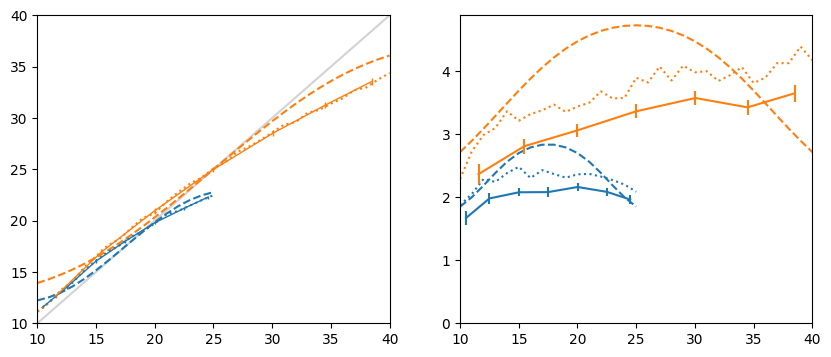

In [449]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = np.linspace(0,1,len(xs))
    σ = respooled_basemodel.x[1]
    ν = respooled_basemodel.x[0]*(np.sqrt(2) if cond==WIDE else 1)
    pxhatx, avg_ests, stddev_ests = model_predictions(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
add_subjects_data(axs[0], axs[1])

## Subjective prior + efficient coding

In [ ]:
def mLL_effcoding_subjective_prior(dat, sxs, spxs, θcost, σ, correct_w, NUM_RS=10_000):
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs, θcost)
    return mLL(dat, sxs, spxs, μxs, ν, σ, correct_w, NUM_RS=NUM_RS)

In [ ]:
def mLL_effcoding_subjective_prior_rectified(dat, sxs, spxs, θcost, σ, correct_w, NUM_RS=10_000):
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs, θcost)
    return mLL_rectified(dat, sxs, spxs, μxs, ν, σ, correct_w, NUM_RS=NUM_RS)

### Correct-support prior 

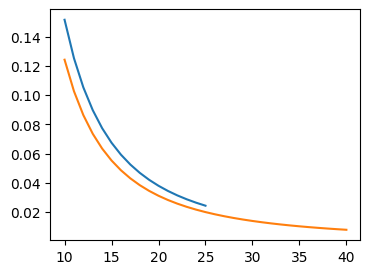

In [ ]:
ZIPF_COND = {}; plt.figure(figsize=(4,3))
for cond,xs in XS_COND.items():
    zps = stats.zipf(a=2).pmf(xs)
    zps /= zps.sum()
    plt.plot(xs, zps, c=COLORS_COND[cond] )
    zps.flags.writeable = False
    ZIPF_COND[cond] = zps

In [ ]:
stats.zipf(a=1.1).pmf(1)

0.09447823411029742

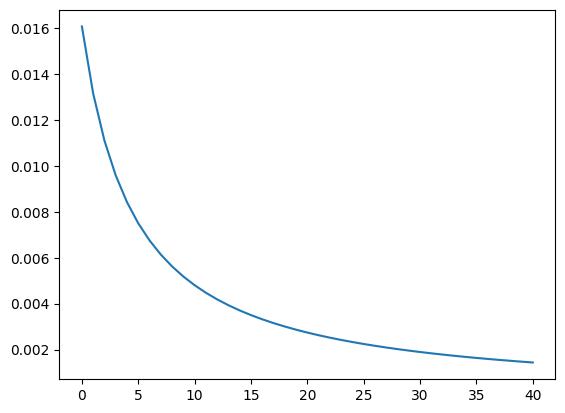

In [ ]:
plt.plot( stats.zipf(a=1.1).pmf(np.arange(5,46)) )

#### Interpolation Zipf / correct prior

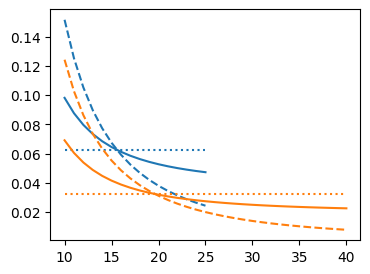

In [ ]:
def get_interp_prior(cond, alpha):
    return alpha*PRIORS_COND[cond] + (1-alpha)*ZIPF_COND[cond]
plt.figure(figsize=(4,3))
for cond,xs in XS_COND.items():
    plt.plot(xs, get_interp_prior(cond, 0),  c=COLORS_COND[cond], ls='--' )
    plt.plot(xs, get_interp_prior(cond, .6), c=COLORS_COND[cond] )
    plt.plot(xs, get_interp_prior(cond, 1),  c=COLORS_COND[cond], ls=':' )

In [ ]:
def mLL_effcoding_interp_prior(dat, cond, alpha, θcost, σ, NUM_RS=10_000):
    xs = XS_COND[cond]
    zpxs = get_interp_prior(cond, alpha)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    correct_w = WIDTHS_COND[cond]
    return mLL(dat, xs, zpxs, μxs, ν, σ, correct_w, NUM_RS=NUM_RS)

def mLL_effcoding_interp_prior_rectified(dat, cond, alpha, θcost, σ, NUM_RS=10_000):
    xs = XS_COND[cond]
    zpxs = get_interp_prior(cond, alpha)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    correct_w = WIDTHS_COND[cond]
    return mLL_rectified(dat, xs, zpxs, μxs, ν, σ, correct_w, NUM_RS=NUM_RS)

In [ ]:
@cache
def mLL_allsubjects_interp_prior(cond, alpha, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_effcoding_interp_prior(dat, cond, alpha, θcost, σ, NUM_RS=NUM_RS)
@cache
def mLL_onesubject_interp_prior(sid, cond, alpha, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)].loc[sid]
    return mLL_effcoding_interp_prior(dat, cond, alpha, θcost, σ, NUM_RS=NUM_RS)

In [ ]:
@cache
def mLL_allsubjects_interp_prior_rectified(cond, alpha, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_effcoding_interp_prior_rectified(dat, cond, alpha, θcost, σ, NUM_RS=NUM_RS)

In [ ]:
mLL_allsubjects_interp_prior(NARROW, .6, .1, 3), mLL_allsubjects_interp_prior_rectified(NARROW, .6, .1, 3)

(18649.17622971212, 18739.902393827502)

In [ ]:
def objf_interpmodel(x):
    alpha, θcost, σ = x
    r  = mLL_allsubjects_interp_prior(NARROW, alpha, θcost, σ)
    r += mLL_allsubjects_interp_prior(WIDE, alpha, θcost, σ)
    #print(x, r)
    return r
res, all_res = min_objf(objf_interpmodel, x0s=itertools.product([.2, .5, .8], [.1,1], [3,]), bounds=[(0,1), (0,None), (0,None) ], return_all_res=True )
print(res)

(0.2, 0.1, 3) -> [0.         0.11843743 2.07254012] 40763.60365274883
(0.2, 1, 3) -> [0.         0.11843832 2.07254268] 40763.60365277301
(0.5, 0.1, 3) -> [0.         0.11844001 2.07251768] 40763.60365297792
(0.5, 1, 3) -> [0.         0.11843692 2.07254646] 40763.60365274621
(0.8, 0.1, 3) -> [0.         0.11843706 2.07253895] 40763.60365275913
(0.8, 1, 3) -> [0.         0.11843739 2.07254421] 40763.603652745296
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40763.603652745296
        x: [ 0.000e+00  1.184e-01  2.073e+00]
      nit: 12
      jac: [ 5.952e+02  1.601e-02  1.455e-03]
     nfev: 88
     njev: 22
 hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>


In [ ]:
def objf_interpmodel_rectified(x):
    alpha, θcost, σ = x
    r  = mLL_allsubjects_interp_prior_rectified(NARROW, alpha, θcost, σ)
    r += mLL_allsubjects_interp_prior_rectified(WIDE, alpha, θcost, σ)
    #print(x, r)
    return r
res, all_res = min_objf(objf_interpmodel_rectified, x0s=itertools.product([.2, .5, .8], [.1,1], [3,]), bounds=[(0,1), (0,None), (0,None) ], return_all_res=True )
print(res)

(0.2, 0.1, 3) -> [0.         0.13389402 1.96791335] 40466.316135533074
(0.2, 1, 3) -> [0.         0.13389393 1.96791129] 40466.31613553257
(0.5, 0.1, 3) -> [0.         0.13389434 1.96791229] 40466.31613552819
(0.5, 1, 3) -> [0.         0.13389459 1.96791063] 40466.31613552608
(0.8, 0.1, 3) -> [0.         0.13389571 1.96790974] 40466.31613555686
(0.8, 1, 3) -> [0.         0.13389473 1.96790995] 40466.31613552678
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40466.31613552608
        x: [ 0.000e+00  1.339e-01  1.968e+00]
      nit: 12
      jac: [ 4.960e+02  1.746e-02  0.000e+00]
     nfev: 72
     njev: 18
 hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>


0.16648829503706308
0.11958925944348904


(0.0, 4.531341424707217)

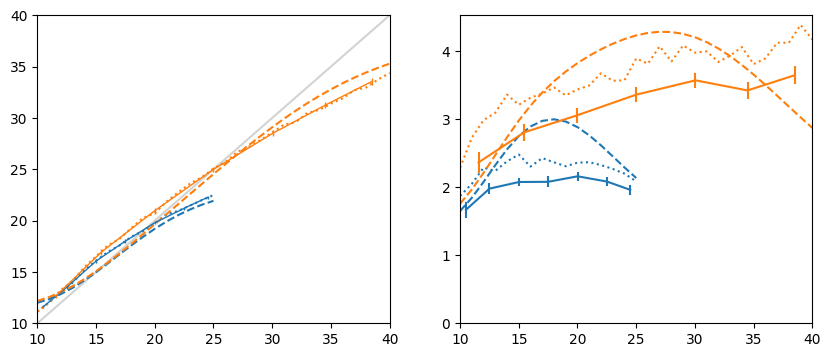

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    alpha, θcost, σ = res.x
    zpxs = get_interp_prior(cond, alpha)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    print(ν)
    pxhatx, avg_ests, stddev_ests = model_predictions(xs, zpxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    #axs[0].plot(xs, avg_ests-xs, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    for k, avgzz in binAvgs[cond].items():
        ns = binNs[cond][k] # shape = (nbSubj, k)
        stdzz = binStds[cond][k]
        xx = ns.mean(axis=0)
        if k=='A':
            pass #axs[0].plot(xx, np.nanmean(avgzz, axis=0), '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
        else:
            axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
            #axs[0].errorbar(xx, np.nanmean(avgzz, axis=0)-xx, stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
            axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

In [ ]:
def objf_interpmodel2(x):
    alpha_n, alpha_w, θcost, σ = x
    r  = mLL_allsubjects_interp_prior(NARROW, alpha_n, θcost, σ)
    r += mLL_allsubjects_interp_prior(WIDE, alpha_w, θcost, σ)
    #print(x, r)
    return r
res = min_objf(objf_interpmodel2, x0s=itertools.product([.2, .5, .8], [.2, .5, .8], [.1,1], [3,]), bounds=[(0,1), (0,1), (0,None), (0,None) ] )
print(res)

(0.2, 0.2, 0.1, 3) -> [0.77077588 0.         0.15244274 1.94645293] 40660.04217558319
(0.2, 0.2, 1, 3) -> [0.43819653 0.43819653 0.70225433 2.106763  ] 41562.26529741545
(0.2, 0.5, 0.1, 3) -> [0.77075024 0.         0.15244115 1.94645033] 40660.042175677445
(0.2, 0.5, 1, 3) -> [0.77076845 0.         0.15244211 1.94645028] 40660.04217557842
(0.2, 0.8, 0.1, 3) -> [0.44010649 0.54998705 0.124856   2.10677468] 41125.61337200727
(0.2, 0.8, 1, 3) -> [0.77076852 0.         0.1524441  1.94645725] 40660.04217568743
(0.5, 0.2, 0.1, 3) -> [0.77077438 0.         0.15244077 1.94645859] 40660.04217560406
(0.5, 0.2, 1, 3) -> [0.65151515 0.44242424 0.6969697  2.09090909] 41482.63211966207
(0.5, 0.5, 0.1, 3) -> [0.77076858 0.         0.15243367 1.94645349] 40660.042176721894
(0.5, 0.5, 1, 3) -> [0.77077178 0.         0.15244245 1.9464525 ] 40660.04217557679
(0.5, 0.8, 0.1, 3) -> [0.6478964  0.55283939 0.12689337 2.11785836] 41108.89809698032
(0.5, 0.8, 1, 3) -> [0.77075182 0.         0.15244057 1.946451

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


In [ ]:
def objf_interpmodel2_rectified(x):
    alpha_n, alpha_w, θcost, σ = x
    r  = mLL_allsubjects_interp_prior_rectified(NARROW, alpha_n, θcost, σ)
    r += mLL_allsubjects_interp_prior_rectified(WIDE, alpha_w, θcost, σ)
    #print(x, r)
    return r
res = min_objf(objf_interpmodel2_rectified, x0s=itertools.product([.5, .8], [.2, .5,], [.1,1], [2,]), bounds=[(0,1), (0,1), (0,None), (0,None) ] )
print(res)

(0.5, 0.2, 0.1, 2) -> [0.82535052 0.         0.16806233 1.89055735] 40351.86996116243
(0.5, 0.2, 1, 2) -> [0.82534782 0.         0.16806343 1.8905468 ] 40351.869961107965
(0.5, 0.5, 0.1, 2) -> [0.82537102 0.         0.16806377 1.89053765] 40351.86996124583
(0.5, 0.5, 1, 2) -> [0.825335   0.         0.16806399 1.89054676] 40351.86996116661
(0.8, 0.2, 0.1, 2) -> [0.8254086  0.         0.16806117 1.89056702] 40351.86996181653
(0.8, 0.2, 1, 2) -> [0.82532439 0.         0.16806403 1.89054853] 40351.86996126759
(0.8, 0.5, 0.1, 2) -> [0.82800388 0.         0.16808357 1.89087527] 40351.87125183108
(0.8, 0.5, 1, 2) -> [0.82532376 0.         0.16806243 1.89054835] 40351.86996127687
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40351.869961107965
        x: [ 8.253e-01  0.000e+00  1.681e-01  1.891e+00]
      nit: 12
      jac: [ 3.638e-03  6.067e+02 -1.019e-02 -1.455e-03]
     nfev: 90
     njev: 18
 hess_inv: <4x4 LbfgsInvHessProduct with dtyp

(0.0, 4.535223485398879)

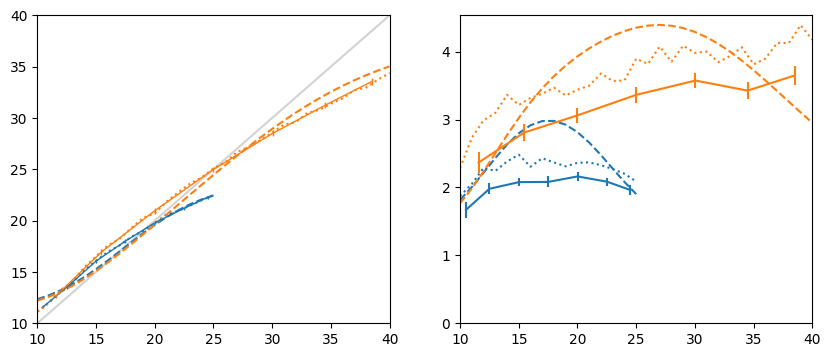

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    alpha_n, alpha_w, θcost, σ = res.x
    zpxs = get_interp_prior(cond, {NARROW:alpha_n, WIDE:alpha_w}[cond])
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions(xs, zpxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    #axs[0].plot(xs, avg_ests-xs, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    for k, avgzz in binAvgs[cond].items():
        ns = binNs[cond][k] # shape = (nbSubj, k)
        stdzz = binStds[cond][k]
        xx = ns.mean(axis=0)
        if k=='A':
            pass #axs[0].plot(xx, np.nanmean(avgzz, axis=0), '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
        else:
            axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
            #axs[0].errorbar(xx, np.nanmean(avgzz, axis=0)-xx, stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
            axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

#### Zipf per cond

In [ ]:
def mLL_effcoding_zipf(dat, cond, zipfpow, θcost, σ, NUM_RS=10_000):
    xs = XS_COND[cond]
    #zpxs = stats.zipf(a=zipfpow).pmf(xs)
    zpxs = 1/xs**zipfpow
    zpxs /= zpxs.sum()
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    correct_w = WIDTHS_COND[cond]
    return mLL_rectified(dat, xs, zpxs, μxs, ν, σ, correct_w, NUM_RS=NUM_RS)

In [ ]:
@cache
def mLL_allsubjects_zipf(cond, zipfpow, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_effcoding_zipf(dat, cond, zipfpow, θcost, σ, NUM_RS=NUM_RS)

In [ ]:
def objf_zipfmodel(x):
    z_n, z_w, θcost, σ = x
    r  = mLL_allsubjects_zipf(NARROW, z_n, θcost, σ)
    r += mLL_allsubjects_zipf(WIDE,   z_w, θcost, σ)
    #print(x, r)
    return r
res = min_objf(objf_zipfmodel, x0s=itertools.product([1, 2], [1, 2], [.1,1], [3,]), bounds=[(1e-3,None), (1e-3,None), (0,None), (0,None) ] )
print(res)

(1, 1, 0.1, 3) -> [0.67110443 2.74777911 0.1026026  2.01421352] 40298.5781562833
(1, 1, 1, 3) -> [0.67142901 2.74785221 0.10261722 2.01428193] 40298.57817743798
(1, 2, 0.1, 3) -> [0.67129523 2.7478246  0.10260236 2.01419544] 40298.5781543194
(1, 2, 1, 3) -> [0.67150254 2.74773155 0.10260552 2.01418745] 40298.57815497639
(2, 1, 0.1, 3) -> [0.67128114 2.7477093  0.10261098 2.01416943] 40298.57815385428
(2, 1, 1, 3) -> [0.67124944 2.74771395 0.10261055 2.01417071] 40298.57815396016
(2, 2, 0.1, 3) -> [0.67123737 2.74769334 0.10261391 2.01415739] 40298.578154183546
(2, 2, 1, 3) -> [0.67131619 2.74776778 0.10260602 2.01418904] 40298.57815377394
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40298.57815377394
        x: [ 6.713e-01  2.748e+00  1.026e-01  2.014e+00]
      nit: 17
      jac: [ 2.910e-03  6.548e-03  1.746e-02  5.821e-03]
     nfev: 110
     njev: 22
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>


(0.0, 4.531341424707217)

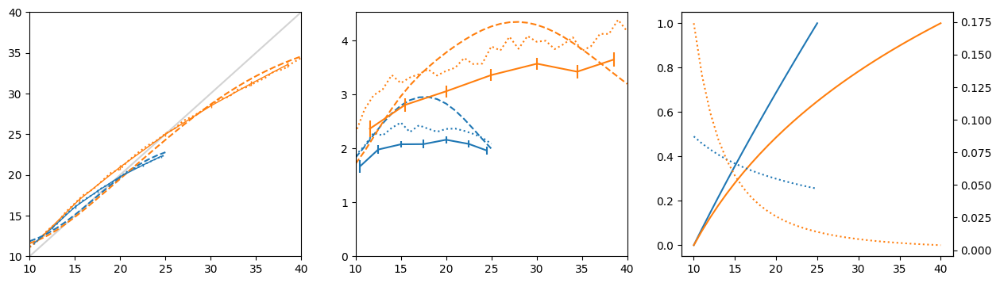

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    z_n, z_w, θcost, σ = res.x
    #zpxs = stats.zipf(a={NARROW:z_n, WIDE:z_w}[cond]).pmf(xs)
    zpxs = 1/xs**{NARROW:z_n, WIDE:z_w}[cond]
    zpxs /= zpxs.sum()
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, zpxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, zpxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

##### Re-centered

In [ ]:
def mLL_effcoding_recenteredzipf(dat, cond, xm, zipfpow, θcost, σ, NUM_RS=10_000):
    xs = XS_COND[cond]
    #zpxs = stats.zipf(a=zipfpow).pmf(xs-xm)
    zpxs = 1./(xs-xm)**zipfpow
    zpxs /= zpxs.sum()
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    correct_w = WIDTHS_COND[cond]
    return mLL_rectified(dat, xs, zpxs, μxs, ν, σ, correct_w, NUM_RS=NUM_RS)

In [ ]:
@cache
def mLL_allsubjects_recenteredzipf(cond, xm, zipfpow, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_effcoding_recenteredzipf(dat, cond, xm, zipfpow, θcost, σ, NUM_RS=NUM_RS)

In [ ]:
def objf_zipfmodel(x):
    xm_n, z_n, xm_w, z_w, θcost, σ = x
    r  = mLL_allsubjects_recenteredzipf(NARROW, xm_n, z_n, θcost, σ)
    r += mLL_allsubjects_recenteredzipf(WIDE,   xm_w, z_w, θcost, σ)
    #print(x, r)
    return r
res = min_objf(objf_zipfmodel,
               x0s=itertools.product([1.,9.,], [1.1, 2], [1.,], [1.1, 2], [.1,1], [3,]),
               bounds=[(0,9.99), (1e-2,None), (0,9.99), (1e-2,None), (0,None), (0,None) ] )
print(res)

(1.0, 1.1, 1.0, 1.1, 0.1, 3) -> [0.         0.6713277  0.         2.74769693 0.10260994 2.0141688 ] 40298.5781540063
(1.0, 1.1, 1.0, 1.1, 1, 3) -> [0.         0.6712987  0.         2.74777005 0.10260605 2.01418475] 40298.57815381598
(1.0, 1.1, 1.0, 2, 0.1, 3) -> [0.         0.67115907 0.         2.74769415 0.10261702 2.01408224] 40298.57815905457
(1.0, 1.1, 1.0, 2, 1, 3) -> [0.         0.671327   0.         2.7477752  0.10260587 2.01418442] 40298.57815378677


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Docu

(1.0, 2, 1.0, 1.1, 0.1, 3) -> [9.84562088e-01 1.96469788e+00 1.12894031e+00 4.96022072e+00 4.60638032e-03 2.88702075e+00] 40444.0467302518
(1.0, 2, 1.0, 1.1, 1, 3) -> [0.         0.67131659 0.         2.7477704  0.10260628 2.01418528] 40298.578153777125
(1.0, 2, 1.0, 2, 0.1, 3) -> [0.         0.67114063 0.         2.74781799 0.10259522 2.01433453] 40298.578166482046
(1.0, 2, 1.0, 2, 1, 3) -> [0.         0.67140847 0.         2.74765351 0.10261243 2.01422034] 40298.57815703555
(9.0, 1.1, 1.0, 1.1, 0.1, 3) -> [0.         0.67132386 0.         2.74774461 0.10260665 2.01418867] 40298.57815378443
(9.0, 1.1, 1.0, 1.1, 1, 3) -> [0.         0.67145992 0.         2.74780281 0.10260538 2.01419546] 40298.57815462631
(9.0, 1.1, 1.0, 2, 0.1, 3) -> [0.         0.67136933 0.         2.74778843 0.10260406 2.0141896 ] 40298.578153864626
(9.0, 1.1, 1.0, 2, 1, 3) -> [0.         0.67130803 0.         2.7477469  0.10260769 2.01418672] 40298.578153753624
(9.0, 2, 1.0, 1.1, 0.1, 3) -> [8.62742854e+00 1.53838

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Docu

(9.0, 2, 1.0, 1.1, 1, 3) -> [8.742974   1.63116791 0.99986161 1.09525944 0.85566936 2.46793225] 44269.350924461876
(9.0, 2, 1.0, 2, 0.1, 3) -> [8.62874832e+00 1.61389671e+00 1.18107170e+00 5.22119523e+00 3.18366378e-03 2.72386660e+00] 40420.55829469836
(9.0, 2, 1.0, 2, 1, 3) -> [8.74753326 1.63894929 0.99638372 1.96821722 0.84226072 2.52657238] 44517.76703572915
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40298.578153753624
        x: [ 0.000e+00  6.713e-01  0.000e+00  2.748e+00  1.026e-01
             2.014e+00]
      nit: 44
      jac: [ 5.166e-01 -7.276e-04  3.776e+00 -5.821e-03 -7.276e-04
             8.004e-03]
     nfev: 350
     njev: 50
 hess_inv: <6x6 LbfgsInvHessProduct with dtype=float64>


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Docu

In [ ]:
res

  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40298.578153753624
        x: [ 0.000e+00  6.713e-01  0.000e+00  2.748e+00  1.026e-01
             2.014e+00]
      nit: 44
      jac: [ 5.166e-01 -7.276e-04  3.776e+00 -5.821e-03 -7.276e-04
             8.004e-03]
     nfev: 350
     njev: 50
 hess_inv: <6x6 LbfgsInvHessProduct with dtype=float64>

(0.0, 4.531341424707217)

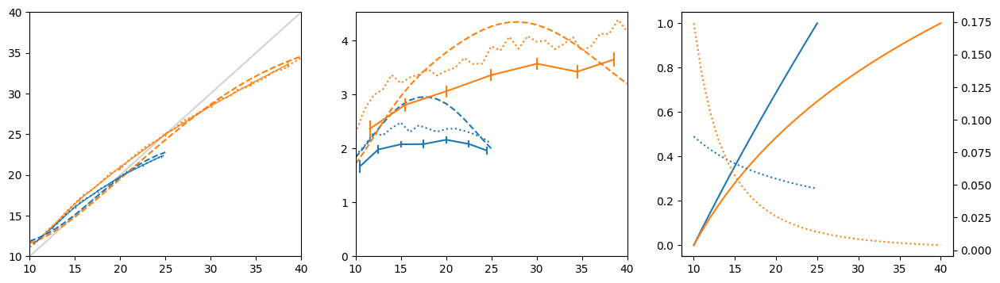

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    xm_n, z_n, xm_w, z_w, θcost, σ = res.x
    zpxs = 1./(xs-{NARROW:xm_n, WIDE:xm_w}[cond])**{NARROW:z_n, WIDE:z_w}[cond]
    zpxs /= zpxs.sum()
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, zpxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, zpxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

#### LogN prior

In [ ]:
def make_lognormal_prior(xs, m, sd, xm=0.):
    pxs = lognormal_pdf_mode_fwhm(xs-xm, m, sd)
    pxs /= pxs.sum()
    return pxs

In [ ]:
make_lognormal_prior(XS_COND[NARROW], 10, 2)

array([6.09951833e-01, 3.24286800e-01, 6.04377552e-02, 5.08466049e-03, 2.32214853e-04, 6.60449760e-06, 1.29812995e-07, 1.91032400e-09,
       2.24035094e-11, 2.19944447e-13, 1.87976848e-15, 1.44324611e-17, 1.02107643e-19, 6.79577915e-22, 4.32744992e-24, 2.67348438e-26])

In [ ]:
@cache
def mLL_allsubjects_lognormal_prior_μ(cond, m, sd, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    xs = XS_COND[cond]
    pxs = make_lognormal_prior(xs, m, sd)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=pxs, θcost=θcost)
    return mLL_rectified(dat, xs, pxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS)

In [ ]:
def objf_lognormalprior_model(x):
    m_n, sd_n, m_w, sd_w, θcost, σ = x
    r  = mLL_allsubjects_lognormal_prior_μ(NARROW, m_n, sd_n, θcost, σ)
    r += mLL_allsubjects_lognormal_prior_μ(WIDE, m_w, sd_w, θcost, σ)
    #if np.isinf(r):
    #    print(x, r)
    return r

In [ ]:
res = min_objf(objf_lognormalprior_model,
               #x0s=itertools.product([10,17.5], [4.3,15], [10,25], [8.6,30], [.1,.3], [2,]),
               x0s=itertools.product([10,], [4.3,15], [10,25], [8.6,30], [.1,.3], [2,]),
               bounds=[(1e-1,None),]*4 + [(1e-3,None),]*2 )
print(res)

(10, 4.3, 10, 8.6, 0.1, 2) -> [15.01506129 11.06314515  7.68535518 11.37853923  0.07250313  2.25602858] 40195.249527650056
(10, 4.3, 10, 8.6, 0.3, 2) -> [1.02910816e+01 6.89489392e+00 1.01830727e+01 8.48405777e+00 1.41125288e-03 2.93709793e+00] 40370.03858883922
(10, 4.3, 10, 30, 0.1, 2) -> [5.74304086e-01 8.64736057e+02 9.77239789e+00 1.37927416e+01 1.21447987e-01 2.08175150e+00] 40259.88766075368
(10, 4.3, 10, 30, 0.3, 2) -> [1.81814439e+01 9.06090819e+02 1.01061212e+01 1.39363724e+01 1.21305548e-01 2.09113281e+00] 40262.88968065978
(10, 4.3, 25, 8.6, 0.1, 2) -> [15.01660126 11.31979009  9.28140788 12.4663998   0.07780603  2.25294047] 40194.223583260864
(10, 4.3, 25, 8.6, 0.3, 2) -> [15.00696955 11.15555782  8.48521925 11.93945021  0.07450514  2.2564786 ] 40194.51055253078
(10, 4.3, 25, 30, 0.1, 2) -> [1.00000000e-01 5.95048692e+02 1.50506238e+01 2.59013689e+01 2.37769688e-01 2.04955585e+00] 40573.21754978085
(10, 4.3, 25, 30, 0.3, 2) -> [9.88628389e+00 7.87783835e+00 2.49736434e+01 

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


(0.0, 4.531341424707217)

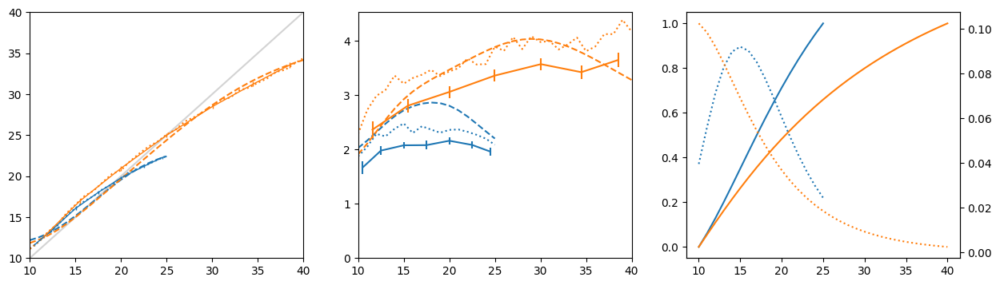

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, m_w, sd_w, θcost, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = make_lognormal_prior(xs, m=(m_n if cond==NARROW else m_w), sd=(sd_n if cond==NARROW else sd_w))
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=pxs, θcost=θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

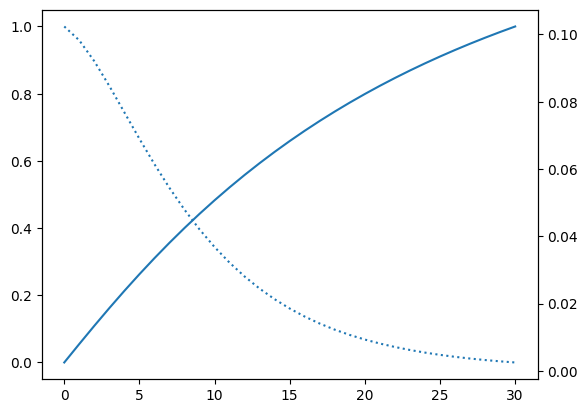

In [ ]:
plt.plot( μxs )
plt.twinx().plot( pxs , ls=':')

In [ ]:
res.x

array([15.01706264, 11.31842111,  9.26930454, 12.46192669,  0.07781498,  2.25257078])

##### Re-centered

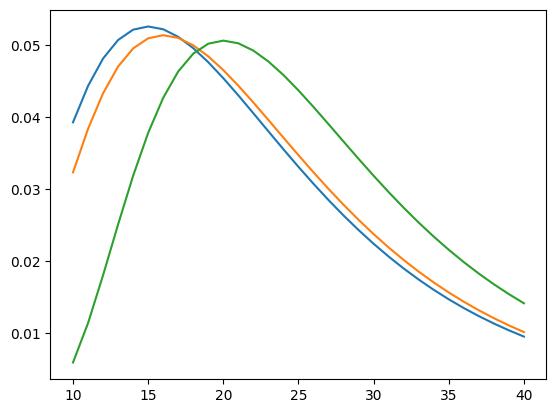

In [ ]:
xs = XS_COND[WIDE]
plt.plot(xs, make_lognormal_prior(xs, m=15, sd=20, xm=0) )
plt.plot(xs, make_lognormal_prior(xs, m=15, sd=20, xm=1) )
plt.plot(xs, make_lognormal_prior(xs, m=15, sd=20, xm=5) )

In [ ]:
@cache
def mLL_allsubjects_recenteredlognormal_prior_μ(cond, xm, m, sd, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    xs = XS_COND[cond]
    pxs = make_lognormal_prior(xs, m, sd, xm=xm)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=pxs, θcost=θcost)
    return mLL_rectified(dat, xs, pxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS)

In [ ]:
def objf_recenteredlognormalprior_model(x):
    xm_n, m_n, sd_n, xm_w, m_w, sd_w, θcost, σ = x
    r  = mLL_allsubjects_recenteredlognormal_prior_μ(NARROW, xm_n, m_n, sd_n, θcost, σ)
    r += mLL_allsubjects_recenteredlognormal_prior_μ(WIDE, xm_w, m_w, sd_w, θcost, σ)
    #if np.isinf(r):
    print(x, r)
    return r

In [ ]:
res = min_objf(objf_recenteredlognormalprior_model,
               #x0s=itertools.product([10,17.5], [4.3,15], [10,25], [8.6,30], [.1,.3], [2,]),
               x0s=[[8., 15.01706264, 11.31842111, 8., 9.26930454, 12.46192669,  0.07781498,  2.25257078],],
               bounds=[(-10,9.99), (1e-1,None), (1e-1,None), (-10,9.99), (1e-1,None), (1e-1,None),] + [(1e-3,None),]*2 )
print(res)

[ 8.         15.01706264 11.31842111  8.          9.26930454 12.46192669  0.07781498  2.25257078] 45629.26841958916
[ 8.00000001 15.01706264 11.31842111  8.          9.26930454 12.46192669  0.07781498  2.25257078] 45629.268438097744
[ 8.         15.01706265 11.31842111  8.          9.26930454 12.46192669  0.07781498  2.25257078] 45629.26843398644
[ 8.         15.01706264 11.31842112  8.          9.26930454 12.46192669  0.07781498  2.25257078] 45629.26841116481
[ 8.         15.01706264 11.31842111  8.00000001  9.26930454 12.46192669  0.07781498  2.25257078] 45629.26842277017
[ 8.         15.01706264 11.31842111  8.          9.26930455 12.46192669  0.07781498  2.25257078] 45629.26842142405
[ 8.         15.01706264 11.31842111  8.          9.26930454 12.4619267   0.07781498  2.25257078] 45629.2684200112
[ 8.         15.01706264 11.31842111  8.          9.26930454 12.46192669  0.07781499  2.25257078] 45629.26852596484
[ 8.         15.01706264 11.31842111  8.          9.26930454 12.46192669

In [ ]:
res

  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40181.414990522426
        x: [-1.000e+01  2.553e+01  1.130e+01 -7.583e+00  1.373e+01
             1.484e+01  7.510e-02  2.264e+00]
      nit: 97
      jac: [ 7.356e-01  1.273e-01  5.457e-02  5.748e-02 -1.448e-01
            -2.110e-02 -4.911e-01  2.183e-01]
     nfev: 1107
     njev: 123
 hess_inv: <8x8 LbfgsInvHessProduct with dtype=float64>

#### Gaussian prior

25

In [ ]:
def make_gaussian_prior(xs, m, sd):
    pxs = num.std_normal_pdf((xs-m)/sd)
    if pxs.sum() == 0: # numerical issue
        x_ref = xs[len(xs)//2]
        logratios = -(xs-x_ref)*((xs+x_ref)/2 - m) / (sd**2) # log of the ratio of the pdfs
        logratios -= logratios.max()
        pxs = np.exp(logratios)
    pxs /= pxs.sum()
    return pxs

In [ ]:
@cache
def mLL_allsubjects_gaussian_prior_μ(cond, m, sd, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    xs = XS_COND[cond]
    pxs = make_gaussian_prior(xs, m, sd)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=pxs, θcost=θcost)
    return mLL_rectified(dat, xs, pxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS)

In [ ]:
def objf_gaussianprior_model(x):
    m_n, sd_n, m_w, sd_w, θcost, σ = x
    r  = mLL_allsubjects_gaussian_prior_μ(NARROW, m_n, sd_n, θcost, σ)
    r += mLL_allsubjects_gaussian_prior_μ(WIDE, m_w, sd_w, θcost, σ)
    #print(x, r)
    return r

In [ ]:
objf_gaussianprior_model([10, 10, 10, 10, .1, 2])

40571.901425444405

In [ ]:
#res = min_objf(objf_gaussianprior_model,
#               x0s=itertools.product([10,17.5], [4.3,15], [10,25], [8.6,30], [.1,.3], [2,]),
#               bounds=[(0,None),]*6 )
#print(res)
res = min_objf_grid(objf_gaussianprior_model,
                    ranges=[slice(6,45,2),   # m_n
                            slice(2,28,2),   # sd_n
                            slice(6,45,2),   # m_w
                            slice(2,33,2),   # sd_w
                            slice(.1,.31,.1), # θcost
                            slice(2,2.1,1.)],
                    bounds=[(None,None), (.1, None), (None,None), (.1, None), (0,None), (0,None)] ) 
res

[16.   6.   8.  12.   0.1  2. ] 40256.35467093182


KeyboardInterrupt: 

In [ ]:
res.x, res.fun

(array([ 1.63379236e+01,  4.81195591e+00, -7.77400956e+01,  2.77398011e+01,  7.15513283e-02,  2.28117743e+00]),
 40165.964890917334)

(0.0, 4.531341424707217)

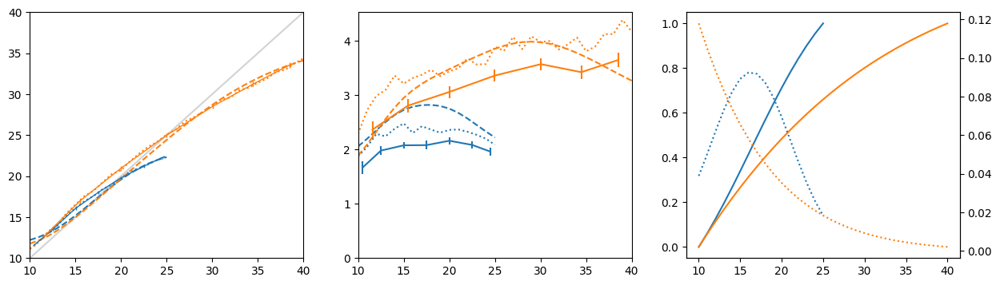

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, m_w, sd_w, θcost, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = make_gaussian_prior(xs, m=(m_n if cond==NARROW else m_w), sd=(sd_n if cond==NARROW else sd_w))
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=pxs, θcost=θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

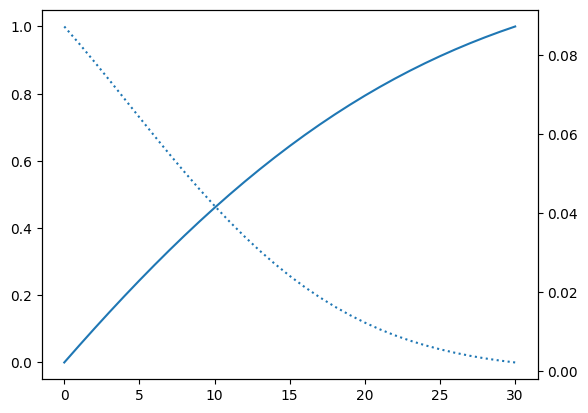

In [ ]:
plt.plot( μxs )
plt.twinx().plot( pxs , ls=':')

### Testing some priors

inf


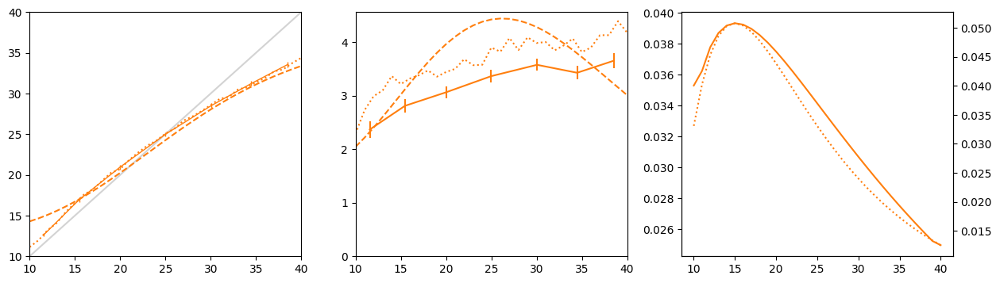

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
tot_mLL = 0.
for ic,cond in enumerate( CONDITIONS[1:] ):
    xs = XS_COND[cond]
    #z_n, z_w, θcost, σ = res.x
    #spxs = np.linspace(2,1,len(xs))**10
    # Zipf
    #sxs = np.arange(xs[0]-5,xs[-1]+5)
    #spxs = 1/sxs**2
    # recentred zipf
    #sxs = xs
    #spxs = 1/(xs-5)**2
    # lognormal
    #spxs = lognormal_pdf_mode_fwhm(sxs, 10, 40)
    #spxs /= spxs.sum()
    # recentred lognormal
    sxs = xs
    spxs = lognormal_pdf_mode_fwhm(sxs-5, 10, 20)
    spxs /= spxs.sum()
    # interpolation between zipf and prior
    #alpha = .4
    #spxs *= (1-alpha)
    #spxs[np.isin(sxs, xs)] += alpha*PRIORS_COND[cond]
    #print(spxs.sum())
    θcost = 1
    σ = 0
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs, θcost)
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    tot_mLL += mLL_rectified(dat, sxs, spxs, μxs, ν, σ, WIDTHS_COND[cond])
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(sxs, spxs, μxs, ν=ν, σ=σ, correct_xs=xs, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs[2].plot(sxs, np.gradient(μxs), c=COLORS_COND[cond],)
    axs2T.plot(sxs, spxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
print(tot_mLL)

In [ ]:
dat

onset  phase  response  nr_frames     n  jitter  start_marker_position  response_time   onset_abs  duration range  error  abs_error  \
subject session run trial_nr                                                                                                                                             
01      1       5   1          71.525105      5      33.0       31.0  28.0     5.0                   35.0       1.334709   75.526725  0.517167  wide    5.0        5.0   
                    2          82.702142      5      31.0       31.0  34.0     6.0                   17.0       1.017693   86.703761  0.517161  wide   -3.0        3.0   
                    3          91.910629      5      21.0       30.0  19.0     5.0                   21.0       1.034245   95.912248  0.500562  wide    2.0        2.0   
                    4         100.685397      5      29.0       30.0  33.0     4.0                   23.0       0.617203  104.687017  0.500385  wide   -4.0        4.0   
                    5         111.828973      5      24.0       31.0  28.0     6.0                   15.0       0.267069  115.830592  0.517222  wide   -4.0        4.0   
...                                  ...    ...       ...        ...   ...     ...                    ...            ...         ...       ...   ...    ...        ...   
38      2       8   26        289.983797      5      33.0       30.0  26.0     5.0                   37.0       2.102051  293.033664  0.500383  wide    7.0        7.0   
                    27        297.874381      5      28.0       30.0  31.0     4.0                   25.0       0.800716  300.924248  0.500441  wide   -3.0        3.0   
                    28        309.251606      5      13.0       30.0  11.0     6.0                   18.0       0.697490  312.301473  0.500356  wide    2.0        2.0   
                    29        318.076386      5      30.0       31.0  28.0     4.0                   16.0       0.330698  321.126253  0.517094  wide    2.0        2.0   
                    30        327.168103      5      34.0       30.0  32.0     5.0                   30.0       0.230110  330.217970  0.500479  wide    2.0        2.0   

                              squared_error  
subject session run trial_nr                 
01      1       5   1                  25.0  
                    2                   9.0  
                    3                   4.0  
                    4                  16.0  
                    5                  16.0  
...                                     ...  
38      2       8   26                 49.0  
                    27                  9.0  
                    28                  4.0  
                    29                  4.0  
                    30                  4.0  

[8214 rows x 14 columns]

### Wider prior

#### Interpolation Zipf

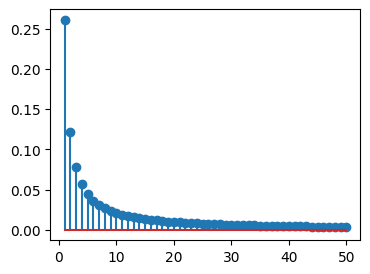

In [ ]:
ZIPF_XS = np.arange(1,51)
ZIPF_PXS = stats.zipf(a=1.1).pmf(ZIPF_XS)
ZIPF_PXS /= ZIPF_PXS.sum()
plt.figure(figsize=(4,3)); plt.stem(ZIPF_XS, ZIPF_PXS,)
ZIPF_XS.flags.writeable = False
ZIPF_PXS.flags.writeable = False

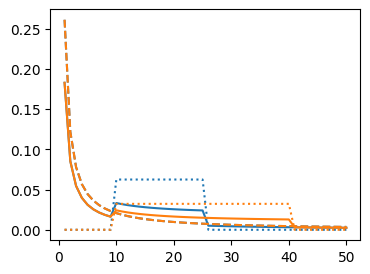

In [ ]:
def get_interp_wideZipfprior(cond, alpha):
    r = (1-alpha)*ZIPF_PXS
    r[ np.isin(ZIPF_XS, XS_COND[cond]) ] += alpha*PRIORS_COND[cond]
    return r
plt.figure(figsize=(4,3))
for cond in CONDITIONS:
    plt.plot(ZIPF_XS, get_interp_wideZipfprior(cond, 0),  c=COLORS_COND[cond], ls='--' )
    plt.plot(ZIPF_XS, get_interp_wideZipfprior(cond, .3), c=COLORS_COND[cond] )
    plt.plot(ZIPF_XS, get_interp_wideZipfprior(cond, 1),  c=COLORS_COND[cond], ls=':' )

In [ ]:
def mLL_effcoding_interp_wideZipf(dat, cond, alpha, θcost, σ, NUM_RS=10_000):
    zpxs = get_interp_wideZipfprior(cond, alpha)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    correct_w = WIDTHS_COND[cond]
    return mLL(dat, ZIPF_XS, zpxs, μxs, ν, σ, correct_w, NUM_RS=NUM_RS)

In [ ]:
@cache
def mLL_allsubjects_interp_wideZipf(cond, alpha, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_effcoding_interp_wideZipf(dat, cond, alpha, θcost, σ, NUM_RS=NUM_RS)
@cache
def mLL_onesubject_interp_wideZipf(sid, cond, alpha, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)].loc[sid]
    return mLL_effcoding_interp_wideZipf(dat, cond, alpha, θcost, σ, NUM_RS=NUM_RS)

In [ ]:
mLL_allsubjects_interp_wideZipf(NARROW, .7, .05, 3)

18519.372362946036

In [ ]:
def objf_interpwideZipfmodel(x):
    alpha, θcost, σ = x
    r  = mLL_allsubjects_interp_wideZipf(NARROW, alpha, θcost, σ)
    r += mLL_allsubjects_interp_wideZipf(WIDE, alpha, θcost, σ)
    #print(x, r)
    return r
res, all_res = min_objf(objf_interpwideZipfmodel, x0s=itertools.product([.2, .5, .8, .9, .95], [.1,1], [1, 3,]), bounds=[(0,1), (0,None), (0,None) ], return_all_res=True )
print(res)

(0.2, 0.1, 1) -> [0.23049284 0.0961884  1.99952772] 41423.88648523945
(0.2, 0.1, 3) -> [0.51927711 0.0939772  1.80901737] 41025.82824376323
(0.2, 1, 1) -> [0.39889689 0.95184222 0.88611848] 43615.449660886865
(0.2, 1, 3) -> [0.49796804 0.93666271 1.12408757] 42905.498195226435
(0.5, 0.1, 1) -> [0.90506357 0.32292147 1.07958151] 40721.16268806685
(0.5, 0.1, 3) -> [0.90506358 0.32291918 1.07958154] 40721.16268808168
(0.5, 1, 1) -> [0.50420299 0.99159401 1.99995584] 42952.63300764469
(0.5, 1, 3) -> [0.65617376 0.68765248 2.06295743] 41933.92883306864
(0.8, 0.1, 1) -> [0.90506361 0.32291886 1.07958525] 40721.16268807494
(0.8, 0.1, 3) -> [0.87177062 0.35610313 0.        ] 40869.725928267544
(0.8, 1, 1) -> [0.8 1.  1. ] 41512.30901621483
(0.8, 1, 3) -> [0.86311944 0.6844028  2.0532084 ] 41364.35660471044
(0.9, 0.1, 1) -> [0.90506308 0.32292071 1.07958818] 40721.162688062264
(0.9, 0.1, 3) -> [0.90506347 0.3229224  1.07958277] 40721.16268807242
(0.9, 1, 1) -> [0.9 1.  1. ] 41210.32486957406
(0

(0.0, 4.609483779918572)

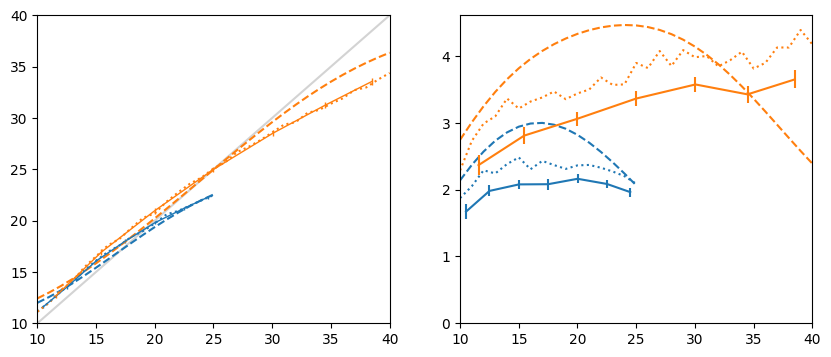

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    alpha, θcost, σ = res.x
    zpxs = get_interp_wideZipfprior(cond, alpha)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions(ZIPF_XS, zpxs, μxs, ν=ν, σ=σ, correct_xs=xs, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    for k, avgzz in binAvgs[cond].items():
        ns = binNs[cond][k] # shape = (nbSubj, k)
        stdzz = binStds[cond][k]
        xx = ns.mean(axis=0)
        if k=='A':
            pass #axs[0].plot(xx, np.nanmean(avgzz, axis=0), '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
        else:
            axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
            axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

(0.0, 4.5396494683243755)

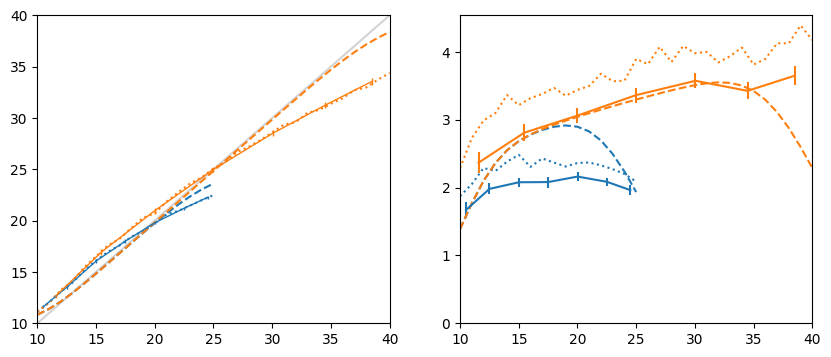

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    zpxs = get_interp_wideZipfprior(cond, alpha=0)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost=.015)
    #print(μxs)
    pxhatx, avg_ests, stddev_ests = model_predictions(ZIPF_XS, zpxs, μxs, ν=ν, σ=σ*0, correct_xs=xs, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    for k, avgzz in binAvgs[cond].items():
        ns = binNs[cond][k] # shape = (nbSubj, k)
        stdzz = binStds[cond][k]
        xx = ns.mean(axis=0)
        if k=='A':
            pass #axs[0].plot(xx, np.nanmean(avgzz, axis=0), '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
        else:
            axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
            axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

In [ ]:
def objf_interpwideZipfmodel_2(x):
    alpha_n, alpha_w, θcost, σ = x
    r  = mLL_allsubjects_interp_wideZipf(NARROW, alpha_n, θcost, σ)
    r += mLL_allsubjects_interp_wideZipf(WIDE, alpha_w, θcost, σ)
    #print(x, r)
    return r
res = min_objf(objf_interpwideZipfmodel_2, x0s=itertools.product([.3, .8, .9], [.3, .8, .9], [.1,1], [2,]), bounds=[(0,1),(0,1), (0,None), (0,None) ] )
print(res)

(0.3, 0.3, 0.1, 2) -> [0.91026904 0.48309801 0.19585841 0.90359178] 40636.640449109764
(0.3, 0.3, 1, 2) -> [0.30386549 0.30386549 0.99447787 2.99996981] 44123.21193502849
(0.3, 0.8, 0.1, 2) -> [1.         0.34467437 0.11600056 1.82115618] 40871.805172974986
(0.3, 0.8, 1, 2) -> [0.7624732  0.92138662 0.87655472 0.        ] 41828.724760678044
(0.3, 0.9, 0.1, 2) -> [1.         0.34465927 0.11600227 1.82112297] 40871.805173106375
(0.3, 0.9, 1, 2) -> [0.78934915 0.94745837 0.88014148 0.        ] 41995.60214085963
(0.8, 0.3, 0.1, 2) -> [0.91026551 0.48312359 0.19586104 0.9035708 ] 40636.64044951505
(0.8, 0.3, 1, 2) -> [0.88504865 0.59767028 0.57475674 1.14951349] 41104.315759619625
(0.8, 0.8, 0.1, 2) -> [0.91026751 0.48309681 0.19585502 0.90359649] 40636.64044897504
(0.8, 0.8, 1, 2) -> [0.88873565 0.88873565 0.55632175 1.11264349] 40866.80712824267
(0.8, 0.9, 0.1, 2) -> [0.91026819 0.483091   0.19585698 0.90356712] 40636.64044922552
(0.8, 0.9, 1, 2) -> [0.88899883 0.94449942 0.55500584 1.110

(0.0, 4.797075749977456)

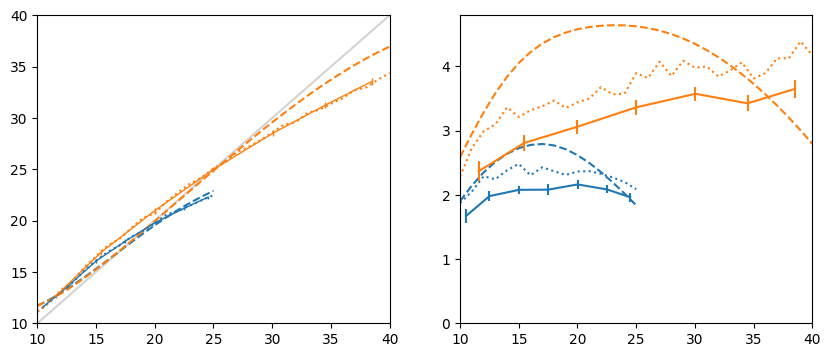

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    alpha_n, alpha_w, θcost, σ = res.x
    zpxs = get_interp_wideZipfprior(cond, {NARROW:alpha_n, WIDE:alpha_w}[cond])
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions(ZIPF_XS, zpxs, μxs, ν=ν, σ=σ, correct_xs=xs, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    for k, avgzz in binAvgs[cond].items():
        ns = binNs[cond][k] # shape = (nbSubj, k)
        stdzz = binStds[cond][k]
        xx = ns.mean(axis=0)
        if k=='A':
            pass #axs[0].plot(xx, np.nanmean(avgzz, axis=0), '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
        else:
            axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
            axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

#### Zipf cond

In [ ]:
def mLL_effcoding_wideZipf(dat, cond, zipfpow, θcost, σ, NUM_RS=10_000):
    zpxs = 1/ZIPF_XS**zipfpow
    zpxs /= zpxs.sum()
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    correct_w = WIDTHS_COND[cond]
    return mLL_rectified(dat, ZIPF_XS, zpxs, μxs, ν, σ, correct_w, NUM_RS=NUM_RS)

In [ ]:
@cache
def mLL_allsubjects_wideZipf(cond, zipfpow, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_effcoding_wideZipf(dat, cond, zipfpow, θcost, σ, NUM_RS=NUM_RS)

In [ ]:
def objf_wideZipfmodel(x):
    z_n, z_w, θcost, σ = x
    θcost /= 1000
    #print(x)
    r  = mLL_allsubjects_wideZipf(NARROW, z_n, θcost, σ)
    r += mLL_allsubjects_wideZipf(WIDE,   z_w, θcost, σ)
    #print(x, r)
    return r
res = min_objf(objf_wideZipfmodel, x0s=itertools.product([1.1, 2], [1.1, 2], [1.,], [2,]), bounds=[(.1,None),(.1,None), (1e-9,None), (1e-3,None) ]  )
print(res)

(1.1, 1.1, 1.0, 2) -> [4.01511592e+00 5.48303251e+00 2.93094912e-06 3.04796107e+00] 40716.49131280666
(1.1, 2, 1.0, 2) -> [4.34538958e+00 5.25058560e+00 8.07789932e-06 2.93549077e+00] 40709.38550764356
(2, 1.1, 1.0, 2) -> [4.17838781e+00 6.10406405e+00 1.85379755e-07 3.09260092e+00] 40674.2885411692
(2, 2, 1.0, 2) -> [1.28728256 3.18236096 0.04582232 2.64256653] 40872.30517554006
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40674.2885411692
        x: [ 4.178e+00  6.104e+00  1.854e-07  3.093e+00]
      nit: 94
      jac: [-3.337e+00 -7.942e+01  4.053e+07  4.998e+02]
     nfev: 1290
     njev: 258
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


(0.0, 4.960650775631175)

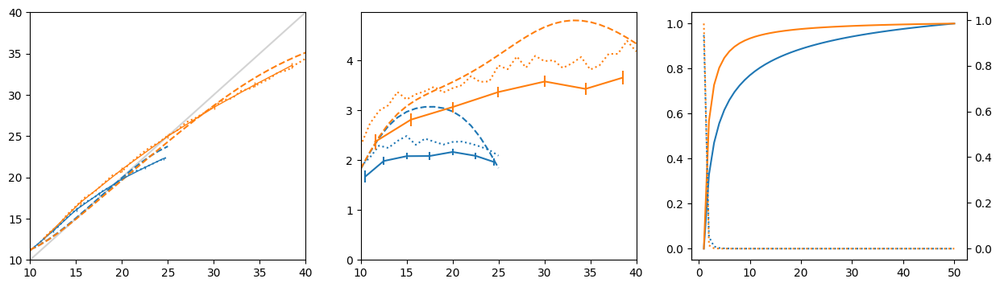

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    z_n, z_w, θcost, σ = res.x
    θcost /= 1000
    zpxs = stats.zipf(a={NARROW:z_n, WIDE:z_w}[cond]).pmf(ZIPF_XS)
    zpxs /= zpxs.sum()
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(ZIPF_XS, zpxs, μxs, ν=ν, σ=σ, correct_xs=xs, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(ZIPF_XS, μxs, c=COLORS_COND[cond],)
    axs2T.plot(ZIPF_XS, zpxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

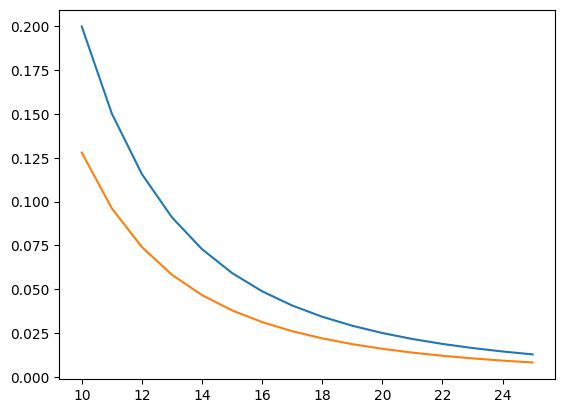

In [ ]:
xs = XS_COND[NARROW]
aa = 2; xm = 10
pxs = aa*xm**aa/xs**(aa+1)
plt.plot(xs, pxs)
aa = 2; xm = 8
pxs = aa*xm**aa/xs**(aa+1)
plt.plot(xs, pxs)

In [ ]:
def mLL_effcoding_slightlywideZipf(dat, cond, zipfpow, θcost, σ, NUM_RS=10_000):
    xs = XS_COND[cond]
    sxs = np.arange(xs[0]-1, xs[-1]+1+1)
    zpxs = 1/sxs**zipfpow
    zpxs /= zpxs.sum()
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    correct_w = WIDTHS_COND[cond]
    return mLL_rectified(dat, sxs, zpxs, μxs, ν, σ, correct_w, NUM_RS=NUM_RS)

In [ ]:
@cache
def mLL_allsubjects_slightlywideZipf(cond, zipfpow, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_effcoding_slightlywideZipf(dat, cond, zipfpow, θcost, σ, NUM_RS=NUM_RS)

In [ ]:
def objf_slightlywideZipfmodel(x):
    z_n, z_w, θcost, σ = x
    θcost /= 1000
    #print(x)
    r  = mLL_allsubjects_slightlywideZipf(NARROW, z_n, θcost, σ)
    r += mLL_allsubjects_slightlywideZipf(WIDE,   z_w, θcost, σ)
    #print(x, r)
    return r
res = min_objf(objf_slightlywideZipfmodel, x0s=itertools.product([1.1, 2], [1.1, 2], [.1,], [2,]), bounds=[(.1,None),(.1,None), (1e-6,None), (1e-3,None) ]  )
print(res)

(1.1, 1.1, 0.1, 2) -> [1.09803860e+01 9.51068024e+00 3.37648967e-03 2.95546440e+00] 40351.758463031954
(1.1, 2, 0.1, 2) -> [1.10068062e+01 9.52509293e+00 3.29728154e-03 2.95374242e+00] 40351.750631288494
(2, 1.1, 0.1, 2) -> [5.66892537 5.88163325 1.13609157 2.74122601] 40403.360801104165
(2, 2, 0.1, 2) -> [1.10063719e+01 9.52457382e+00 3.29955137e-03 2.95368993e+00] 40351.75061916797
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40351.75061916797
        x: [ 1.101e+01  9.525e+00  3.300e-03  2.954e+00]
      nit: 68
      jac: [-5.821e-03  2.183e-02  1.324e+00 -5.894e-02]
     nfev: 465
     njev: 93
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>


In [ ]:
def mLL_effcoding_widescaleZipf(dat, cond, zipfpow, zipfm, θcost, σ, NUM_RS=10_000):
    sxs = ZIPF_XS[ZIPF_XS>=zipfm]
    zpxs = zipfpow*(zipfm**zipfpow)/sxs**(zipfpow+1)
    zpxs /= zpxs.sum()
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    correct_w = WIDTHS_COND[cond]
    return mLL_rectified(dat, sxs, zpxs, μxs, ν, σ, correct_w, NUM_RS=NUM_RS)

In [ ]:
@cache
def mLL_allsubjects_widescaleZipf(cond, zipfpow, zipfm, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_effcoding_widescaleZipf(dat, cond, zipfpow, zipfm, θcost, σ, NUM_RS=NUM_RS)

In [ ]:
def objf_widescaleZipfmodel(x):
    z_n, m_n, z_w, m_w, θcost, σ = x
    θcost /= 100
    #print(x)
    r  = mLL_allsubjects_widescaleZipf(NARROW, z_n, m_n, θcost, σ)
    r += mLL_allsubjects_widescaleZipf(WIDE,   z_w, m_w, θcost, σ)
    #print(x, r)
    return r
res = min_objf(objf_widescaleZipfmodel, x0s=itertools.product([1.1, 2], [5, 9,], [1.1, 2], [5, 9,], [1.,], [2,]), bounds=[(.1,None),(1,10), (.1,None), (1,10), (1e-9,None), (1e-3,None) ]  )
print(res)

(1.1, 5, 1.1, 5, 1.0, 2) -> [1.09671550e-01 5.01031143e+00 6.59784269e+00 4.99654500e+00 6.32729220e-05 3.08452948e+00] 40572.65262988405
(1.1, 5, 1.1, 9, 1.0, 2) -> [0.11900364 5.00399175 5.81300631 8.99637145 0.04529717 2.7843026 ] 40622.30062128656
(1.1, 5, 2, 5, 1.0, 2) -> [2.30081280e-01 5.10126863e+00 6.48400727e+00 4.95433523e+00 8.27930547e-05 3.08075449e+00] 40577.10933382281
(1.1, 5, 2, 9, 1.0, 2) -> [1.16508520e-01 5.01259303e+00 9.08895207e+00 8.98887617e+00 1.85382290e-04 3.02281517e+00] 40512.269363724394
(1.1, 9, 1.1, 5, 1.0, 2) -> [4.65143370e-01 9.00128126e+00 5.25961839e+00 4.99727882e+00 1.72550457e-03 2.80138806e+00] 40607.31597737425
(1.1, 9, 1.1, 9, 1.0, 2) -> [0.33002059 9.00030089 6.00591539 8.99860253 0.03231376 2.85572198] 40595.9468754268
(1.1, 9, 2, 5, 1.0, 2) -> [0.95679958 9.00277324 3.85321089 4.99370734 0.03565742 2.71423284] 40711.673229489475
(1.1, 9, 2, 9, 1.0, 2) -> [0.96125163 9.00091259 6.07331877 8.99577914 0.02858251 2.88536965] 40588.31425419258

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


(0.0, 4.531341424707217)

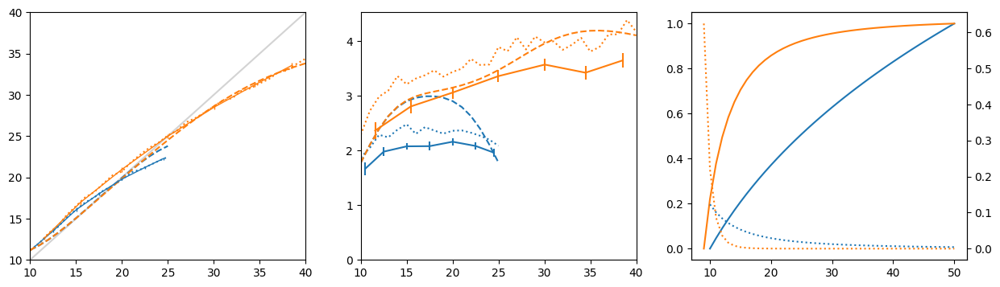

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    z_n, m_n, z_w, m_w, θcost, σ = res.x
    θcost /= 100
    zipfm = {NARROW:m_n, WIDE:m_w}[cond]
    sxs = ZIPF_XS[ZIPF_XS>=zipfm]
    zipfpow = {NARROW:z_n, WIDE:z_w}[cond]
    zpxs = zipfpow*(zipfm**zipfpow)/sxs**(zipfpow+1)
    zpxs /= zpxs.sum()
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(sxs, zpxs, μxs, ν=ν, σ=σ, correct_xs=xs, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(sxs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(sxs, zpxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

#### Wide LogN prior

In [529]:
LARGE_XS = np.arange(1,51)

In [ ]:
@cache
def mLL_allsubjects_widelognormal_prior_μ(cond, m, sd, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    sxs = LARGE_XS
    spxs = make_lognormal_prior(sxs, m, sd)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=spxs, θcost=θcost)
    return mLL_rectified(dat, sxs, spxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS)

In [ ]:
def objf_widelognormalprior_model(x):
    m_n, sd_n, m_w, sd_w, θcost, σ = x
    r  = mLL_allsubjects_widelognormal_prior_μ(NARROW, m_n, sd_n, θcost, σ)
    r += mLL_allsubjects_widelognormal_prior_μ(WIDE, m_w, sd_w, θcost, σ)
    #if np.isinf(r):
    #print(x, r)
    return r

In [ ]:
res = min_objf(objf_widelognormalprior_model,
               x0s=itertools.product([10,17.5], [4.3,15], [10,25], [8.6,30], [1e-4,1e-2], [2,]),
               #x0s=[[1.696e+01, 2.355*5.524e+00,  1.646e+01,  2.355*1.081e+01,  2.525e-01, 1e-5],],
               #x0s=[[10,5,10,10,.01,2],],
               bounds=[(1e-1,None),]*4 + [(1e-6,None),]*2 )
print(res)

(10, 4.3, 10, 8.6, 0.0001, 2) -> [1.03254671e+01 6.14245463e+00 1.01346471e+01 8.02212644e+00 4.16347880e-04 2.91695854e+00] 40365.81001850335
(10, 4.3, 10, 8.6, 0.01, 2) -> [1.03943420e+01 5.64626787e+00 1.00173915e+01 8.76386143e+00 1.21764928e-03 3.33183565e+00] 40851.045863282394
(10, 4.3, 10, 30, 0.0001, 2) -> [1.01055794e+01 4.93075606e+00 9.99890037e+00 2.99988723e+01 6.50412531e-06 3.68582146e+00] 42248.03793446144
(10, 4.3, 10, 30, 0.01, 2) -> [1.53913468e+01 2.21129573e+01 9.95700271e+00 2.98779788e+01 2.78904323e-02 1.82553099e+00] 41827.993664827634
(10, 4.3, 25, 8.6, 0.0001, 2) -> [1.01010089e+01 4.90345078e+00 2.49973530e+01 8.62191517e+00 1.00000000e-06 3.71385063e+00] 42546.17431018106
(10, 4.3, 25, 8.6, 0.01, 2) -> [1.02755963e+01 5.19428760e+00 2.49975659e+01 8.68751461e+00 1.00000000e-06 3.72233166e+00] 42577.33947822782
(10, 4.3, 25, 30, 0.0001, 2) -> [1.01008293e+01 4.90237807e+00 2.49990046e+01 3.00001886e+01 5.36837527e-06 3.69250505e+00] 42257.811342772235
(10, 

In [ ]:
res

  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40170.86443114694
        x: [ 1.496e+01  8.109e+00  1.333e+01  1.228e+01  5.900e-02
             2.150e+00]
      nit: 58
      jac: [ 5.093e-03  3.638e-03 -4.366e-03  7.276e-04 -5.675e-02
             7.276e-04]
     nfev: 595
     njev: 85
 hess_inv: <6x6 LbfgsInvHessProduct with dtype=float64>

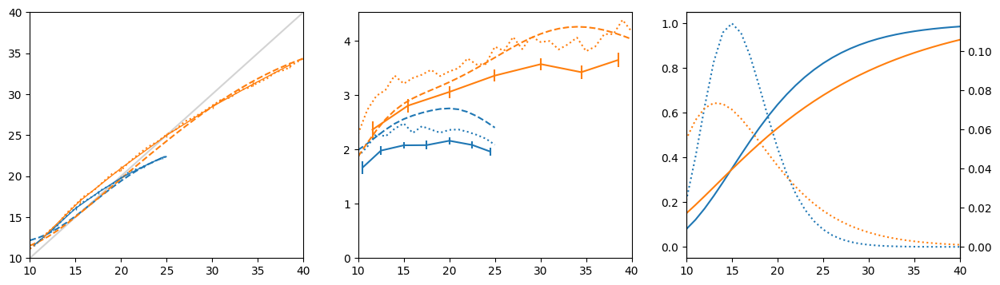

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, m_w, sd_w, θcost, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    sxs = LARGE_XS
    spxs = make_lognormal_prior(sxs, m=(m_n if cond==NARROW else m_w), sd=(sd_n if cond==NARROW else sd_w))
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=spxs, θcost=θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(sxs, spxs, μxs, ν=ν, σ=σ, correct_xs=xs, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(sxs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(sxs, spxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40);

#### Wide Gaussian prior

In [532]:
LARGE_XS

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50])

In [563]:
@cache
def mLL_allsubjects_widegaussian_prior_μ(cond, m, sd, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    sxs = LARGE_XS
    spxs = make_gaussian_prior(sxs, m, sd)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=spxs, θcost=θcost)
    return mLL_rectified(dat, sxs, spxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS)

In [564]:
@cache
def mLL_onesubject_widegaussian_prior_μ(sid, cond, m, sd, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)].loc[sid]
    sxs = LARGE_XS
    spxs = make_gaussian_prior(sxs, m, sd)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=spxs, θcost=θcost)
    return mLL_rectified(dat, sxs, spxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS)

In [565]:
def objf_widegaussianprior_model(x):
    m_n, sd_n, m_w, sd_w, θcost, σ = x
    #print(x)
    r  = mLL_allsubjects_widegaussian_prior_μ(NARROW, m_n, sd_n, θcost, σ)
    r += mLL_allsubjects_widegaussian_prior_μ(WIDE, m_w, sd_w, θcost, σ)
    #if np.isinf(r):
    #print(x, r)
    return r

In [566]:
res = min_objf(objf_widegaussianprior_model,
               x0s=itertools.product([10,15,17.5], [4.3,6,15], [10,15,25], [8.6,12,30], [.1,.2], [.1,2,]),
               #x0s=itertools.product([10,15,], [4.3,6,15], [10,15,25], [8.6,12,30], [.1,.2], [.1,2,]),
               #x0s=[[15,8,13,12,.06,2],],
               bounds=[(1.,None),]*4 + [(1e-9,None),(0,None)] )
print(res)

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Docu

(10, 4.3, 10, 8.6, 0.1, 0.1) -> [14.86072498  6.11878519  9.19974135 13.41631026  0.11060151  1.05458407] 40062.253402538234


KeyboardInterrupt: 

In [567]:
objf_widegaussianprior_model([1.696e+01,  5.524e+00,  1.646e+01,  1.081e+01,  2.525e-01,  0.000e+00])

39866.382055844246

In [ ]:
res

  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39864.778566065244
        x: [ 1.696e+01  5.524e+00  1.646e+01  1.081e+01  2.525e-01
             0.000e+00]
      nit: 83
      jac: [ 1.578e+02  8.098e+01  1.236e+02  1.066e+02  3.342e+07
             1.526e+07]
     nfev: 1183
     njev: 169
 hess_inv: <6x6 LbfgsInvHessProduct with dtype=float64>

0.13105684226336936
0.1092824985158396


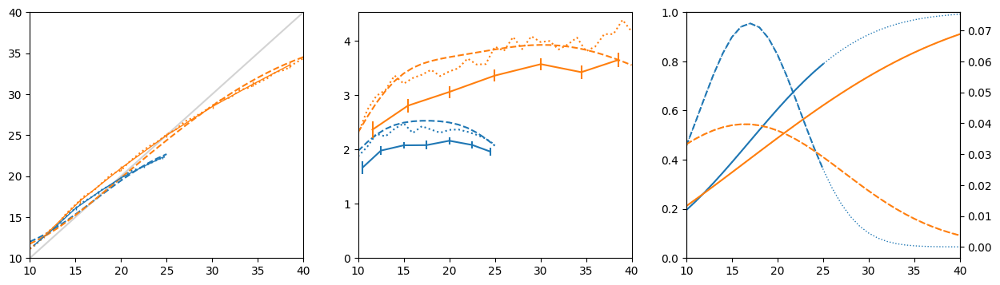

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, m_w, sd_w, θcost, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    sxs = LARGE_XS
    spxs = make_gaussian_prior(sxs, m=(m_n if cond==NARROW else m_w), sd=(sd_n if cond==NARROW else sd_w))
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=spxs, θcost=θcost)
    print(ν)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(sxs, spxs, μxs, ν=ν, σ=σ, correct_xs=xs, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    ind = np.isin(sxs, xs)
    axs[2].plot(sxs[ind], μxs[ind], c=COLORS_COND[cond],)
    axs2T.plot(sxs[ind], spxs[ind], c=COLORS_COND[cond], ls='--')
    axs[2].plot(sxs, μxs, c=COLORS_COND[cond], ls=':', lw=1)
    axs2T.plot(sxs, spxs, c=COLORS_COND[cond], ls=':', lw=1)
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); axs[2].set_ylim(0,1);

In [ ]:
def objf_widegaussianprior_model_nomotornoise(x):
    m_n, sd_n, m_w, sd_w, θcost = x
    r  = mLL_allsubjects_widegaussian_prior_μ(NARROW, m_n, sd_n, θcost, σ=0)
    r += mLL_allsubjects_widegaussian_prior_μ(WIDE, m_w, sd_w, θcost, σ=0)
    #if np.isinf(r):
    print(x, r)
    return r

In [ ]:
print(res.x)

[16.96222344  5.5241027  16.45685166 10.80738387  0.25251486  0.        ]


In [ ]:
res = min_objf(objf_widegaussianprior_model_nomotornoise,
               #x0s=itertools.product([10,17.5], [4.3,15], [10,25], [8.6,30], [1e-4,1e-2], [2,]),
               x0s=[[15,8,13,12,.2], [16.96, 5.52, 16.45, 10.80, 0.25]],
               bounds=[(1e-1,None),]*4 + [(1e-9,None),] )
print(res)

[15.   8.  13.  12.   0.2] 40211.27457291064
[15.00000001  8.         13.         12.          0.2       ] 40211.27457434226
[15.          8.00000001 13.         12.          0.2       ] 40211.27457363324
[15.          8.         13.00000001 12.          0.2       ] 40211.27457422835
[15.          8.         13.         12.00000001  0.2       ] 40211.27457463571
[15.          8.         13.         12.          0.20000001] 40211.274571950315
[14.84959982  7.92025762 12.86978776 11.87988173  1.16934891] 42177.43552598352
[14.84959983  7.92025762 12.86978776 11.87988173  1.16934891] 42177.43552756456
[14.84959982  7.92025763 12.86978776 11.87988173  1.16934891] 42177.435527959206
[14.84959982  7.92025762 12.86978777 11.87988173  1.16934891] 42177.43552765892
[14.84959982  7.92025762 12.86978776 11.87988174  1.16934891] 42177.435529317656
[14.84959982  7.92025762 12.86978776 11.87988173  1.16934892] 42177.435536628705
[14.9977168   7.99878944 12.99802327 11.9981765   0.21471555] 40234.589

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


[1.00000000e-01 1.00000000e-01 1.00000010e-01 1.00000000e-01 4.53316164e+02] inf
[1.00000000e-01 1.00000000e-01 1.00000000e-01 1.00000010e-01 4.53316164e+02] inf


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


[1.00000000e-01 1.00000000e-01 1.00000000e-01 1.00000000e-01 4.53316164e+02] inf
[16.9599181   5.51997367 16.44992058 10.79994802  0.25246932] 39865.73274000944
[16.95991811  5.51997367 16.44992058 10.79994802  0.25246932] 39865.73274160095
[16.9599181   5.51997368 16.44992058 10.79994802  0.25246932] 39865.73274083364
[16.9599181   5.51997367 16.44992059 10.79994802  0.25246932] 39865.73274125246
[16.9599181   5.51997367 16.44992058 10.79994803  0.25246932] 39865.73274108877
[16.9599181   5.51997367 16.44992058 10.79994802  0.25246933] 39865.7327354788
[16.96, 5.52, 16.45, 10.8, 0.25] -> [16.9599181   5.51997367 16.44992058 10.79994802  0.25246932] 39865.73274000944
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39865.73274000944
        x: [ 1.696e+01  5.520e+00  1.645e+01  1.080e+01  2.525e-01]
      nit: 2
      jac: [ 1.592e+02  8.242e+01  1.243e+02  1.079e+02 -4.531e+02]
     nfev: 186
     njev: 31
 hess_inv: <5x5 LbfgsInvHessP

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


In [ ]:
def objf_widegaussianprior_model_nomotornoise_samemean(x):
    m, sd_n, sd_w, θcost = x
    r  = mLL_allsubjects_widegaussian_prior_μ(NARROW, m, sd_n, θcost, σ=0)
    r += mLL_allsubjects_widegaussian_prior_μ(WIDE, m, sd_w, θcost, σ=0)
    #if np.isinf(r):
    #print(x, r)
    return r

In [ ]:
res = min_objf(objf_widegaussianprior_model_nomotornoise_samemean,
               #x0s=itertools.product([10,17.5], [4.3,15], [10,25], [8.6,30], [1e-4,1e-2], [2,]),
               x0s=[[14,6,12,.2], [16.71, 5.5241027, 10.80738387, 0.25251486], [16.96222344, 5.5241027, 10.80738387, 0.25251486], [16.45685166, 5.5241027, 10.80738387, 0.25251486], ],
               bounds=[(1e-1,None),]*3 + [(1e-9,None),] )
print(res)

[14, 6, 12, 0.2] -> [13.99998983  5.99999122 11.99999621  0.20007554] 40140.01786395824
[16.71, 5.5241027, 10.80738387, 0.25251486] -> [16.70833963  5.52342159 10.80677778  0.26089788] 39869.81227041622
[16.96222344, 5.5241027, 10.80738387, 0.25251486] -> [16.96166508  5.52391486 10.80708383  0.26757625] 39867.599030898346
[16.45685166, 5.5241027, 10.80738387, 0.25251486] -> [16.45685166  5.5241027  10.80738387  0.25251486] 39878.14037930216
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39867.599030898346
        x: [ 1.696e+01  5.524e+00  1.081e+01  2.676e-01]
      nit: 3
      jac: [ 2.656e+02  8.901e+01  7.791e+01 -3.482e+02]
     nfev: 190
     njev: 38
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


In [ ]:
res

  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39867.599030898346
        x: [ 1.696e+01  5.524e+00  1.081e+01  2.676e-01]
      nit: 3
      jac: [ 2.656e+02  8.901e+01  7.791e+01 -3.482e+02]
     nfev: 190
     njev: 38
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>

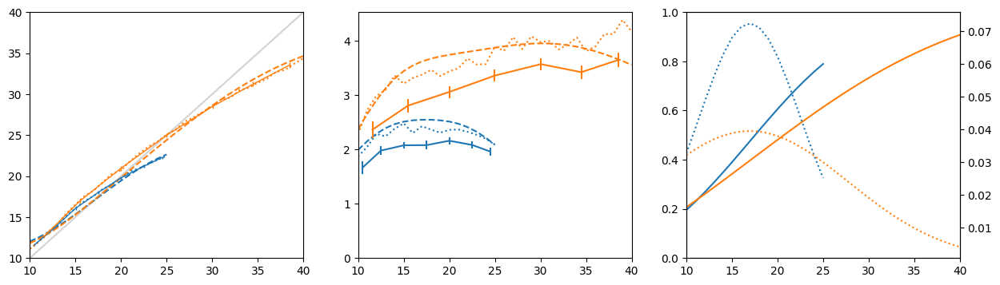

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m, sd_n, sd_w, θcost = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    sxs = LARGE_XS
    spxs = make_gaussian_prior(sxs, m=m, sd=(sd_n if cond==NARROW else sd_w))
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=spxs, θcost=θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(sxs, spxs, μxs, ν=ν, σ=0, correct_xs=xs, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    ind = np.isin(sxs, xs)
    axs[2].plot(sxs[ind], μxs[ind], c=COLORS_COND[cond],)
    axs2T.plot(sxs[ind], spxs[ind], c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); axs[2].set_ylim(0,1);

In [ ]:
def objf_widegaussianprior_model_nomotornoise_samemean_twicesd(x):
    m, sd, θcost = x
    r  = mLL_allsubjects_widegaussian_prior_μ(NARROW, m, sd, θcost, σ=0)
    r += mLL_allsubjects_widegaussian_prior_μ(WIDE, m, 2*sd, θcost, σ=0)
    #if np.isinf(r):
    #print(x, r)
    return r

In [ ]:
res = min_objf(objf_widegaussianprior_model_nomotornoise_samemean_twicesd,
               #x0s=itertools.product([10,17.5], [4.3,15], [10,25], [8.6,30], [1e-4,1e-2], [2,]),
               x0s=[[14,6,.2], [16.71, 5.45, 0.25251486], [16.96222344, 5.45, 0.25251486], [16.45685166, 5.45, 0.25251486],
                               [16.71, 5.52, 0.25251486], [16.96222344, 5.52, 0.25251486], [16.45685166, 5.52, 0.25251486], 
                               [16.71, 5.40, 0.25251486], [16.96222344, 5.40, 0.25251486], [16.45685166, 5.40, 0.25251486], ],
               bounds=[(1,100),]*2 + [(1e-9,None),] )
print(res)

[14, 6, 0.2] -> [13.9999873   5.99998526  0.20007869] 40140.008206370534
[16.71, 5.45, 0.25251486] -> [16.71        5.45        0.25251486] 39872.938619318775
[16.96222344, 5.45, 0.25251486] -> [16.95839232  5.44650456  0.2741185 ] 39871.78603307299
[16.45685166, 5.45, 0.25251486] -> [16.45637321  5.44961969  0.25740753] 39883.12220907553
[16.71, 5.52, 0.25251486] -> [16.705134   5.5156228  0.2708932] 39876.521274080835
[16.96222344, 5.52, 0.25251486] -> [16.96133493  5.51944464  0.27162178] 39876.041622249475
[16.45685166, 5.52, 0.25251486] -> [16.45684293  5.51999429  0.2526473 ] 39881.93102462393
[16.71, 5.4, 0.25251486] -> [16.70998786  5.39999279  0.25278249] 39874.23795870513
[16.96222344, 5.4, 0.25251486] -> [16.95971729  5.39772631  0.26890785] 39870.66659075883
[16.45685166, 5.4, 0.25251486] -> [16.45668059  5.39992885  0.25642178] 39886.79548223122
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39870.66659075883
        x: [

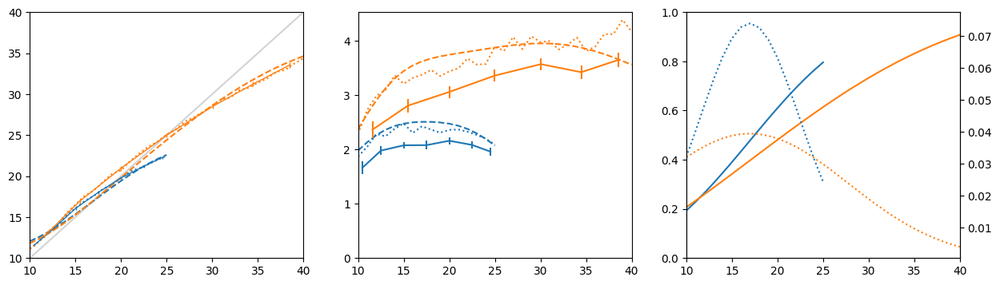

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m, sd, θcost = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    sxs = LARGE_XS
    spxs = make_gaussian_prior(sxs, m=m, sd=sd*(1 if cond==NARROW else 2))
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=spxs, θcost=θcost)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(sxs, spxs, μxs, ν=ν, σ=0, correct_xs=xs, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    ind = np.isin(sxs, xs)
    axs[2].plot(sxs[ind], μxs[ind], c=COLORS_COND[cond],)
    axs2T.plot(sxs[ind], spxs[ind], c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); axs[2].set_ylim(0,1);

##### Per subject

In [ ]:
#  1.696e+01  5.524e+00  1.081e+01  2.676e-01]

In [ ]:
def opt_on_x0s(objf, x0s, args=()):
    r_min = np.inf
    x_min = None
    for x0 in x0s:
        r = objf(x0, *args)
        if r < r_min:
            r_min = r
            x_min = x0
    return x_min, r_min

In [ ]:
####### Per subject
def objf_widegaussianprior_model_onesubj(x, sid):
    m_n, sd_n, m_w, sd_w, θcost, σ = x
    r  = mLL_onesubject_widegaussian_prior_μ(sid, NARROW, m_n, sd_n, θcost, σ)
    r += mLL_onesubject_widegaussian_prior_μ(sid, WIDE  , m_w, sd_w, θcost, σ)
    #print(x, r)
    return r
results_widegauss = []
for sid in subject_ids:
    #res = optimize.minimize(objf_widegaussianprior_model_onesubj, x0=[16, 5.5, 16, 11, .3, .1],
    best_r = np.inf
    best_x = None
    ### Method 1: grid search
    res_grid = optimize.brute( objf_widegaussianprior_model_onesubj,
               ranges=[slice(0,51,6),   # m_n
                       slice(2,16,3),   # sd_n
                       slice(0,51,6),  # m_w
                       slice(2,33,5),   # sd_w
                       slice(1e-9,.11,.05), # θcost
                       slice(1e-3,4.1,1.)], args=(sid,), full_output=True, finish=None)
    if res_grid[1] < best_r:
        best_r = res_grid[1]
        best_x = res_grid[0]
    print(sid, best_x, best_r )
    ### Method 2: list of points
    x0s=list( itertools.product([10,15,17.5], [4.3,6,15], [10,15,25], [8.6,12,30], [.1,.2], [.1,2,]) )
    res_2 = opt_on_x0s(objf_widegaussianprior_model_onesubj, x0s=x0s, args=(sid,) )
    if res_2[1] < best_r:
        best_r = res_2[1]
        best_x = res_2[0]
    print(sid, best_x, best_r )
    #res = min_objf(objf_widegaussianprior_model_onesubj,
    #                        x0s=list( itertools.product([10,15,17.5], [4.3,6,15], [10,15,25], [8.6,12,30], [.1,.2], [.1,2,]) )[:11],
    #                        args=(sid,),
    #                        bounds=[(0,50), (1,50), (-5,50), (1,50), (1e-9,None), (0.,None)],
    #                        v=0)
    finish = True
    if finish:
        res = min_objf(objf_widegaussianprior_model_onesubj, x0s=[ best_x, ], args=(sid,), bounds=[(0,50), (1,50), (-5,50), (1,50), (1e-9,None), (0.,None)], v=0)
        if not res.success:
            print('!', sid)
            print(res)
        results_widegauss.append([sid, *res.x, res.fun])
    else:
        results_widegauss.append([sid, *res_grid[0], res_grid[1]])
    print(results_widegauss[-1])
results_widegauss = pd.DataFrame(results_widegauss, columns=['subject', 'm_n', 'sd_n', 'm_w', 'sd_w', 'theta', 'sigma', 'mll'])
print('-LL =', results_widegauss['mll'].sum() )
results_widegauss

01 [18.     5.    24.     7.     0.1    2.001] 1105.2260676764786
01 [18.     5.    24.     7.     0.1    2.001] 1105.2260676764786
['01', 19.459139740528116, 5.54336125716112, 24.316118170167346, 7.008213291364179, 0.30970684823195543, 0.006294423985894715, 1085.0290384292816]
02 [24.     5.    30.     7.     0.1    2.001] 1166.3211021237612
02 [24.     5.    30.     7.     0.1    2.001] 1166.3211021237612
['02', 23.027709054486355, 6.239680513975156, 27.51535875082046, 8.01883527698136, 0.32464554662958706, 1.3199335841351643, 1152.6793669161075]
03 [12.     5.     0.    12.     0.05   3.001] 1196.021491734551
03 [12.     5.     0.    12.     0.05   3.001] 1196.021491734551
['03', 14.738880778007937, 6.497014721902238, 12.78497549755008, 10.90139866742447, 0.460605919712973, 1.4148957421472625, 1191.9791956787408]
04 [18.     5.    30.    12.     0.1    2.001] 1173.0727286290792
04 (17.5, 4.3, 25, 8.6, 0.2, 2) 1166.4712901815435
! 04
  message: ABNORMAL_TERMINATION_IN_LNSRCH
  succes

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


09 [12.     5.     0.    12.     0.05   1.001] 1095.3777522593493
09 [12.     5.     0.    12.     0.05   1.001] 1095.3777522593493
['09', 15.619163603837126, 2.4746533081729174, -5.0, 12.580289312354886, 0.02815063290804856, 1.5590829520212122, 1085.5796541749414]
10 [6.0000000e+00 8.0000000e+00 6.0000000e+00 1.2000000e+01 5.0000001e-02 1.0000000e-03] 1078.6654525269241
10 [6.0000000e+00 8.0000000e+00 6.0000000e+00 1.2000000e+01 5.0000001e-02 1.0000000e-03] 1078.6654525269241
['10', 6.007896209295759, 8.008026868401606, 6.0163042679028385, 12.017164092504931, 0.04590364489794247, 0.0, 1078.1527283789758]
12 [2.40000000e+01 8.00000000e+00 6.00000000e+00 1.70000000e+01 1.00000001e-01 1.00000000e-03] 1134.710568315857
12 [2.40000000e+01 8.00000000e+00 6.00000000e+00 1.70000000e+01 1.00000001e-01 1.00000000e-03] 1134.710568315857
['12', 24.000634080262262, 7.999307534455376, 6.000725151087091, 17.001491704196507, 0.1016216665696292, 8.631488160578794e-20, 1134.6237679982382]
13 [1.8000000

,subject,m_n,sd_n,m_w,sd_w,theta,sigma,mll
0,01,19.459140,5.543361,24.316118,7.008213,0.309707,6.294424e-03,1085.029038
1,02,23.027709,6.239681,27.515359,8.018835,0.324646,1.319934e+00,1152.679367
2,03,14.738881,6.497015,12.784975,10.901399,0.460606,1.414896e+00,1191.979196
3,04,19.654527,5.981494,26.780096,10.697906,0.435068,0.000000e+00,1158.440942
4,05,11.705014,6.697607,-0.180512,16.765710,0.136499,0.000000e+00,1073.405548
5,06,17.087469,7.610741,-0.039696,16.880989,0.044973,8.994668e-04,1069.413845
6,07,24.255250,7.872440,11.896138,11.799834,0.052544,0.000000e+00,1092.039829
7,08,17.876505,5.266741,-1.395100,13.515924,0.219809,6.671522e-01,1096.242845
8,09,15.619164,2.474653,-5.000000,12.580289,0.028151,1.559083e+00,1085.579654
9,10,6.007896,8.008027,6.016304,12.017164,0.045904,0.000000e+00,1078.152728


In [ ]:
results_widegauss.max()

subject             38
m_n           24.25525
sd_n          8.608151
m_w          47.999627
sd_w         17.001492
theta         1.031516
sigma         1.968069
mll        1239.114863
dtype: object

In [ ]:
results_widegauss.min()

subject            01
m_n          6.007896
sd_n         2.474653
m_w              -5.0
sd_w         7.008213
theta         0.00737
sigma             0.0
mll        952.265379
dtype: object

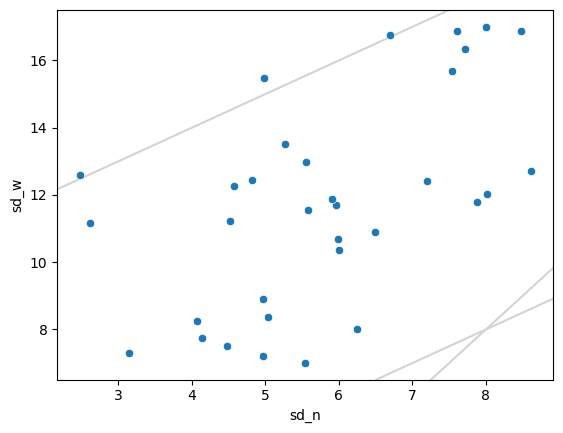

In [ ]:
sns.scatterplot(data=results_widegauss, x='sd_n', y='sd_w', )
plt.axline((8,8), slope=1, color='lightgrey', zorder=-1000)
plt.axline((8,8), slope=2, color='lightgrey', zorder=-1000)
plt.axline((5,15), slope=1, color='lightgrey', zorder=-1000)

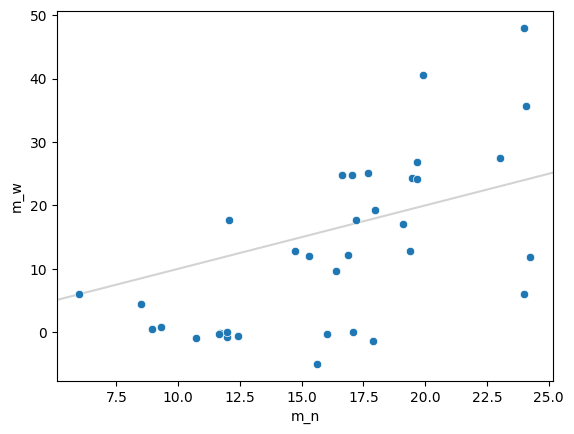

In [ ]:
sns.scatterplot(data=results_widegauss, x='m_n', y='m_w', )
plt.axline((8,8), slope=1, color='lightgrey', zorder=-1000)
#plt.axline((5,10), slope=1, color='lightgrey', zorder=-1000)

<Axes: xlabel='theta', ylabel='sigma'>

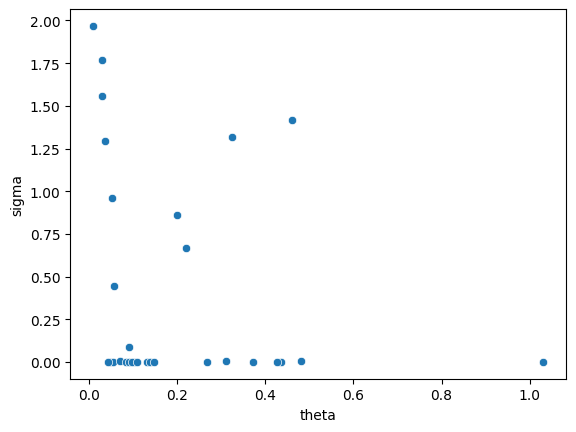

In [ ]:
sns.scatterplot(data=results_widegauss, x='theta', y='sigma', )

<Axes: xlabel='theta', ylabel='Count'>

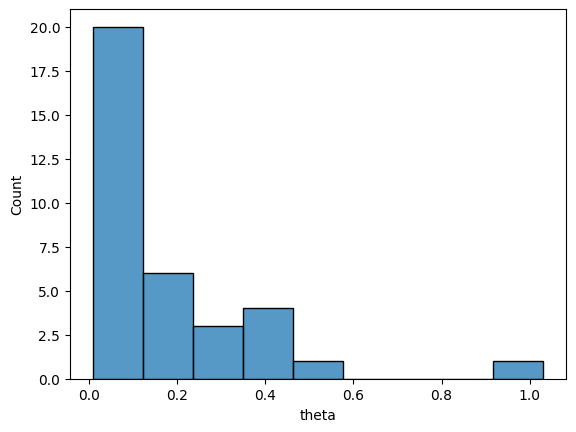

In [ ]:
sns.histplot( results_widegauss.theta )

In [ ]:
####### Per subject
def objf_widegaussianprior_model_nomotornoise_onesubj(x, sid):
    if np.any(np.isnan(x)):
        return np.nan
    m_n, sd_n, m_w, sd_w, θcost = x
    #print(x)
    r  = mLL_onesubject_widegaussian_prior_μ(sid, NARROW, m_n, sd_n, θcost, σ=0)
    r += mLL_onesubject_widegaussian_prior_μ(sid, WIDE  , m_w, sd_w, θcost, σ=0)
    #print(x, r)
    return r
results_widegauss_nomot = []
for sid in subject_ids:
    #res = optimize.minimize(objf_widegaussianprior_model_onesubj, x0=[16, 5.5, 16, 11, .3, .1],
    res = min_objf(objf_widegaussianprior_model_nomotornoise_onesubj,
                            x0s=[ [16, 5.5, 16, 11, .3, ], ],
                            #x0s=list( itertools.product([15,17.5], [4.3,6,15], [10,15,25], [8.6,12,30], [.2], ) )[:5],
                            args=(sid,),
                            bounds=[(0,50), (1,50), (-5,50), (1,50), (1e-9,None), ],
                            v=0)
    if not res.success:
        print('!', sid)
        print(res)
    results_widegauss_nomot.append([sid, *res.x, res.fun])
    print(results_widegauss_nomot[-1])
results_widegauss_nomot = pd.DataFrame(results_widegauss_nomot, columns=['subject', 'm_n', 'sd_n', 'm_w', 'sd_w', 'theta', 'mll'])
print('-LL =', results_widegauss_nomot['mll'].sum() )
results_widegauss_nomot

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['01', 15.99978641174259, 5.499939616406577, 15.999882716546196, 10.999887675171536, 0.3000605395910976, 1138.4169179921262]
['02', 15.999175267473975, 5.499539716178797, 15.999409878251656, 10.999555225187011, 0.3012084483250135, 1267.8580608519178]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['03', 16.034680657220484, 5.504727802774015, 16.01052332773252, 11.03450266913843, 1.2985156861838762, 1212.314640044059]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['04', 15.999088520656935, 5.499743386888718, 15.999227289990033, 10.999430248683739, 0.3008610281241923, 1211.0188047250767]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['05', 16.01847912178468, 5.4998080247516405, 16.010765373753195, 11.010533357731266, 0.2994403561224138, 1096.65533799396]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['06', 15.998330912032106, 5.499499132369616, 15.999208275174007, 10.99888696082137, 0.2999666088247524, 1117.6993316496553]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['07', 15.999793602018817, 5.499941950567792, 15.999931480049902, 10.99990751639919, 0.29999613003786574, 1131.326411881173]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['08', 15.880736374664757, 5.466435495688, 16.059806250518026, 11.10886276413414, 1.2844866120233225, 1135.3311959425457]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['09', 16.04768527068711, 5.576805419105423, 16.04904811013988, 11.07596096551497, 0.5867308040667358, 1145.6297046564632]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['10', 16.000111249711093, 5.500012150362799, 16.000028056572805, 11.000046376252522, 0.299995110005471, 1098.4579496946444]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['12', 15.998586579419257, 5.499602475461666, 15.999347248003794, 10.999116612137035, 0.2999734983641994, 1176.963371301149]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['13', 15.934701250797348, 5.511528471191073, 15.712994116029277, 10.598631992812054, 0.2834611007861994, 1070.2579575649343]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['14', 15.98544444319454, 5.424985132271848, 16.026811531215767, 10.98902022369823, 0.2949990088347932, 1080.8867177740947]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['15', 15.99797468438094, 5.499188038604717, 15.998437219694997, 10.998195641343814, 0.2999458692404949, 1053.1820247401022]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Docu

['16', 15.581156154033293, 5.026123909976706, 15.414354157877169, 10.49723118097916, 0.23477925004508773, 1117.8506189643936]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['17', 16.0886714021944, 5.572107740005362, 16.00556260299004, 11.024538319941257, 0.5939498558627339, 1134.1356994198886]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['18', 15.999167762268563, 5.4997659331380335, 15.999418035868217, 10.999479851417853, 0.300824258843708, 1219.8308572274277]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['19', 15.996894246612015, 5.499126506859629, 15.99876989767117, 10.998396189943492, 0.29994176712416937, 1078.8732437056995]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Docu

['20', 15.509333876045668, 5.462383164439381, 15.339381610837059, 10.433384744592912, 0.2809677976640206, 1133.5086952660756]
! 21
  message: ABNORMAL_TERMINATION_IN_LNSRCH
  success: False
   status: 2
      fun: 1026.7929285884757
        x: [ 1.600e+01  5.500e+00  1.600e+01  1.100e+01  3.000e-01]
      nit: 0
      jac: [-1.622e+01 -1.335e+01 -5.100e+00 -7.703e+00  7.592e+01]
     nfev: 126
     njev: 21
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>
['21', 16.0, 5.5, 16.0, 11.0, 0.3, 1026.7929285884757]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['22', 15.999848590182781, 5.4994355653361096, 15.999494692194107, 10.998998413649492, 0.29996237102253276, 1088.64457135905]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['24', 15.931771367068862, 5.480566783631404, 15.921793772131707, 10.957355010447543, 1.2936187055141801, 1326.7317833342013]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['25', 16.005229304706244, 5.499937418251942, 16.00017570364785, 10.999027656153803, 0.2998966309078179, 1088.7782740460075]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['26', 15.999006872911224, 5.499720683006282, 15.998696520695981, 10.999379295569515, 0.2999813788671475, 1206.0665146260149]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['27', 15.999946398041999, 5.499967043649674, 16.00002054794547, 11.000050982372573, 0.2999969023858735, 1082.6093669489385]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['28', 15.999019806639565, 5.499723115053977, 15.999673993941249, 10.99980751509729, 0.3008564832703632, 1114.402982588511]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['29', 16.00001816188758, 5.499365049022918, 15.99967764494287, 10.999470571833529, 0.29995766993500234, 1116.9117164212298]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['30', 15.998734433933837, 5.499644059543892, 15.998941443178893, 10.999209021208648, 0.2999762706363385, 1195.5995935390117]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['32', 15.964270366090007, 5.489880736932739, 15.992185177652415, 11.006395754597504, 0.6041952032302986, 1195.9412847315075]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['33', 16.003358996498932, 5.495521269332732, 16.003580307996344, 11.005205542259633, 0.30034155933585627, 1152.278858045041]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['34', 16.100646001988668, 5.5640216494456505, 16.065920720397312, 11.090061158931674, 0.45678281937378995, 1128.9631154638064]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['35', 15.997863220428075, 5.499399030745396, 15.998377874007849, 10.998664512767546, 0.2999599353831599, 1150.950668043352]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['36', 16.073292714121425, 5.569782599243013, 16.01451144179723, 11.032573236816416, 0.5015163008692426, 1115.2988886098365]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['37', 16.020405532798925, 5.550791661285506, 16.03430898155306, 11.060664008739543, 0.6374468574585748, 1139.196784277019]


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


['38', 15.998030249967616, 5.498794528637712, 15.997847125768589, 10.997565986116019, 0.299919635242782, 1133.8510767694672]
-LL = 39883.21594878686


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


,subject,m_n,sd_n,m_w,sd_w,theta,mll
0,01,15.999786,5.499940,15.999883,10.999888,0.300061,1138.416918
1,02,15.999175,5.499540,15.999410,10.999555,0.301208,1267.858061
2,03,16.034681,5.504728,16.010523,11.034503,1.298516,1212.314640
3,04,15.999089,5.499743,15.999227,10.999430,0.300861,1211.018805
4,05,16.018479,5.499808,16.010765,11.010533,0.299440,1096.655338
5,06,15.998331,5.499499,15.999208,10.998887,0.299967,1117.699332
6,07,15.999794,5.499942,15.999931,10.999908,0.299996,1131.326412
7,08,15.880736,5.466435,16.059806,11.108863,1.284487,1135.331196
8,09,16.047685,5.576805,16.049048,11.075961,0.586731,1145.629705
9,10,16.000111,5.500012,16.000028,11.000046,0.299995,1098.457950


## Correct prior, arbitrary encoding

### mu(x) Gaussian CDF

In [ ]:
def make_gaussiancdf_μxs(xs, m, sd):
    return num.std_normal_cdf( (xs-m)/sd )

In [ ]:
@cache
def mLL_allsubjects_gaussian_μxs(cond, m, sd, ν, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = make_gaussiancdf_μxs(xs, m, sd)
    return mLL_rectified(dat, xs, pxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS)

In [ ]:
def objf_gaussianμxs(x):
    m_n, sd_n, m_w, sd_w, ν, σ = x
    r  = mLL_allsubjects_gaussian_μxs(NARROW, m_n, sd_n, ν, σ)
    r += mLL_allsubjects_gaussian_μxs(WIDE,   m_w, sd_w, ν, σ)
    #print(x, r)
    return r

In [ ]:
res = min_objf(objf_gaussianμxs,
               #x0s=itertools.product([10,17.5], [4.3,15], [10,25], [8.6,30], [.1,.3], [2,]),
               x0s=itertools.product([10,], [4.3,15], [10,25], [8.6,30], [.1,.3], [2,]),
               bounds=[(0,None),]*6 )
print(res)

(10, 4.3, 10, 8.6, 0.1, 2) -> [11.56100616  7.0688565  10.82754156 11.91840868  0.05663255  2.13844608] 40841.9139717281
(10, 4.3, 10, 8.6, 0.3, 2) -> [10.26467688  4.40640303 10.343067    8.78195606  0.          3.7560947 ] 42381.315846617865
(10, 4.3, 10, 30, 0.1, 2) -> [ 5.3808284  11.54409942  0.72768289 21.98551452  0.04126837  2.05347436] 40341.150267476565
(10, 4.3, 10, 30, 0.3, 2) -> [10.22588382  4.39197223 10.05271805 29.99325313  0.          3.75609388] 42381.31584661815
(10, 4.3, 25, 8.6, 0.1, 2) -> [11.09092756  5.28795179 24.49178814  9.14653917  0.13580133  2.53961047] 41741.785592776105
(10, 4.3, 25, 8.6, 0.3, 2) -> [ 5.04088144 11.71002396  0.         23.06356702  0.04032351  2.04237345] 40336.8079955795
(10, 4.3, 25, 30, 0.1, 2) -> [ 5.04035557 11.7101198   0.         23.06296348  0.04032363  2.04224233] 40336.80798417612
(10, 4.3, 25, 30, 0.3, 2) -> [10.29585711  4.42637013 24.99549902 29.98881846  0.03618392  3.94431691] 42199.36191187527
(10, 15, 10, 8.6, 0.1, 2) -

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


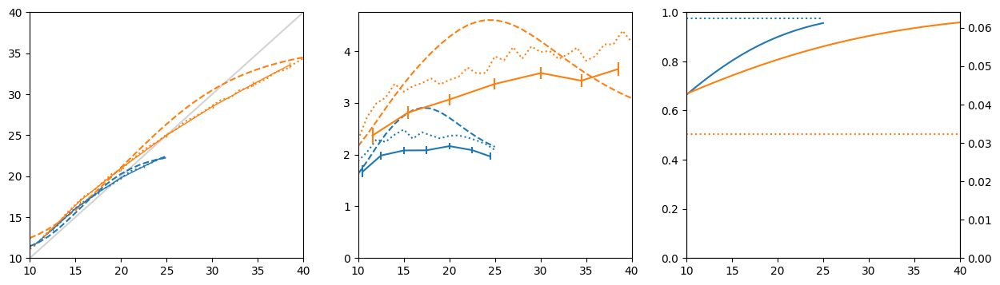

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, m_w, sd_w, ν, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = make_gaussiancdf_μxs(xs, m=(m_n if cond==NARROW else m_w), sd=(sd_n if cond==NARROW else sd_w))
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

### mu(x) = log(x)

A consequential difference with everything I've done so far is that mu(x) is not just on [0,1] now

In [ ]:
@cache
def mLL_allsubjects_log_μxs(cond, ν, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = np.log(xs)
    return mLL_rectified(dat, xs, pxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS, MU_ON_01=False)

In [ ]:
def objf_logμxs(x):
    ν, σ = x
    #print(x)
    r  = mLL_allsubjects_log_μxs(NARROW, ν, σ)
    r += mLL_allsubjects_log_μxs(WIDE,   ν, σ)
    #print(x, r)
    return r
res = min_objf(objf_logμxs,
               x0s=itertools.product([.1,.3], [1,2,5]),
               bounds=[(1e-6,None),]*2 )
print(res)

(0.1, 1) -> [0.16679159 1.87753857] 40339.4296171327
(0.1, 2) -> [0.16679154 1.8775366 ] 40339.429617136164
(0.1, 5) -> [0.08000419 4.00019994] 42023.73504324863
(0.3, 1) -> [0.16679178 1.87754281] 40339.42961715942
(0.3, 2) -> [0.29979778 2.20125006] 42150.279229853615
(0.3, 5) -> [0.2401079  4.00179514] 42948.89025203229
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40339.4296171327
        x: [ 1.668e-01  1.878e+00]
      nit: 15
      jac: [-7.276e-04  0.000e+00]
     nfev: 54
     njev: 18
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


In [ ]:
res

  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40339.4296171327
        x: [ 1.668e-01  1.878e+00]
      nit: 15
      jac: [-7.276e-04  0.000e+00]
     nfev: 54
     njev: 18
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>

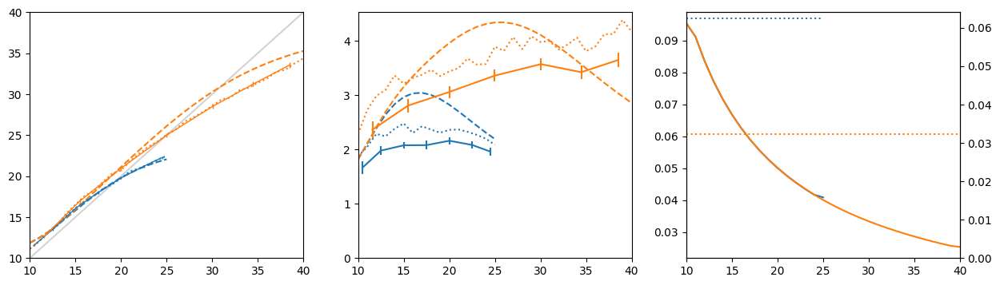

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
ν, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = np.log(xs)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000, MU_ON_01=False)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs[2].plot(xs, np.gradient(μxs), c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

#### Different cog noise

In [ ]:
def objf_logμxs_diffnoise(x):
    ν_n, ν_w, σ = x
    #print(x)
    r  = mLL_allsubjects_log_μxs(NARROW, ν_n, σ)
    r += mLL_allsubjects_log_μxs(WIDE,   ν_w, σ)
    #print(x, r)
    return r
res = min_objf(objf_logμxs_diffnoise,
               x0s=itertools.product([.05, .1,.3], [.05, .1,.3], [1,2,5]),
               bounds=[(1e-6,None),]*3 )
print(res)

(0.05, 0.05, 1) -> [0.12971322 0.18626856 1.93059977] 40191.48207194159
(0.05, 0.05, 2) -> [0.12971343 0.18627025 1.93060604] 40191.4820720728


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


(0.05, 0.05, 5) -> [1.00000000e-06 1.82582710e-01 3.55625138e+00] 41313.609314495996
(0.05, 0.1, 1) -> [0.12971254 0.18626919 1.93061421] 40191.48207193401
(0.05, 0.1, 2) -> [0.12971287 0.18626898 1.93060649] 40191.48207188946


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


(0.05, 0.1, 5) -> [0.0400027  0.08000519 4.0002499 ] 41951.833590631715
(0.05, 0.3, 1) -> [0.12971212 0.18626899 1.93060863] 40191.482071937295
(0.05, 0.3, 2) -> [0.12971487 0.18626822 1.93060718] 40191.4820723154


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


(0.05, 0.3, 5) -> [0.04001865 0.24011088 4.00184487] 42190.519479461946
(0.1, 0.05, 1) -> [0.12971293 0.186269   1.93060594] 40191.48207188947
(0.1, 0.05, 2) -> [0.12971325 0.18626848 1.93060082] 40191.48207194181


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


(0.1, 0.05, 5) -> [1.00000000e-06 1.56720703e-01 3.67734913e+00] 41403.68133738432
(0.1, 0.1, 1) -> [0.12971296 0.18626968 1.93059309] 40191.48207204604
(0.1, 0.1, 2) -> [0.12971503 0.18626814 1.93058211] 40191.48207247125
(0.1, 0.1, 5) -> [0.08000819 0.08000819 4.00039975] 42023.94494359168
(0.1, 0.3, 1) -> [0.12971247 0.18626932 1.93060869] 40191.48207191644
(0.1, 0.3, 2) -> [0.12971435 0.18626875 1.93060521] 40191.48207207531
(0.1, 0.3, 5) -> [0.08004008 0.24011983 4.001994  ] 42262.84658569112
(0.3, 0.05, 1) -> [0.12971291 0.18626896 1.93060605] 40191.48207188957
(0.3, 0.05, 2) -> [0.12971294 0.18626886 1.93060561] 40191.48207189175


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


(0.3, 0.05, 5) -> [1.00000000e-06 1.04439767e-01 4.19276806e+00] 42081.89890535714
(0.3, 0.1, 1) -> [0.1297126  0.18626889 1.9306059 ] 40191.48207190065
(0.3, 0.1, 2) -> [0.12971404 0.18626963 1.93060133] 40191.48207201449
(0.3, 0.1, 5) -> [0.24011983 0.08004008 4.001994  ] 42712.05859529033
(0.3, 0.3, 1) -> [0.12971314 0.1862692  1.93060485] 40191.482071896724
(0.3, 0.3, 2) -> [0.29979778 0.29979778 2.20125011] 42150.27923056376
(0.3, 0.3, 5) -> [0.24021503 0.24021503 4.00358065] 42952.426113383575
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40191.48207188946
        x: [ 1.297e-01  1.863e-01  1.931e+00]
      nit: 15
      jac: [-6.548e-03 -1.455e-03  0.000e+00]
     nfev: 84
     njev: 21
 hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


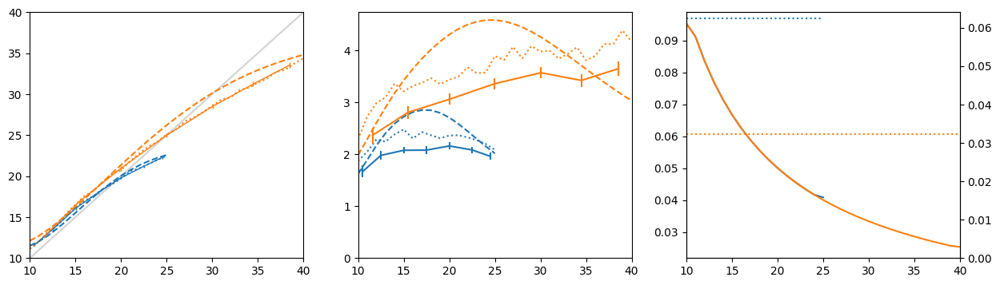

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
ν_n, ν_w, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = np.log(xs)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν={NARROW:ν_n, WIDE:ν_w}[cond], σ=σ, NUM_RS=100_000, MU_ON_01=False)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs[2].plot(xs, np.gradient(μxs), c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

### Normalized log(x)

In [ ]:
@cache
def mLL_allsubjects_normalized_logμxs(cond, ν, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = ( np.log(xs)-np.log(xs[0]) ) / (np.log(xs[-1])-np.log(xs[0]))
    return mLL_rectified(dat, xs, pxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS)

In [ ]:
def objf_normalizedlogμxs_diffnoise(x):
    ν_n, ν_w, σ = x
    #print(x)
    r  = mLL_allsubjects_normalized_logμxs(NARROW, ν_n, σ)
    r += mLL_allsubjects_normalized_logμxs(WIDE,   ν_w, σ)
    #print(x, r)
    return r
res = min_objf(objf_normalizedlogμxs_diffnoise,
               x0s=itertools.product([.05, .1,.3], [.05, .1,.3], [1,2,5]),
               bounds=[(1e-6,None),]*3 )
print(res)

(0.05, 0.05, 1) -> [0.14156345 0.13436492 1.93061059] 40191.48207194279
(0.05, 0.05, 2) -> [0.14156288 0.13436524 1.9305974 ] 40191.48207200974
(0.05, 0.05, 5) -> [1.00000000e-06 1.24423449e-01 2.66378601e+00] 40635.42267192404
(0.05, 0.1, 1) -> [0.14156293 0.13436464 1.93060622] 40191.4820718908
(0.05, 0.1, 2) -> [0.14156669 0.13436536 1.93056814] 40191.482073021485
(0.05, 0.1, 5) -> [0.0400027  0.08000519 4.0002499 ] 41835.955895027146
(0.05, 0.3, 1) -> [0.14156244 0.13436472 1.93060386] 40191.48207193488
(0.05, 0.3, 2) -> [0.14156578 0.13436502 1.93063621] 40191.482073824474
(0.05, 0.3, 5) -> [0.04001865 0.24011088 4.00184487] 42736.26126218915
(0.1, 0.05, 1) -> [0.14156256 0.13436457 1.93060455] 40191.48207192015
(0.1, 0.05, 2) -> [0.14156302 0.13436471 1.93060511] 40191.48207189096
(0.1, 0.05, 5) -> [1.00000000e-06 1.04876948e-01 3.88455419e+00] 41656.87277102489
(0.1, 0.1, 1) -> [0.14156318 0.13436473 1.9306036 ] 40191.48207189397
(0.1, 0.1, 2) -> [0.14156266 0.13436493 1.9306053

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


In [ ]:
res.x, res.fun

(array([0.14156304, 0.13436469, 1.93060608]), 40191.482071889535)

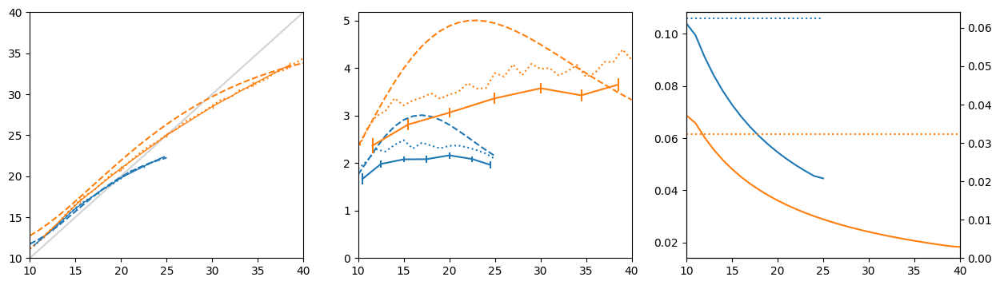

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
ν_n, ν_w, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = ( np.log(xs)-np.log(xs[0]) ) / (np.log(xs[-1])-np.log(xs[0]))
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs[2].plot(xs, np.gradient(μxs), c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

### Encoding consistent across conditions

In [457]:
def make_pareto_μxs(xs, α):
    if α == 0:
        return np.log(xs/xs[0]) / np.log(xs[-1]/xs[0])
    else:
        return (1/xs[0]**α - 1/xs**α) / (1/xs[0]**α - 1/xs[-1]**α)

def make_μ2xs(μ1xs, xs1, m1, w1, xs2, m2, w2):
    return np.interp(m1 + (w1/w2)*(xs2-m2), xs1, μ1xs)

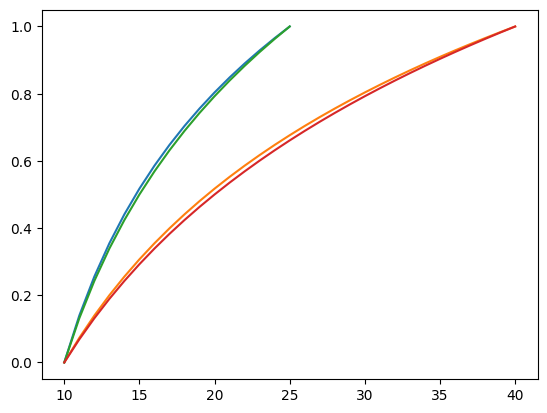

In [458]:
for α in [0.1, 0]:
    xs_w = XS_COND[WIDE]
    μxs_w = make_pareto_μxs(xs_w, α)
    xs_n = XS_COND[NARROW]
    μxs_n = make_μ2xs(μxs_w, xs_w, xs_w[0], xs_w[-1]-xs_w[0], xs_n, xs_n[0], xs_n[-1]-xs_n[0])
    plt.plot(xs_n, μxs_n)
    plt.plot(xs_w, μxs_w)

In [459]:
@cache
def mLL_allsubjects_pareto_encoding(α, ν_w, σ, NUM_RS=10_000):
    xs_w = XS_COND[WIDE]
    #μxs_w =   (1/xs_w[0]**α - 1/xs_w**α) / (1/xs_w[0]**α - 1/xs_w[-1]**α)
    μxs_w = ( (1/xs_w[0]**α - 1/xs_w**α) / (1/xs_w[0]**α - 1/xs_w[-1]**α) ) if α != 0 else ( np.log(xs_w/xs_w[0]) / np.log(xs_w[-1]/xs_w[0]) )
    xs_n = XS_COND[NARROW]
    μxs_n = make_μ2xs(μxs_w, xs_w, xs_w[0], xs_w[-1]-xs_w[0], xs_n, xs_n[0], xs_n[-1]-xs_n[0])
    assert μxs_w[0] == μxs_n[0] == 0
    assert μxs_w[-1] == μxs_n[-1] == 1
    # wide mLL
    dat = beh[ (beh.range==WIDE) & ~pd.isna(beh.response)]
    pxs = PRIORS_COND[WIDE]
    r = mLL_rectified(dat, xs_w, pxs, μxs=μxs_w, ν=ν_w, σ=σ, w=WIDTHS_COND[WIDE], lo=10, NUM_RS=NUM_RS)
    # narrow mLL
    dat = beh[ (beh.range==NARROW) & ~pd.isna(beh.response)]
    pxs = PRIORS_COND[NARROW]
    ν_n = np.sqrt(2)*ν_w
    r += mLL_rectified(dat, xs_n, pxs, μxs=μxs_n, ν=ν_n, σ=σ, w=WIDTHS_COND[NARROW], lo=10, NUM_RS=NUM_RS)
    return r

In [463]:
def objf_pareto(x):
    α, ν_w, σ = x
    #print(x)
    r = mLL_allsubjects_pareto_encoding(α, ν_w, σ, NUM_RS=10_000)
    #print(x, r)
    return r

In [467]:
#res = min_objf(objf_pareto,
#               x0s=itertools.product([1,2], [.1,.2], [2,]),
#               bounds=[(1e-6,None),]*3 )
#print(res)

res = min_objf_grid(objf_pareto,
               ranges=[slice(0,2.1,.2), slice(.05,.3,.04), slice(.5,3.1,.5)],
               bounds=[(0,None), (1e-6,None), (1e-6,None),] )
print(res)

[0.   0.13 2.  ] 40332.60298191635
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40276.69691124164
        x: [ 1.566e-01  1.180e-01  1.916e+00]
      nit: 11
      jac: [ 7.276e-04  7.276e-03  7.276e-04]
     nfev: 60
     njev: 15
 hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>


In [468]:
objf_pareto([0.15660382, 0.11804224, 1.91644212])

40276.6969113027

In [469]:
res.x, res.fun

(array([0.15660408, 0.11804206, 1.91645218]), 40276.69691124164)

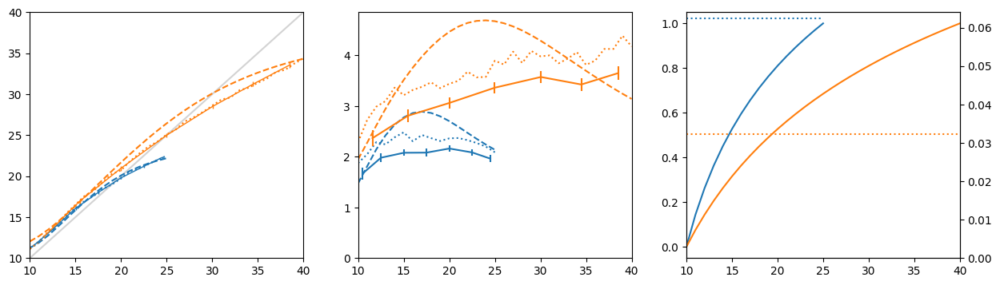

In [470]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
α, ν_w, σ = res.x
xs_w = XS_COND[WIDE]
μxs_w = make_pareto_μxs(xs_w, α)
xs_n = XS_COND[NARROW]
μxs_n = make_μ2xs(μxs_w, xs_w, xs_w[0], xs_w[-1]-xs_w[0], xs_n, xs_n[0], xs_n[-1]-xs_n[0])
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = {NARROW:μxs_n, WIDE:μxs_w}[cond]
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000, MU_ON_01=False)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
add_subjects_data(axs[0], axs[1])
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

In [471]:
def objf_paretolog(x): # α = 0
    ν_w, σ = x
    #print(x)
    r = mLL_allsubjects_pareto_encoding(0., ν_w, σ, NUM_RS=10_000)
    #print(x, r)
    return r

In [472]:
res = min_objf_grid(objf_paretolog,
               ranges=[slice(.05,.3,.01), slice(.5,3.1,.1)],
               bounds=[(1e-6,None), (1e-6,None),] )
print(res)

[0.12 1.9 ] 40289.824592474484
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40289.12595849181
        x: [ 1.214e-01  1.884e+00]
      nit: 6
      jac: [-3.121e-01 -4.002e-02]
     nfev: 36
     njev: 12
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>


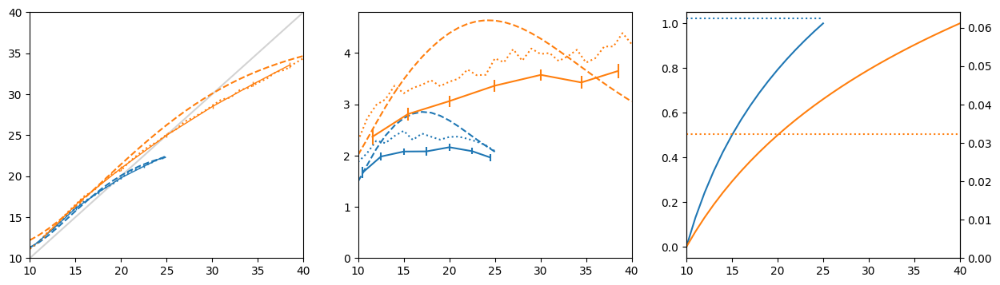

In [474]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
ν_w, σ = res.x
xs_w = XS_COND[WIDE]
μxs_w = make_pareto_μxs(xs_w, 0)
xs_n = XS_COND[NARROW]
μxs_n = make_μ2xs(μxs_w, xs_w, xs_w[0], xs_w[-1]-xs_w[0], xs_n, xs_n[0], xs_n[-1]-xs_n[0])
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    μxs = {NARROW:μxs_n, WIDE:μxs_w}[cond]
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000, MU_ON_01=False)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
add_subjects_data(axs[0], axs[1])
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

## Subjective prior, arbitrary encoding

### Log-normal prior (correct support)

In [ ]:
@cache
def mLL_allsubjects_log_μxs_logn_prior(cond, m, sd, ν, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    xs = XS_COND[cond]
    spxs = make_lognormal_prior(xs, m, sd)
    μxs = np.log(xs)
    return mLL_rectified(dat, xs, spxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS, MU_ON_01=False)

In [ ]:
def objf_logμxs_lognprior(x):
    m_n, sd_n, m_w, sd_w, ν, σ = x
    #print(x)
    r  = mLL_allsubjects_log_μxs_logn_prior(NARROW, m_n, sd_n, ν, σ)
    r += mLL_allsubjects_log_μxs_logn_prior(WIDE,   m_w, sd_w, ν, σ)
    #print(x, r)
    return r

In [ ]:
best_r = np.inf
best_x = None
### Method 1: grid search
res_grid = optimize.brute( objf_logμxs_lognprior,
            ranges=[slice(6,45,1),   # m_n
                    slice(2,28,1),   # sd_n
                    slice(6,45,1),  # m_w
                    slice(2,33,1),   # sd_w
                    slice(.1,.21,.05), # ν
                    slice(2,2.1,1.)], full_output=True, finish=None)
if res_grid[1] < best_r:
    best_r = res_grid[1]
    best_x = res_grid[0]
print(sid, best_x, best_r )
### Method 2: list of points
x0s=list( itertools.product([10, 12, 17.5], [10, 15, 20], [10, 12, 17.5, 25], [30,], [.15,], [2,]) )
res_2 = opt_on_x0s(objf_logμxs_lognprior, x0s=x0s, )
print(res_2)
if res_2[1] < best_r:
    best_r = res_2[1]
    best_x = res_2[0]
print(sid, best_x, best_r )
# Finish
res = min_objf(objf_logμxs_lognprior,
               x0s=[best_x,],
               bounds=[(1e-6,None),]*6 )
print(res)

04 [18.   20.   18.   17.    0.15  2.  ] 39955.996510856
((17.5, 20, 17.5, 30, 0.15, 2), 40118.06690742585)
04 [18.   20.   18.   17.    0.15  2.  ] 39955.996510856
[18.   20.   18.   17.    0.15  2.  ] -> [17.7211855  19.92874908 17.94719566 16.61541026  0.14794131  2.09128742] 39950.23793505215
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39950.23793505215
        x: [ 1.772e+01  1.993e+01  1.795e+01  1.662e+01  1.479e-01
             2.091e+00]
      nit: 17
      jac: [-2.154e-01  8.586e-01 -3.325e-01  3.929e-02  2.801e-01
            -4.657e-02]
     nfev: 161
     njev: 23
 hess_inv: <6x6 LbfgsInvHessProduct with dtype=float64>


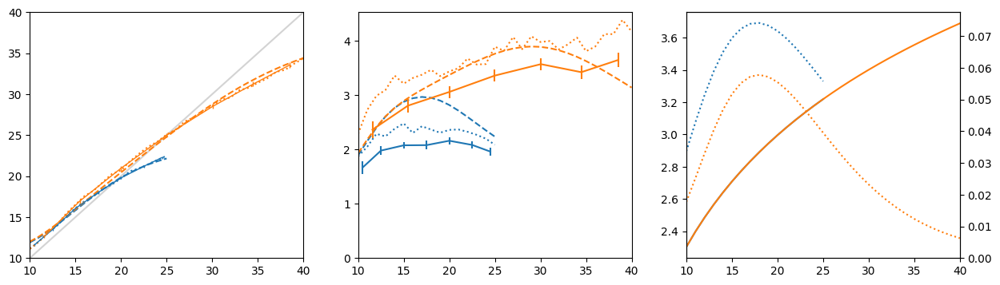

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, m_w, sd_w, ν, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = make_lognormal_prior(xs, m_n if cond==NARROW else m_w, sd_n if cond==NARROW else sd_w)
    μxs = np.log(xs)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000, MU_ON_01=False)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

#### Different cognitive noise levels

In [ ]:
def objf_logμxs_lognprior_diffnoise(x):
    m_n, sd_n, ν_n, m_w, sd_w, ν_w, σ = x
    #print(x)
    r  = mLL_allsubjects_log_μxs_logn_prior(NARROW, m_n, sd_n, ν_n, σ)
    r += mLL_allsubjects_log_μxs_logn_prior(WIDE,   m_w, sd_w, ν_w, σ)
    #print(x, r)
    return r

In [ ]:
best_r = np.inf
best_x = None
### Method 1: grid search
res_grid = optimize.brute( objf_logμxs_lognprior_diffnoise,
            ranges=[slice(6,45,1),   # m_n
                    slice(2,28,1),   # sd_n
                    slice(.05,.21,.02), # ν_n
                    slice(6,45,1),  # m_w
                    slice(2,33,1),   # sd_w
                    slice(.05,.21,.02), # ν_w
                    slice(2,2.1,1.)], full_output=True, finish=None)
if res_grid[1] < best_r:
    best_r = res_grid[1]
    best_x = res_grid[0]
print(sid, best_x, best_r )
### Method 2: list of points
x0s=list( itertools.product([10, 12, 17.5], [10, 15, 20], [.15,], [10, 12, 17.5, 25], [30,], [.15,], [2,]) )
res_2 = opt_on_x0s(objf_logμxs_lognprior_diffnoise, x0s=x0s, )
print(res_2)
if res_2[1] < best_r:
    best_r = res_2[1]
    best_x = res_2[0]
print(sid, best_x, best_r )
# Finish
res = min_objf(objf_logμxs_lognprior_diffnoise,
               x0s=[best_x,],
               bounds=[(1e-6,None),]*7 )
print(res)

KeyboardInterrupt: 

In [ ]:
res = min_objf(objf_logμxs_lognprior_diffnoise,
               x0s=[[17.90179926,  3.73717591,  0.04585681, 18.18429013, 17.48560026,  0.15865325,  2.41139339],],
               bounds=[(1e-6,None),]*7 )
print(res)

[17.90179926, 3.73717591, 0.04585681, 18.18429013, 17.48560026, 0.15865325, 2.41139339] -> [17.7254558   2.22209431  0.02778167 18.52041602 15.48840599  0.15204617  2.49446187] 39719.21838419486
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39719.21838419486
        x: [ 1.773e+01  2.222e+00  2.778e-02  1.852e+01  1.549e+01
             1.520e-01  2.494e+00]
      nit: 36
      jac: [-1.667e+01  1.318e+01  1.231e+02 -7.160e-01 -1.116e+01
             1.007e+03  4.106e+01]
     nfev: 352
     njev: 44
 hess_inv: <7x7 LbfgsInvHessProduct with dtype=float64>


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


In [ ]:
res.x, res.fun

(array([17.7254558 ,  2.22209431,  0.02778167, 18.52041602, 15.48840599,  0.15204617,  2.49446187]),
 39719.21838419486)

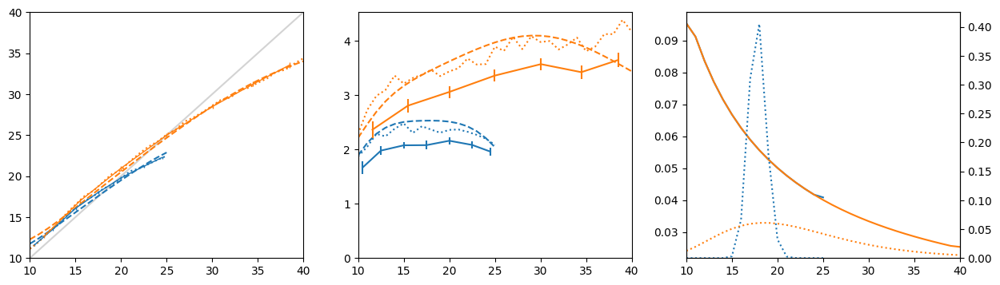

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, ν_n, m_w, sd_w, ν_w, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = make_lognormal_prior(xs, m_n if cond==NARROW else m_w, sd_n if cond==NARROW else sd_w)
    μxs = np.log(xs)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν_n if cond==NARROW else ν_w, σ=σ, NUM_RS=100_000, MU_ON_01=False)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs[2].plot(xs, np.gradient(μxs), c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

### Gaussian prior (correct support)

In [ ]:
@cache
def mLL_allsubjects_log_μxs_gaussian_prior(cond, m, sd, ν, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    xs = XS_COND[cond]
    spxs = make_gaussian_prior(xs, m, sd)
    μxs = np.log(xs)
    return mLL_rectified(dat, xs, spxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS, MU_ON_01=False)

In [ ]:
def objf_logμxs_gaussianprior(x):
    m_n, sd_n, m_w, sd_w, ν, σ = x
    #print(x)
    r  = mLL_allsubjects_log_μxs_gaussian_prior(NARROW, m_n, sd_n, ν, σ)
    r += mLL_allsubjects_log_μxs_gaussian_prior(WIDE,   m_w, sd_w, ν, σ)
    #print(x, r)
    return r

In [ ]:
best_r = np.inf
best_x = None
### Method 1: grid search
res_grid = optimize.brute( objf_logμxs_gaussianprior,
            ranges=[slice(6,45,1),   # m_n
                    slice(2,28,5),   # sd_n
                    slice(6,45,1),  # m_w
                    slice(2,33,5),   # sd_w
                    slice(.1,.21,.05), # ν
                    slice(2,2.1,1.)], full_output=True, finish=None)
if res_grid[1] < best_r:
    best_r = res_grid[1]
    best_x = res_grid[0]
print(sid, best_x, best_r )
### Method 2: list of points
x0s=list( itertools.product([10, 12, 17.5], [10, 15, 20], [10, 12, 17.5, 25], [30,], [.15,], [2,]) )
res_2 = opt_on_x0s(objf_logμxs_gaussianprior, x0s=x0s, )
print(res_2)
if res_2[1] < best_r:
    best_r = res_2[1]
    best_x = res_2[0]
print(sid, best_x, best_r )
# Finish
res = min_objf(objf_logμxs_gaussianprior,
               x0s=[best_x,],
               bounds=[(1e-6,None),]*6 )
print(res)

04 [19.    7.   15.   12.    0.15  2.  ] 39936.59507421751
((17.5, 10, 10, 30, 0.15, 2), 40213.86523649368)
04 [19.    7.   15.   12.    0.15  2.  ] 39936.59507421751
[19.    7.   15.   12.    0.15  2.  ] -> [18.53932343  5.59644203 20.29076282  8.85522814  0.1416375   2.17604892] 39914.207119196755
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39914.207119196755
        x: [ 1.854e+01  5.596e+00  2.029e+01  8.855e+00  1.416e-01
             2.176e+00]
      nit: 53
      jac: [ 0.000e+00 -2.910e-03 -1.455e-03 -2.910e-03  2.139e-01
             7.276e-03]
     nfev: 476
     njev: 68
 hess_inv: <6x6 LbfgsInvHessProduct with dtype=float64>


In [ ]:
res.x, res.fun

(array([18.53932343,  5.59644203, 20.29076282,  8.85522814,  0.1416375 ,  2.17604892]),
 39914.207119196755)

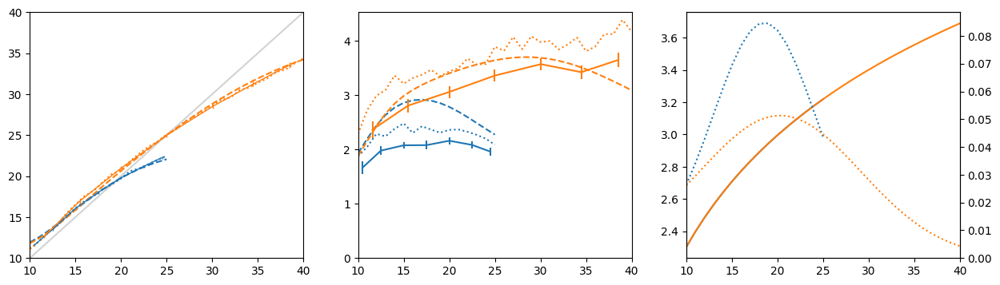

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, m_w, sd_w, ν, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = make_gaussian_prior(xs, m_n if cond==NARROW else m_w, sd_n if cond==NARROW else sd_w)
    μxs = np.log(xs)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000, MU_ON_01=False)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

#### Different cog noise

In [ ]:
def objf_logμxs_gaussianprior_diffnoise(x):
    m_n, sd_n, ν_n, m_w, sd_w, ν_w, σ = x
    #print(x)
    r  = mLL_allsubjects_log_μxs_gaussian_prior(NARROW, m_n, sd_n, ν_n, σ)
    r += mLL_allsubjects_log_μxs_gaussian_prior(WIDE,   m_w, sd_w, ν_w, σ)
    #print(x, r)
    return r

In [ ]:
best_r = np.inf
best_x = None
### Method 1: grid search
res_grid = optimize.brute( objf_logμxs_gaussianprior_diffnoise,
            ranges=[slice(6,45,1),   # m_n
                    slice(2,28,1),   # sd_n
                    slice(.05,.21,.01), # ν_n
                    slice(6,45,1),  # m_w
                    slice(2,33,1),   # sd_w
                    slice(.05,.21,.01), # ν_w
                    slice(2,2.1,1.)], full_output=True, finish=None)
if res_grid[1] < best_r:
    best_r = res_grid[1]
    best_x = res_grid[0]
print(best_x, best_r )
### Method 2: list of points
x0s=list( itertools.product([10, 12, 17.5], [10, 15, 20], [.15,], [10, 12, 17.5, 25], [30,], [.15,], [2,]) )
res_2 = opt_on_x0s(objf_logμxs_gaussianprior_diffnoise, x0s=x0s, )
print(res_2)
if res_2[1] < best_r:
    best_r = res_2[1]
    best_x = res_2[0]
print(best_x, best_r )
# Finish
res = min_objf(objf_logμxs_gaussianprior_diffnoise,
               x0s=[best_x,],
               bounds=[(1e-6,None),]*7 )
print(res)

KeyboardInterrupt: 

In [ ]:
res = min_objf(objf_logμxs_gaussianprior_diffnoise,
               x0s=[[18.70723078,  2.28039032,  0.06795704, 17.9060855 , 11.76551171,  0.16121153,  2.40051241],],
               bounds=[(1e-6,None),]*7 )
print(res)

[18.70723078, 2.28039032, 0.06795704, 17.9060855, 11.76551171, 0.16121153, 2.40051241] -> [1.91603834e+01 4.85315454e-01 1.64422504e-02 1.76533221e+01 1.09781573e+01 1.58386037e-01 2.44106787e+00] 39614.72419794169
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39614.72419794169
        x: [ 1.916e+01  4.853e-01  1.644e-02  1.765e+01  1.098e+01
             1.584e-01  2.441e+00]
      nit: 26
      jac: [-2.864e+00 -3.827e+00  9.983e-01 -3.172e-01  7.112e+00
             1.906e-01  2.634e-01]
     nfev: 272
     njev: 34
 hess_inv: <7x7 LbfgsInvHessProduct with dtype=float64>


In [ ]:
res.x, res.fun

(array([1.91603834e+01, 4.85315454e-01, 1.64422504e-02, 1.76533221e+01, 1.09781573e+01, 1.58386037e-01, 2.44106787e+00]),
 39614.72419794169)

0.016442250381615675 0.15838603697771694


Text(0.5, 0.98, 'Gaussian prior, log(x) μxs, different noise levels')

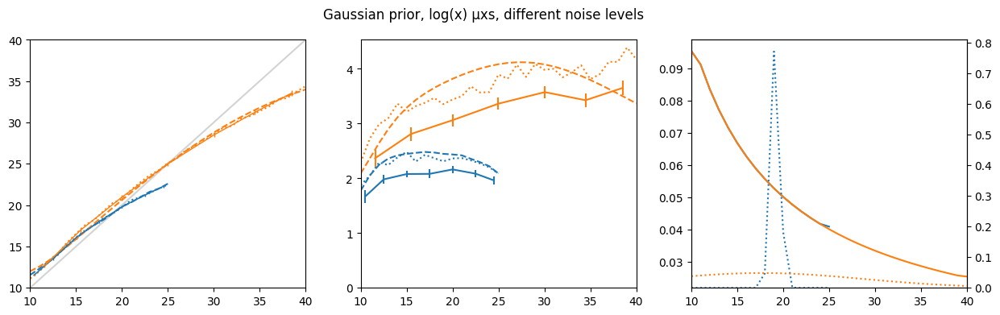

In [ ]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, ν_n, m_w, sd_w, ν_w, σ = res.x
print(ν_n, ν_w)
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = make_gaussian_prior(xs, m_n if cond==NARROW else m_w, sd_n if cond==NARROW else sd_w)
    μxs = np.log(xs)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν_n if cond==NARROW else ν_w, σ=σ, NUM_RS=100_000, MU_ON_01=False)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs[2].plot(xs, np.gradient(μxs), c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);
fig.suptitle('Gaussian prior, log(x) μxs, different noise levels')

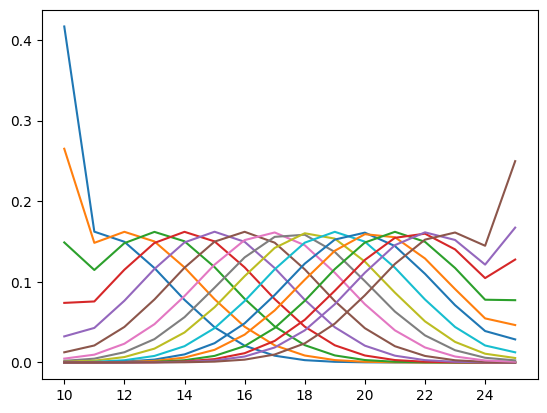

In [ ]:
xs = XS_COND[NARROW]
pxs = make_gaussian_prior(xs, m_n, sd_n)
μxs = np.log(xs)
pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν_n, σ=σ, NUM_RS=100_000, MU_ON_01=False)
plt.plot(xs, pxhatx.T);

##### Fixed, correct mean

In [ ]:
def objf_logμxs_gaussianprior_fixedmean_diffnoise(x):
    sd_n, ν_n, sd_w, ν_w, σ = x
    #print(x)
    r  = mLL_allsubjects_log_μxs_gaussian_prior(NARROW, 17.5, sd_n, ν_n, σ)
    r += mLL_allsubjects_log_μxs_gaussian_prior(WIDE,   25. , sd_w, ν_w, σ)
    #print(x, r)
    return r

In [481]:
best_r = np.inf
best_x = None
### Method 1: grid search
res_grid = optimize.brute( objf_logμxs_gaussianprior_fixedmean_diffnoise,
            ranges=[slice(2,28,1),   # sd_n
                    slice(.05,.21,.01), # ν_n
                    slice(2,33,1),   # sd_w
                    slice(.05,.21,.01), # ν_w
                    slice(2,2.1,1.)], full_output=True, finish=None)
if res_grid[1] < best_r:
    best_r = res_grid[1]
    best_x = res_grid[0]
print(best_x, best_r )
### Method 2: list of points
x0s=list( itertools.product([10, 15, 20], [.15,], [30,], [.15,], [2,]) )
res_2 = opt_on_x0s(objf_logμxs_gaussianprior_fixedmean_diffnoise, x0s=x0s, )
print(res_2)
if res_2[1] < best_r:
    best_r = res_2[1]
    best_x = res_2[0]
print(best_x, best_r )
# Finish
res = min_objf(objf_logμxs_gaussianprior_fixedmean_diffnoise,
               x0s=[best_x,],
               bounds=[(1e-6,None),]*5 )
print(res)

[ 4.    0.1  10.    0.17  2.  ] 39864.8614640251
((10, 0.15, 30, 0.15, 2), 40316.021778220194)
[ 4.    0.1  10.    0.17  2.  ] 39864.8614640251
[ 4.    0.1  10.    0.17  2.  ] -> [1.72185017 0.04752309 8.66782035 0.16776675 2.4404324 ] 39779.70924485218
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39779.70924485218
        x: [ 1.722e+00  4.752e-02  8.668e+00  1.678e-01  2.440e+00]
      nit: 18
      jac: [ 5.002e+01 -1.655e+03  1.491e+00  2.719e+03  5.099e+01]
     nfev: 138
     njev: 23
 hess_inv: <5x5 LbfgsInvHessProduct with dtype=float64>


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0


In [482]:
res.x, res.fun

(array([1.72185017, 0.04752309, 8.66782035, 0.16776675, 2.4404324 ]),
 39779.70924485218)

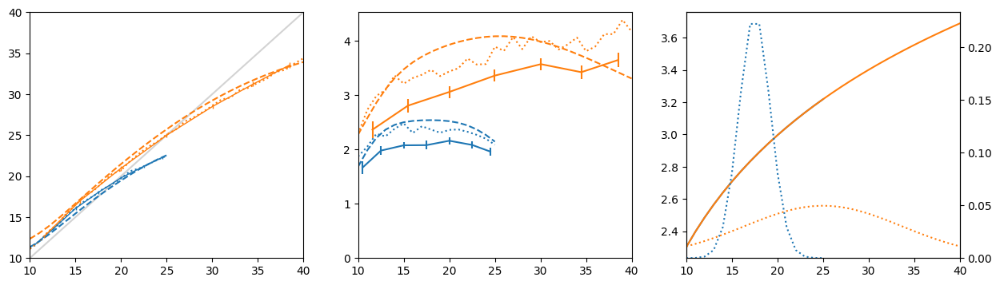

In [485]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
sd_n, ν_n, sd_w, ν_w, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = make_gaussian_prior(xs, 17.5 if cond==NARROW else 25, sd_n if cond==NARROW else sd_w)
    μxs = np.log(xs)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν_n if cond==NARROW else ν_w, σ=σ, NUM_RS=100_000, MU_ON_01=False)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond],  ms=2)
    k = 7
    avgzz = binAvgs[cond][k]
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
    axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

In [484]:
μxs

array([2.30258509, 2.39789527, 2.48490665, 2.56494936, 2.63905733, 2.7080502 , 2.77258872, 2.83321334, 2.89037176, 2.94443898, 2.99573227,
       3.04452244, 3.09104245, 3.13549422, 3.17805383, 3.21887582, 3.25809654, 3.29583687, 3.33220451, 3.36729583, 3.40119738, 3.4339872 ,
       3.4657359 , 3.49650756, 3.52636052, 3.55534806, 3.58351894, 3.61091791, 3.63758616, 3.66356165, 3.68887945])

#### Pareto encoding

In [475]:
@cache
def mLL_allsubjects_pareto_encoding_gaussian_prior(m_n, sd_n, m_w, sd_w, α, ν_w, σ, NUM_RS=10_000):
    xs_w = XS_COND[WIDE]
    μxs_w = make_pareto_μxs(xs_w, α)
    xs_n = XS_COND[NARROW]
    μxs_n = make_μ2xs(μxs_w, xs_w, xs_w[0], xs_w[-1]-xs_w[0], xs_n, xs_n[0], xs_n[-1]-xs_n[0])
    assert μxs_w[0] == μxs_n[0] == 0
    assert μxs_w[-1] == μxs_n[-1] == 1
    # wide mLL
    dat = beh[ (beh.range==WIDE) & ~pd.isna(beh.response)]
    pxs = make_gaussian_prior(xs_w, m_w, sd_w)
    r = mLL_rectified(dat, xs_w, pxs, μxs=μxs_w, ν=ν_w, σ=σ, w=WIDTHS_COND[WIDE], lo=10, NUM_RS=NUM_RS)
    # narrow mLL
    dat = beh[ (beh.range==NARROW) & ~pd.isna(beh.response)]
    pxs = make_gaussian_prior(xs_n, m_n, sd_n)
    ν_n = np.sqrt(2)*ν_w
    r += mLL_rectified(dat, xs_n, pxs, μxs=μxs_n, ν=ν_n, σ=σ, w=WIDTHS_COND[NARROW], lo=10, NUM_RS=NUM_RS)
    return r

In [476]:
def mLL_allsubjects_pareto_encoding_fixed_gaussian_prior(α, ν_w, σ, NUM_RS=10_000):
    return mLL_allsubjects_pareto_encoding_gaussian_prior(m_n=17.5, sd_n=15/np.sqrt(12), m_w=25, sd_w=30/np.sqrt(12), α=α, ν_w=ν_w, σ=σ, NUM_RS=NUM_RS)

In [477]:
def objf_pareto_fixed_gaussian_prior(x):
    α, ν_w, σ = x
    #print(x)
    r = mLL_allsubjects_pareto_encoding_fixed_gaussian_prior(α, ν_w, σ, NUM_RS=10_000)
    #print(x, r)
    return r

In [487]:
#res = min_objf(objf_pareto,
#               x0s=itertools.product([1,2], [.1,.2], [2,]),
#               bounds=[(1e-6,None),]*3 )
#print(res)

res = min_objf_grid(objf_pareto_fixed_gaussian_prior,
               ranges=[slice(0,2.1,.5), slice(.05,.3,.05), slice(.5,3.1,.5)],
               bounds=[(1e-6,None),]*3 )
print(res)

[0.  0.1 2.5] 40083.05907443379
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40021.67956695956
        x: [ 1.578e-01  9.773e-02  2.275e+00]
      nit: 12
      jac: [ 0.000e+00 -1.572e-01  3.638e-03]
     nfev: 60
     njev: 15
 hess_inv: <3x3 LbfgsInvHessProduct with dtype=float64>


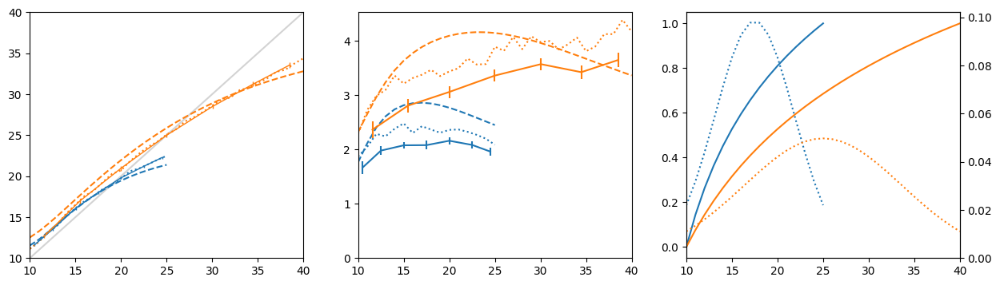

In [489]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
α, ν_w, σ = res.x
xs_w = XS_COND[WIDE]
μxs_w = make_pareto_μxs(xs_w, α)
xs_n = XS_COND[NARROW]
μxs_n = make_μ2xs(μxs_w, xs_w, xs_w[0], xs_w[-1]-xs_w[0], xs_n, xs_n[0], xs_n[-1]-xs_n[0])
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = make_gaussian_prior(xs, 17.5 if cond==NARROW else 25, 15/np.sqrt(12) if cond==NARROW else 30/np.sqrt(12))
    μxs = {NARROW:μxs_n, WIDE:μxs_w}[cond]
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
add_subjects_data(axs[0], axs[1])
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

In [490]:
def objf_pareto_ratiod_gaussian_prior(x):
    sd_ratio, α, ν_w, σ = x
    #print(x)
    r = mLL_allsubjects_pareto_encoding_gaussian_prior(m_n=17.5, sd_n=sd_ratio*15/np.sqrt(12), m_w=25, sd_w=sd_ratio*30/np.sqrt(12), α=α, ν_w=ν_w, σ=σ)
    #print(x, r)
    return r

In [498]:
res = min_objf_grid(objf_pareto_ratiod_gaussian_prior,
               ranges=[slice(0.5,1.6,.1), slice(0,2.1,.2), slice(.05,.3,.02), slice(.5,3.1,.5)],
               bounds=[(.1,None), (0,None), (1e-6,None), (1e-6,None),] )
print(res)

[0.9  0.2  0.09 2.5 ] 40042.58460061373
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40021.674437857255
        x: [ 1.003e+00  1.578e-01  9.786e-02  2.273e+00]
      nit: 14
      jac: [ 5.166e-02 -4.293e-02 -3.958e-01  5.602e-02]
     nfev: 100
     njev: 20
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>


In [499]:
# sd_ratio = 1 !
res.x, res.fun

(array([1.00327472, 0.15780713, 0.09786489, 2.27316515]), 40021.674437857255)

In [501]:
def objf_paretolog_fixed_gaussian_prior(x):
    ν_w, σ = x
    #print(x)
    r = mLL_allsubjects_pareto_encoding_fixed_gaussian_prior(0, ν_w, σ, NUM_RS=10_000)
    #print(x, r)
    return r

In [503]:
res = min_objf_grid(objf_paretolog_fixed_gaussian_prior,
               ranges=[slice(.05,.3,.01), slice(.5,3.1,.1)],
               bounds=[(1e-6,None), (1e-6,None),] )
print(res)

[0.1 2.3] 40036.036025618
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 40033.36552132762
        x: [ 1.014e-01  2.244e+00]
      nit: 5
      jac: [ 5.821e-03  7.276e-04]
     nfev: 33
     njev: 11
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>


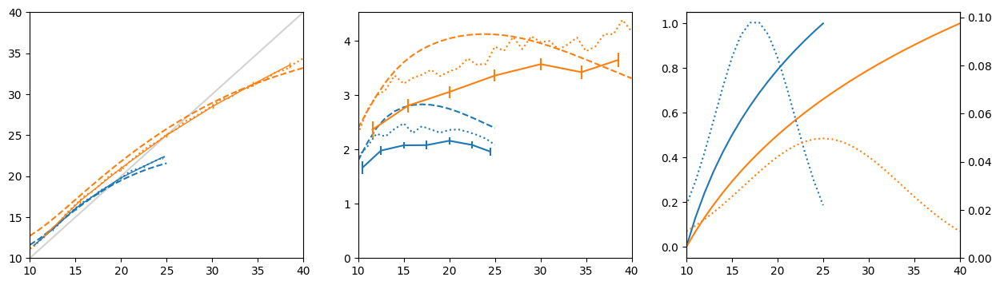

In [504]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
ν_w, σ = res.x
xs_w = XS_COND[WIDE]
μxs_w = make_pareto_μxs(xs_w, 0)
xs_n = XS_COND[NARROW]
μxs_n = make_μ2xs(μxs_w, xs_w, xs_w[0], xs_w[-1]-xs_w[0], xs_n, xs_n[0], xs_n[-1]-xs_n[0])
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = make_gaussian_prior(xs, 17.5 if cond==NARROW else 25, 15/np.sqrt(12) if cond==NARROW else 30/np.sqrt(12))
    μxs = {NARROW:μxs_n, WIDE:μxs_w}[cond]
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
add_subjects_data(axs[0], axs[1])
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

In [508]:
def objf_paretolog_gaussian_prior(x):
    m_n, sd_n, m_w, sd_w, ν_w, σ = x
    #print(x)
    r = mLL_allsubjects_pareto_encoding_gaussian_prior(m_n=m_n, sd_n=sd_n, m_w=m_w, sd_w=sd_w, α=0, ν_w=ν_w, σ=σ)
    #print(x, r)
    return r

In [524]:
res = min_objf_grid(objf_paretolog_gaussian_prior,
               ranges=[slice(10,26,5), slice(5,26,5), slice(20,26,5), slice(15,31,5), slice(.05,.3,.08), slice(.5,3.1,.8)],
               bounds=[(1,None), (1,None), (1,None), (1,None), (1e-6,None), (1e-6,None),] )
print(res)

[20.   15.   20.   15.    0.13  2.1 ] 40103.714226518125
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39911.53190963059
        x: [ 1.980e+01  1.492e+01  1.626e+01  1.164e+01  1.119e-01
             2.018e+00]
      nit: 15
      jac: [ 1.120e+00  1.352e+00 -1.515e+00  1.586e+00  3.747e-01
             1.091e-01]
     nfev: 119
     njev: 17
 hess_inv: <6x6 LbfgsInvHessProduct with dtype=float64>


In [525]:
res.x, res.fun

(array([19.80149598, 14.91931801, 16.26182055, 11.63861548,  0.11186383,  2.01753227]),
 39911.53190963059)

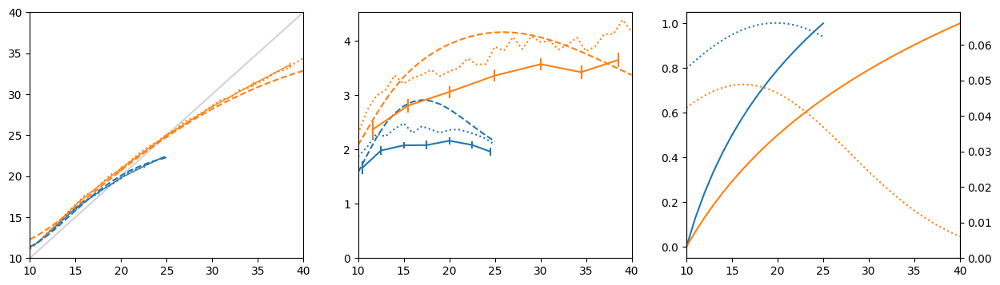

In [526]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, m_w, sd_w, ν_w, σ = res.x
xs_w = XS_COND[WIDE]
μxs_w = make_pareto_μxs(xs_w, 0)
xs_n = XS_COND[NARROW]
μxs_n = make_μ2xs(μxs_w, xs_w, xs_w[0], xs_w[-1]-xs_w[0], xs_n, xs_n[0], xs_n[-1]-xs_n[0])
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = make_gaussian_prior(xs, m_n if cond==NARROW else m_w, sd_n if cond==NARROW else sd_w)
    μxs = {NARROW:μxs_n, WIDE:μxs_w}[cond]
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=100_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    axs[2].plot(xs, μxs, c=COLORS_COND[cond],)
    axs2T.plot(xs, pxs, c=COLORS_COND[cond], ls=':')
add_subjects_data(axs[0], axs[1])
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);
axs2T.set_ylim(0,None);

## Wider Gaussian prior

In [537]:
@cache
def mLL_allsubjects_log_μxs_wide_gaussian_prior(cond, m, sd, ν, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    sxs = LARGE_XS
    spxs = make_gaussian_prior(sxs, m, sd)
    μxs = np.log(sxs)
    return mLL_rectified(dat, sxs, spxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS, MU_ON_01=False)

In [542]:
def objf_logμxs_widegaussianprior_model(x):
    m_n, sd_n, m_w, sd_w, ν, σ = x
    #print(x)
    r  = mLL_allsubjects_log_μxs_wide_gaussian_prior(NARROW, m_n, sd_n, ν, σ)
    r += mLL_allsubjects_log_μxs_wide_gaussian_prior(WIDE,   m_w, sd_w, ν, σ)
    #if np.isinf(r):
    #print(x, r)
    return r

In [579]:
res = min_objf_grid(objf_logμxs_widegaussianprior_model,
               ranges=[slice(1,26,2), slice(5,26,2), slice(5,35,4), slice(5,81,4), slice(.05,.3,.02), slice(.5,3.1,.8)],
               bounds=[(1,None), (1,None), (1,None), (1,None), (1e-6,None), (1e-6,None),] )
print(res)

[15.    7.   13.   13.    0.19  0.5 ] 39646.236269006484
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39580.20261475859
        x: [ 1.637e+01  6.285e+00  1.502e+01  1.240e+01  1.973e-01
             1.000e-06]
      nit: 46
      jac: [ 0.000e+00  0.000e+00  0.000e+00  0.000e+00  6.049e+02
             0.000e+00]
     nfev: 756
     njev: 108
 hess_inv: <6x6 LbfgsInvHessProduct with dtype=float64>


/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Docu

In [580]:
res.x, res.fun

(array([1.63693996e+01, 6.28533283e+00, 1.50158551e+01, 1.23955189e+01, 1.97269731e-01, 1.00000000e-06]),
 39580.20261475859)

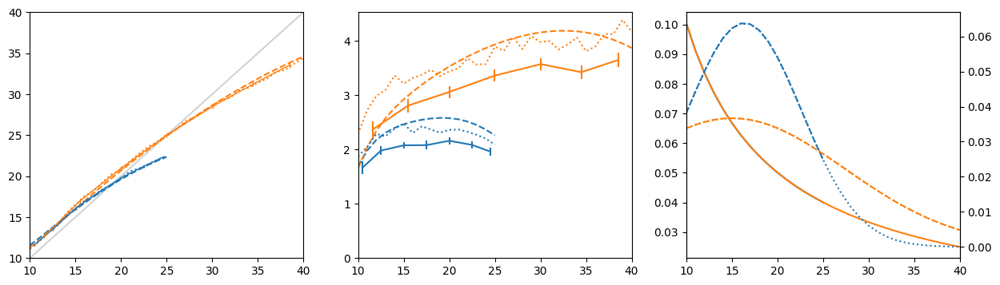

In [581]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, m_w, sd_w, ν, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    sxs = LARGE_XS
    spxs = make_gaussian_prior(sxs, m=(m_n if cond==NARROW else m_w), sd=(sd_n if cond==NARROW else sd_w))
    μxs = np.log(sxs)
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(sxs, spxs, μxs, ν=ν, σ=σ, correct_xs=xs, NUM_RS=100_000, MU_ON_01=False)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    ind = np.isin(sxs, xs)
    #axs[2].plot(sxs[ind], μxs[ind], c=COLORS_COND[cond],)
    axs[2].plot(sxs[ind], np.gradient(μxs)[ind], c=COLORS_COND[cond],)
    axs2T.plot(sxs, spxs, c=COLORS_COND[cond], ls=':')
    axs2T.plot(sxs[ind], spxs[ind], c=COLORS_COND[cond], ls='--')
add_subjects_data(axs[0], axs[1])
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);

#### Different noises

In [573]:
def objf_logμxs_widegaussianprior_diffnoise(x):
    m_n, sd_n, ν_n, m_w, sd_w, ν_w, σ = x
    #print(x)
    r  = mLL_allsubjects_log_μxs_wide_gaussian_prior(NARROW, m_n, sd_n, ν_n, σ)
    r += mLL_allsubjects_log_μxs_wide_gaussian_prior(WIDE,   m_w, sd_w, ν_w, σ)
    #if np.isinf(r):
    print(x, r)
    return r

In [583]:
bounds = [(1,None), (1,None), (1e-6,None), (1,None), (1,None), (1e-6,None), (1e-6,None),]
res = min_objf(objf_logμxs_widegaussianprior_diffnoise,
               x0s=[[16.3693996, 6.28533283, .2, 15.0158551, 12.3955189, .197269731, 1e-06],],
               bounds=bounds )
print(res)
res = min_objf_grid(objf_logμxs_widegaussianprior_diffnoise,
               ranges=[slice(1,26,8), slice(5,26,8), slice(.01,.3,.16), slice(5,35,8), slice(5,81,8), slice(.05,.3,.16), slice(.5,3.1,1.6)],
               bounds=bounds,
               compare_with_res=res)
print(res)

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/apc/Docu

[16.3693996, 6.28533283, 0.2, 15.0158551, 12.3955189, 0.197269731, 1e-06] -> [1.63693996e+01 6.28533283e+00 2.00000000e-01 1.50158551e+01 1.23955189e+01 1.97269731e-01 1.00000000e-06] 39588.056658829606
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39588.056658829606
        x: [ 1.637e+01  6.285e+00  2.000e-01  1.502e+01  1.240e+01
             1.973e-01  1.000e-06]
      nit: 1
      jac: [ 0.000e+00  0.000e+00  3.463e+03  0.000e+00  0.000e+00
            -2.463e+03  0.000e+00]
     nfev: 24
     njev: 3
 hess_inv: <7x7 LbfgsInvHessProduct with dtype=float64>
[17.    5.    0.17 13.   13.    0.21  0.5 ] 39675.73529737051
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 39494.18717664559
        x: [ 1.897e+01  1.275e+00  4.099e-02  2.116e+01  8.230e+00
             1.628e-01  2.346e+00]
      nit: 94
      jac: [-3.056e-02 -5.093e-02  1.468e+00  7.276e-03  2.110e-02
             1.06

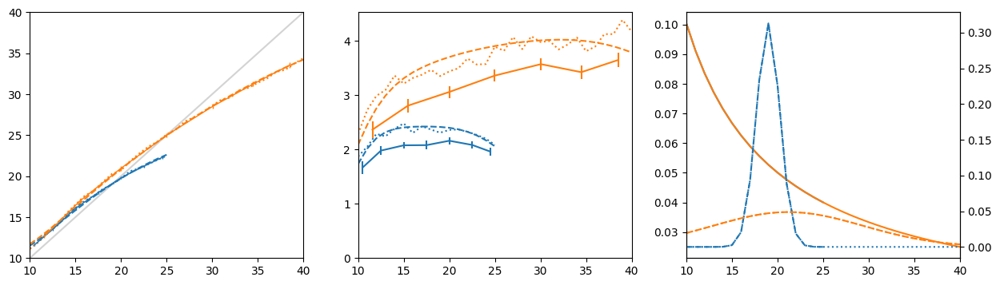

In [577]:
fig, axs = plt.subplots(ncols=3, figsize=(15,4))
axs2T = axs[2].twinx()
m_n, sd_n, ν_n, m_w, sd_w, ν_w, σ = res.x
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    sxs = LARGE_XS
    spxs = make_gaussian_prior(sxs, m=(m_n if cond==NARROW else m_w), sd=(sd_n if cond==NARROW else sd_w))
    μxs = np.log(sxs)
    ν = ν_n if cond==NARROW else ν_w
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(sxs, spxs, μxs, ν=ν, σ=σ, correct_xs=xs, NUM_RS=100_000, MU_ON_01=False)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    ind = np.isin(sxs, xs)
    #axs[2].plot(sxs[ind], μxs[ind], c=COLORS_COND[cond],)
    axs[2].plot(sxs[ind], np.gradient(μxs)[ind], c=COLORS_COND[cond],)
    axs2T.plot(sxs, spxs, c=COLORS_COND[cond], ls=':')
    axs2T.plot(sxs[ind], spxs[ind], c=COLORS_COND[cond], ls='--')
add_subjects_data(axs[0], axs[1])
axs[2].set_xlim(10,40); #axs[2].set_ylim(0,1);

## Constant-variance truncated motor noise 

In [ ]:
def var_truncated_normal(mu, sigma, a, b):
    sigma = np.asarray(sigma, dtype=float)
    out = np.zeros_like(sigma, dtype=float)
    mask = sigma > 0
    if np.any(mask):
        alpha = (a-mu)/sigma[mask]
        beta = (b-mu)/sigma[mask]
        Z = num.std_normal_cdf_difference(alpha, beta)
        #print(np.count_nonzero(Z==0), mu, sigma[mask][Z==0], alpha[Z==0], beta[Z==0])
        out[mask] = 1 - (beta*num.std_normal_pdf(beta)-alpha*num.std_normal_pdf(alpha))/Z - (num.std_normal_pdf_difference(alpha, beta)/Z)**2
        out[mask] *= sigma[mask]**2
    return out

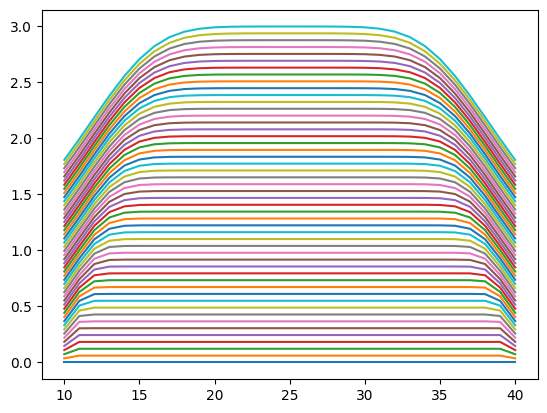

In [ ]:
xs = XS_COND[WIDE]
for sigma in np.linspace(0, 3):
    plt.plot(xs, [var_truncated_normal(x, sigma, xs[0], xs[-1])**(1/2) for x in xs])

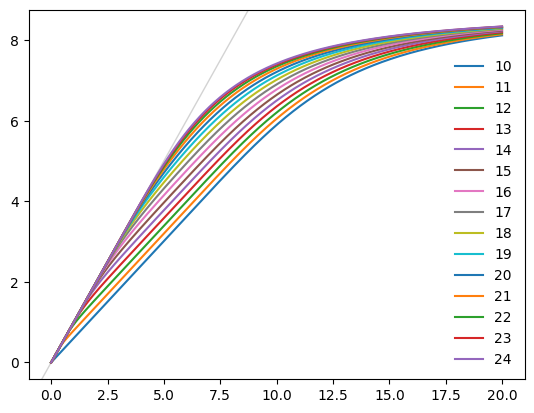

In [ ]:
xs = XS_COND[WIDE]
sigmas = np.linspace(0, 20, 1000)
for x in xs[:15]:
    plt.plot(sigmas, var_truncated_normal(x, sigmas, xs[0], xs[-1])**(1/2), label=x)
plt.legend()
plt.axline((1,1), slope=1, zorder=-1000, c='lightgrey', lw=1)

In [ ]:
from scipy import interpolate

In [ ]:
# function which, given sd, returns the parameter sigma of a truncated normal whose standard deviation is sd
def sigma_from_sd(sd, mu, a, b):
    # sd <= sigma
    sigmas = np.linspace(sd, 20, 1000)
    sds = var_truncated_normal(mu=mu, sigma=sigmas, a=a, b=b)**(1/2)
    return np.interp(sd, sds, sigmas)

In [ ]:
var_truncated_normal(mu=12, sigma=2, a=10, b=40)**(1/2), var_truncated_normal(mu=19, sigma=2, a=10, b=40)**(1/2)

(1.5870554946524151, 1.9999280713717207)

In [ ]:
sigma_from_sd(1.5870554946524151, 12, 10, 40), sigma_from_sd(1.9999280713717207, 19, 10, 40)

(2.000001457760181, 2.000000004229516)

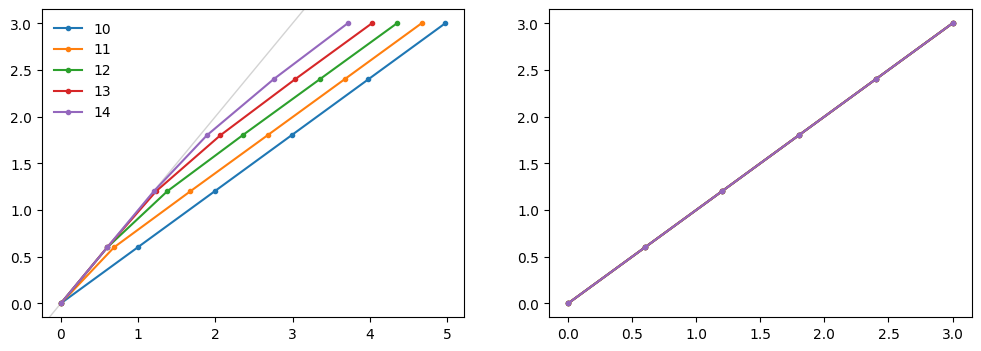

In [ ]:
xs = XS_COND[WIDE]
a = xs[0]; b = xs[-1]
sds = np.linspace(0, 3, 6)
fig, axs = plt.subplots(ncols=2, figsize=(12,4))
for x in xs[:5]:
    sigmas = np.array([ sigma_from_sd(sd, mu=x, a=a, b=b) for sd in sds ])
    axs[0].plot(sigmas, var_truncated_normal(x, sigmas, a, b)**(1/2), '.-', label=x)
    axs[1].plot(sds,    var_truncated_normal(x, sigmas, a, b)**(1/2), '.-', label=x)
axs[0].legend()
axs[0].axline((1,1), slope=1, zorder=-1000, c='lightgrey', lw=1)


In [ ]:
import warnings

In [ ]:
def probs_xhats_given_xB_cstvar(xB, lo, w, sd):
    '''Given a Bayesian estimate xB, and some constant-variance truncated-Gaussian noise with stndard deviation sd,
    this returns the probability of each possible discrete (integer) response xhat between lo and lo+w.'''
    hi = lo + w
    if sd == 0:
        ps = np.zeros(int(w)+1)
        ps[int(np.round(xB)-lo)] = 1.
        return ps
    xhats = num.discrete_xs(lo, w)
    sigma = sigma_from_sd(sd=sd, mu=xB, a=lo, b=hi)
    ps = num.trunc_normal_Pab(a=xhats-.5, b=xhats+.5, mu=xB, sigma=sigma, lo=lo-.5, hi=hi+.5)
    #assert np.allclose(ps.sum(axis=-1), 1)
    if not np.allclose(ps.sum(axis=-1), 1):
        warnings.warn('p xhats given xB does not sum to 1.')
    return ps

def probs_xhats_given_xBs_cstvar_array(xBs, lo, w, sd):
    return np.array( [ probs_xhats_given_xB_cstvar(xB, lo, w, sd) for xB in xBs ] )

In [ ]:
probs_xhats_given_xB_cstvar(13, 10, 30, 2)

array([8.18558129e-02, 1.26440601e-01, 1.64129004e-01, 1.79040393e-01, 1.64129004e-01, 1.26440601e-01, 8.18558129e-02, 4.45313411e-02,
       2.03574598e-02, 7.82002587e-03, 2.52407331e-03, 6.84517676e-04, 1.55967351e-04, 2.98555019e-05, 4.80098378e-06, 6.48519933e-07,
       7.35824921e-08, 7.01218982e-09, 5.61216126e-10, 3.77201005e-11, 2.12887685e-12, 1.00886275e-13, 4.01408527e-15, 1.34086056e-16,
       3.76004711e-18, 8.85087976e-20, 1.74877816e-21, 2.90008452e-23, 4.03633978e-25, 4.71455139e-27, 4.62108663e-29])

In [ ]:
probs_xhats_given_xBs_cstvar_array(np.array([13., 14]), 10, 30, 2).sum(axis=1)

array([1., 1.])

In [ ]:
def probs_xhats_given_x_with_μxs_cstvar(sxs, spxs, μxs, ν, sd, lo=None, w=None, NUM_RS=10_000, NUM_STDS=4):
    assert sxs.shape == spxs.shape
    assert sxs.shape == μxs.shape
    lo = sxs[0] if lo is None else lo
    w  = (sxs[-1]-sxs[0]) if w is None else w
    if ν==0:
        p_xhats_given_xs = probs_xhats_given_xBs_cstvar_array(sxs, lo=lo, w=w, sd=sd)
    else:
        rs = np.linspace(-NUM_STDS*ν, 1+NUM_STDS*ν, num=NUM_RS)
        p_rs_μxs = num.probs_rs_given_μxs(rs, μxs, ν) # shape = (size of sxs, NUM_RS)
        # If the noise is small some rs will have probability zero. To avoid problems further down, we filter them out.
        ind_impossible_rs = p_rs_μxs.max(axis=0) == 0
        p_possible_rs_μxs = p_rs_μxs[:, ~ind_impossible_rs]
        xBs = num.xBs_using_p_rs_μxs(sxs, spxs, p_possible_rs_μxs)
        #p_rs_μxs is p(r|x)   ### ===> it is p(xB(r) | x)
        p_xhats_given_xBs = probs_xhats_given_xBs_cstvar_array(xBs, lo=lo, w=w, sd=sd) # shape = (NUM_RS_filtered, size of xhats)
        p_xhats_given_xs = np.dot(p_possible_rs_μxs, p_xhats_given_xBs) # p(xhat | x)
    #assert np.allclose( p_xhats_given_xs.sum(axis=1), 1 )
    if not np.allclose( p_xhats_given_xs.sum(axis=1), 1 ):
        warnings.warn('p_xhats_given_xs does not sum to 1.')
    return p_xhats_given_xs # p(xhat | x), shape = (size of sxs, size of xs). And p_xhats_given_xs[i] = probs of xhats given x=x_i

In [ ]:
del σ

In [ ]:
def mLL_cstvar(dat, sxs, spxs, μxs, ν, sd, w, lo=10, NUM_RS=10_000):
    #print( ν, σ, w )
    pxhatx = probs_xhats_given_x_with_μxs_cstvar(sxs, spxs, μxs, ν=ν, sd=sd, lo=lo, w=w, NUM_RS=NUM_RS)
    #print(pxhatx)
    pxhatx_onsupport = pxhatx[(sxs>=lo) & (sxs<=(lo+w))]
    logpxhatx = np.where(pxhatx_onsupport>0, pxhatx_onsupport, -np.inf)
    np.log(logpxhatx, out=logpxhatx, where=logpxhatx>0)
    #print(logpxhatx)
    return -logpxhatx[dat.n.astype(int)-lo,dat.response.astype(int)-lo].sum()

In [ ]:
def mLL_with_ν_cstvar(dat, cond, ν, sd, NUM_RS=10_000): # straightfoward with ν
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    correct_w = WIDTHS_COND[cond]
    dat_ = dat[dat.range==cond]
    μxs = np.linspace(0, 1, len(xs))
    return mLL_cstvar(dat_, xs, pxs, μxs, ν, sd, w=correct_w, lo=10, NUM_RS=NUM_RS)

In [ ]:
@cache
def mLL_allsubjects_with_ν_cstvar(cond, ν, sd, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_with_ν_cstvar(dat, cond, ν, sd, NUM_RS=NUM_RS) 

In [ ]:
mLL_allsubjects_with_ν_cstvar(NARROW, .1, 2)

12970.5274783036

In [ ]:
def objf_basemodel_cstvar(x):
    ν_n, sd = x
    ν_w = np.sqrt(2)*ν_n
    r  = mLL_allsubjects_with_ν_cstvar(NARROW, ν=ν_n, sd=sd)
    r += mLL_allsubjects_with_ν_cstvar(WIDE, ν=ν_w, sd=sd)
    #print(x, r)
    return r

res, all_res = min_objf(objf_basemodel_cstvar, x0s=itertools.product([.001, .01, .1, .2], [2,3]), bounds=[(1e-5,2.), (1e-2,None), ], return_all_res=True )
print(res)

(0.001, 2) -> [1.00003390e-03 3.10223133e+00] 29851.915497708156
(0.001, 3) -> [1.00002760e-03 3.10221349e+00] 29851.91549820054
(0.01, 2) -> [0.09829551 2.10613096] 29147.594612343997
(0.01, 3) -> [0.09829533 2.10613214] 29147.5946123367
(0.1, 2) -> [0.09829533 2.10613183] 29147.594612336623
(0.1, 3) -> [0.09829532 2.10613225] 29147.59461233658
(0.2, 2) -> [0.09829536 2.10613132] 29147.594612337103


KeyboardInterrupt: 

In [ ]:
def model_predictions_cstvar(sxs, spxs, μxs, ν, sd, correct_xs=None, NUM_RS=100_000):
    if correct_xs is None: correct_xs = sxs
    pxhatx = probs_xhats_given_x_with_μxs_cstvar(sxs, spxs, μxs, ν=ν, sd=sd, lo=correct_xs[0], w=correct_xs[-1]-correct_xs[0], NUM_RS=NUM_RS)
    pxhatx = pxhatx[ np.isin(sxs, correct_xs) ]
    #print(pxhatx.shape)
    avg_ests = (pxhatx*correct_xs).sum(axis=1)
    #print(avg_ests.shape)
    stddev_ests = np.sqrt( (pxhatx*(xs-avg_ests[...,np.newaxis])**2).sum(axis=1) )
    return pxhatx, avg_ests, stddev_ests

[0.         0.05143643 0.09326762 0.13005648 0.16353788 0.19461204 0.22382262 0.25152974 0.27798748 0.30338351 0.32786136 0.35153396
 0.37449208 0.39681012 0.41855    0.43976391 0.46049641 0.48078588 0.50066569 0.5201651  0.53930989 0.558123   0.57662489 0.59483392
 0.61276667 0.63043815 0.64786201 0.66505071 0.68201567 0.69876737 0.71531548 0.73166893 0.74783599 0.76382434 0.77964113 0.79529302
 0.81078626 0.82612667 0.84131973 0.85637058 0.87128405 0.88606472 0.90071688 0.91524459 0.92965173 0.94394192 0.95811863 0.97218516
 0.98614462 1.        ]


/var/folders/jq/_79_qpxx3vd0thkqqmw37l1c0000gn/T/ipykernel_64269/1076561706.py:10: RuntimeWarning: invalid value encountered in divide
  out[mask] = 1 - (beta*num.std_normal_pdf(beta)-alpha*num.std_normal_pdf(alpha))/Z - (num.std_normal_pdf_difference(alpha, beta)/Z)**2
/var/folders/jq/_79_qpxx3vd0thkqqmw37l1c0000gn/T/ipykernel_64269/1076561706.py:10: RuntimeWarning: divide by zero encountered in divide
  out[mask] = 1 - (beta*num.std_normal_pdf(beta)-alpha*num.std_normal_pdf(alpha))/Z - (num.std_normal_pdf_difference(alpha, beta)/Z)**2
/var/folders/jq/_79_qpxx3vd0thkqqmw37l1c0000gn/T/ipykernel_64269/1788881380.py:5: RuntimeWarning: invalid value encountered in sqrt
  sds = var_truncated_normal(mu=mu, sigma=sigmas, a=a, b=b)**(1/2)
/var/folders/jq/_79_qpxx3vd0thkqqmw37l1c0000gn/T/ipykernel_64269/1076561706.py:10: RuntimeWarning: invalid value encountered in subtract
  out[mask] = 1 - (beta*num.std_normal_pdf(beta)-alpha*num.std_normal_pdf(alpha))/Z - (num.std_normal_pdf_difference(alph

[0.         0.05143643 0.09326762 0.13005648 0.16353788 0.19461204 0.22382262 0.25152974 0.27798748 0.30338351 0.32786136 0.35153396
 0.37449208 0.39681012 0.41855    0.43976391 0.46049641 0.48078588 0.50066569 0.5201651  0.53930989 0.558123   0.57662489 0.59483392
 0.61276667 0.63043815 0.64786201 0.66505071 0.68201567 0.69876737 0.71531548 0.73166893 0.74783599 0.76382434 0.77964113 0.79529302
 0.81078626 0.82612667 0.84131973 0.85637058 0.87128405 0.88606472 0.90071688 0.91524459 0.92965173 0.94394192 0.95811863 0.97218516
 0.98614462 1.        ]


(0.0, 3.908373013860184)

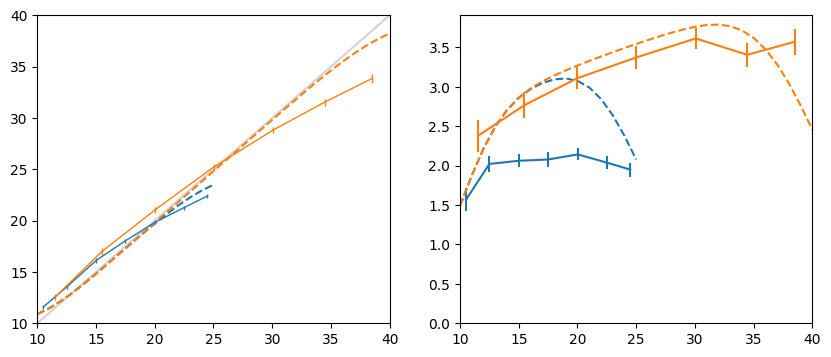

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    zpxs = get_interp_wideZipfprior(cond, alpha=0)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(zpxs, θcost=.02)
    print(μxs)
    pxhatx, avg_ests, stddev_ests = model_predictions_cstvar(ZIPF_XS, zpxs, μxs, ν=ν, sd=.1, correct_xs=xs, NUM_RS=10_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #### Subjects
    for k, avgzz in binAvgs[cond].items():
        ns = binNs[cond][k] # shape = (nbSubj, k)
        stdzz = binStds[cond][k]
        xx = ns.mean(axis=0)
        if k=='A':
            pass #axs[0].plot(xx, np.nanmean(avgzz, axis=0), '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
        else:
            axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
            axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40); 
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

## Free prior

In [ ]:
def make_pxs(xs, some_ps, normalized):
    assert np.all(np.array(some_ps)>=0)
    xps = np.linspace(xs[0], xs[-1], num=len(some_ps))
    pxs = np.interp(xs, xps, some_ps)
    if normalized:
        pxs /= pxs.sum()
    return pxs

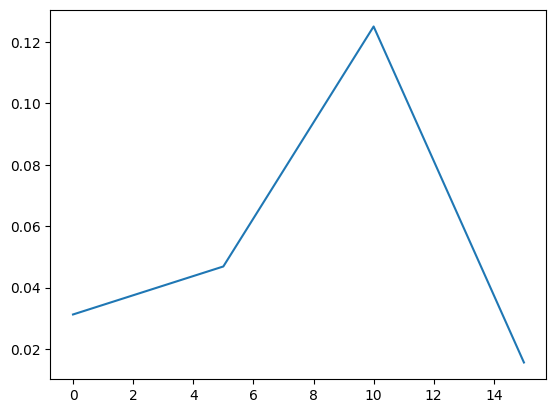

In [ ]:
some_ps = [.2,.3,.8,.1]
plt.plot( make_pxs(XS_COND[NARROW], some_ps=some_ps, normalized=True) )

In [ ]:
def mLL_effcoding_free_prior(dat, cond, some_ps, θcost, σ, NUM_RS=10_000):
    xs = XS_COND[cond]
    spxs = make_pxs( xs, some_ps=some_ps, normalized=True)
    Ixs, μxs, ν = opt_Ixs_μxs_and_ν(spxs=spxs, θcost=θcost)
    correct_w = WIDTHS_COND[cond]
    return mLL(dat, xs, spxs, μxs, ν, σ, correct_w, NUM_RS=NUM_RS)

In [ ]:
@cache
def mLL_allsubjects_free_prior_Np(cond, some_ps, θcost, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    return mLL_effcoding_free_prior(dat, cond, some_ps, θcost, σ, NUM_RS=NUM_RS)

In [ ]:
PRIORS_COND

{'narrow': array([0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625]),
 'wide': array([0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806,
        0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806,
        0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806])}

In [ ]:
def objf_freeprior_3p(x):
    some_ps_n = x[:3]
    some_ps_w = x[3:6]
    θcost, σ = x[6:]    
    r  = mLL_allsubjects_free_prior_Np(NARROW, tuple(some_ps_n), θcost, σ)
    r += mLL_allsubjects_free_prior_Np(WIDE, tuple(some_ps_w), θcost, σ)
    #print(x, r)
    return r
res = min_objf(objf_freeprior_3p, x0s=[ [.0625 ,.0625, .0625, 0.03225806 ,0.03225806, 0.03225806, .2, 3],
                                        [.0825 ,.0625, .0425, 0.05225806 ,0.03225806, 0.01225806, .2, 3],],
               bounds=[(0,1),]*6 + [(0,None), (0,None) ],
               constraints=[dict(type='eq', fun=lambda x: make_pxs(XS_COND[NARROW], x[:3], normalized=False).sum()-1.),
                            dict(type='eq', fun=lambda x: make_pxs(XS_COND[WIDE],   x[3:6], normalized=False).sum()-1.), ])
print(res)

[0.0625, 0.0625, 0.0625, 0.03225806, 0.03225806, 0.03225806, 0.2, 3] -> [8.24907511e-02 8.52906243e-02 2.62565645e-03 1.23114301e-01 1.00021700e-03 1.02917008e-05 1.92580509e-03 2.95561894e+00] 40418.65385117968
[0.0825, 0.0625, 0.0425, 0.05225806, 0.03225806, 0.01225806, 0.2, 3] -> [1.12684861e-11 1.33928571e-01 9.44016501e-12 1.16375476e-01 4.59974631e-03 1.85394894e-11 1.11520571e-10 1.15607754e+02] 51015.354173825624
 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 40418.65385117968
       x: [ 8.249e-02  8.529e-02  2.626e-03  1.231e-01  1.000e-03
            1.029e-05  1.926e-03  2.956e+00]
     nit: 51
     jac: [-2.800e+01  3.834e+01 -3.658e+02  1.223e+03 -1.433e+05
           -6.935e+05  6.227e+04 -8.864e+01]
    nfev: 485
    njev: 47


In [ ]:
make_pxs(XS_COND[NARROW], res.x[:3], normalized=False).sum(), make_pxs(XS_COND[WIDE], res.x[3:6], normalized=False).sum()

(0.8076059843961141, 2.2331207454018966)

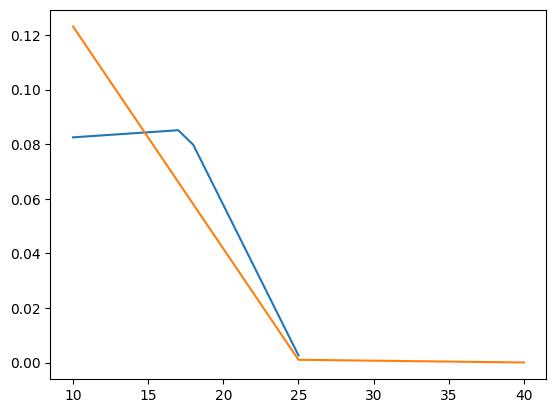

In [ ]:
plt.plot(XS_COND[NARROW], make_pxs(XS_COND[NARROW], res.x[:3], normalized=True), label='Narrow')
plt.plot(XS_COND[WIDE], make_pxs(XS_COND[WIDE], res.x[3:6], normalized=True), label='Wide')

In [ ]:
def objf_freeprior_Np(x, N):
    some_ps_n = x[:N]
    some_ps_w = x[N:2*N]
    θcost, σ = x[2*N:]    
    r  = mLL_allsubjects_free_prior_Np(NARROW, tuple(some_ps_n), θcost, σ)
    r += mLL_allsubjects_free_prior_Np(WIDE, tuple(some_ps_w), θcost, σ)
    #print(x, r)
    return r
NN = 5
res = min_objf(objf_freeprior_Np, x0s=[[.0625,]*NN + [0.03225806,]*NN + [.2, 3],], args=(NN,),
               bounds=[(0,1),]*(2*NN) + [(0,None), (0,None) ],
               constraints=[dict(type='eq', fun=lambda x: make_pxs(XS_COND[NARROW], x[:NN], normalized=False).sum()-1.),
                            dict(type='eq', fun=lambda x: make_pxs(XS_COND[WIDE],   x[NN:2*NN], normalized=False).sum()-1.), ])
print(res)

[0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.2, 3] -> [1.10340269e-01 1.30114264e-02 1.60738805e-01 2.44670882e-02 4.01116803e-03 2.14046316e-01 1.08748157e-02 2.05092144e-03 3.75306107e-05
 1.90343928e-04 1.06667758e-03 2.96764567e+00] 40314.39123804981
 message: Positive directional derivative for linesearch
 success: False
  status: 8
     fun: 40314.39123804981
       x: [ 1.103e-01  1.301e-02  1.607e-01  2.447e-02  4.011e-03
            2.140e-01  1.087e-02  2.051e-03  3.753e-05  1.903e-04
            1.067e-03  2.968e+00]
     nit: 82
     jac: [-1.822e+01  7.385e+01 -8.256e+00  3.998e+01  3.487e+02
           -6.961e+01 -1.004e+02  2.039e+03  4.104e+04  5.404e+04
           -6.522e+03 -1.600e+01]
    nfev: 1133
    njev: 78


In [ ]:
NN = 10
res = min_objf(objf_freeprior_Np, x0s=[[.0625,]*NN + [0.03225806,]*NN + [.2, 3],], args=(NN,),
               bounds=[(0,1),]*(2*NN) + [(0,None), (0,None) ],
               constraints=[dict(type='eq', fun=lambda x: make_pxs(XS_COND[NARROW], x[:NN], normalized=False).sum()-1.),
                            dict(type='eq', fun=lambda x: make_pxs(XS_COND[WIDE],   x[NN:2*NN], normalized=False).sum()-1.), ])
print(res)

[0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.0625, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.03225806, 0.2, 3] -> [1.09784977e-01 2.13941852e-02 4.20578516e-02 5.96092182e-02 1.06054529e-17 2.19530875e-01 8.90939841e-02 2.78252493e-17 5.84697379e-02
 2.30793062e-02 2.29642541e-01 3.82472762e-02 1.09386921e-02 4.74301800e-02 8.90714557e-18 3.96288205e-02 5.59535550e-07 1.18135703e-03
 1.03397612e-02 1.09700068e-03 1.62759734e+03 1.43390967e+03] 51069.45258191995
 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 51069.45258191995
       x: [ 1.098e-01  2.139e-02 ...  1.628e+03  1.434e+03]
     nit: 50
     jac: [-9.766e-04 -9.766e-04 ... -9.766e-04 -4.883e-04]
    nfev: 1244
    njev: 50


In [ ]:
make_pxs(XS_COND[NARROW], res.x[:NN], normalized=False).sum(), make_pxs(XS_COND[WIDE], res.x[NN:2*NN], normalized=False).sum()

(0.9999999999916467, 1.0000000000028906)

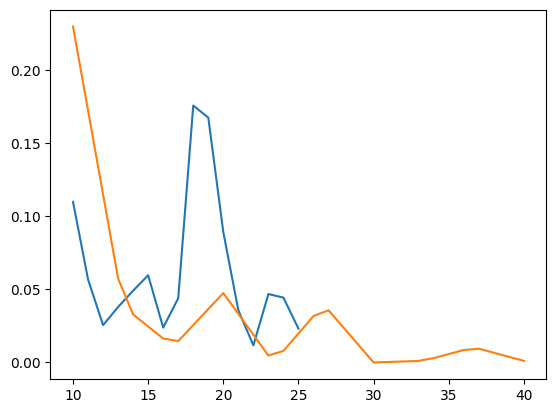

In [ ]:
plt.plot(XS_COND[NARROW], make_pxs(XS_COND[NARROW], res.x[:NN], normalized=True), label='Narrow')
plt.plot(XS_COND[WIDE], make_pxs(XS_COND[WIDE], res.x[NN:2*NN], normalized=True), label='Wide')

## Gaussian prior, constant cognitive noise

In [ ]:
#mLL(dat, sxs, spxs, μxs, ν, σ, w, lo=10, NUM_RS=10_000)
@cache
def mLL_allsubjects_gaussian_prior_cstcognoise(cond, m, sd, ν, σ, NUM_RS=10_000):
    dat = beh[ (beh.range==cond) & ~pd.isna(beh.response)]
    xs = XS_COND[cond]
    pxs = make_gaussian_prior(xs, m, sd)
    μxs = np.linspace(0,1,len(xs))
    return mLL_rectified(dat, xs, pxs, μxs=μxs, ν=ν, σ=σ, w=WIDTHS_COND[cond], lo=10, NUM_RS=NUM_RS)

In [ ]:
res_g = {}
for cond in CONDITIONS:
    res_g[cond] = min_objf(lambda x: mLL_allsubjects_gaussian_prior_cstcognoise(cond, *x),
                           x0s=[(10.,10,.1,2), (10.,15,.1,2)],
                           bounds=[(5,45), (1,50), (.001,None), (.1,10)])
    print(res_g[cond])

(10.0, 10, 0.1, 2) -> [14.9051881   7.4528548   0.14046987  1.7535422 ] 18096.64223672188
(10.0, 15, 0.1, 2) -> [17.5505885   1.01531885  0.03424247  2.4248764 ] 17961.83945117421
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 17961.83945117421
        x: [ 1.755e+01  1.015e+00  3.424e-02  2.425e+00]
      nit: 54
      jac: [ 8.367e-03  2.248e-01 -1.677e+00  4.402e-02]
     nfev: 380
     njev: 76
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>
(10.0, 10, 0.1, 2) -> [2.09391376e+01 1.00000000e+00 1.77247934e-02 3.87512051e+00] 21952.514323669442
(10.0, 15, 0.1, 2) -> [2.09390637e+01 1.00000000e+00 1.77247601e-02 3.87512694e+00] 21952.51432359488
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 21952.51432359488
        x: [ 2.094e+01  1.000e+00  1.772e-02  3.875e+00]
      nit: 52
      jac: [ 0.000e+00  4.726e-01 -8.004e-03 -3.638e-04]
     nfev: 320
     njev: 64
 hess_inv: 

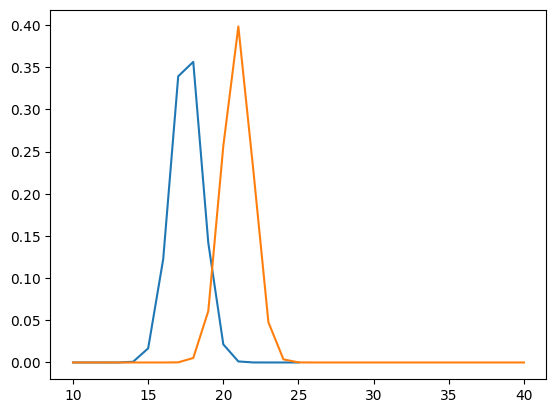

In [ ]:
# plot the two gaussians
for cond in CONDITIONS:
    plt.plot(XS_COND[cond], make_gaussian_prior(XS_COND[cond], *res_g[cond].x[:2]), label=cond)

(0.0, 4.531341424707217)

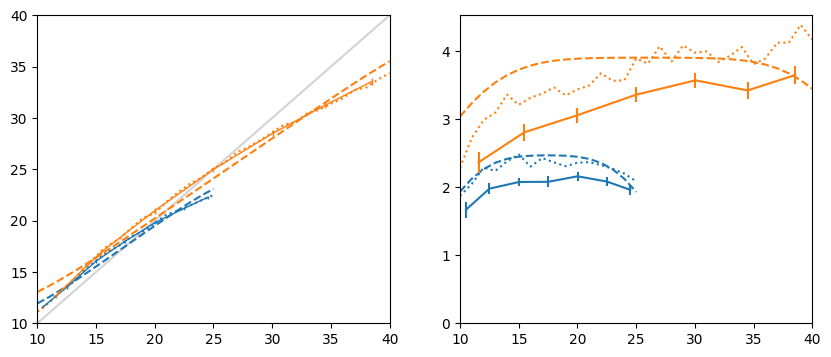

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
for ic,cond in enumerate( CONDITIONS ):
    xs = XS_COND[cond]
    pxs = make_gaussian_prior(xs, *res_g[cond].x[:2])
    μxs = np.linspace(0,1,len(xs))
    σ = res_g[cond].x[3]
    ν = res_g[cond].x[2]
    pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=10_000)
    axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
    axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
    #### Subjects
    axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
    for k, avgzz in binAvgs[cond].items():
        ns = binNs[cond][k] # shape = (nbSubj, k)
        stdzz = binStds[cond][k]
        xx = ns.mean(axis=0)
        if k=='A':
            pass #axs[0].plot(xx, np.nanmean(avgzz, axis=0), '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
        else:
            axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
            axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,40); axs[0].set_ylim(10,40);
axs[1].set_xlim(10,40); axs[1].set_ylim(0,None)

# Optimize mu(x) to minimize MSE

In [ ]:
def mse_with_μxs_ν_σ(xs, pxs, μxs, ν, σ, NUM_RS=10_000):
    assert len(xs) == len(pxs) == len(μxs)
    pxhatx = probs_xhats_given_x_with_μxs_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=NUM_RS)
    sqErrors = (pxhatx*(xs-xs[...,np.newaxis])**2).sum(axis=1)
    return np.dot(pxs, sqErrors)

In [ ]:
import warnings

In [ ]:
def make_μxs(xs, some_μs):
    '''some_μs does not contain the "first" and "last" values of μ, which we will always assume to be 0 and 1.'''
    μvals = np.r_[0., some_μs, 1.]
    assert np.all(μvals>=0)
    assert np.all(μvals<=1)
    if not np.all(np.diff(μvals)>=0):
        warnings.warn('Decreasing μs')
    xps = np.linspace(xs[0], xs[-1], num=len(μvals))
    return np.interp(xs, xps, μvals)

In [ ]:
mse_with_μxs_ν_σ(XS_COND[NARROW], PRIORS_COND[NARROW], np.linspace(0,1,len(XS_COND[NARROW])), ν=1, σ=4, NUM_RS=1_000)

33.47760834544626

In [ ]:
mse_with_μxs_ν_σ(XS_COND[NARROW], PRIORS_COND[NARROW], make_μxs(XS_COND[NARROW], [.5,]), ν=1, σ=4, NUM_RS=1_000)

33.47760834544625

In [ ]:
def loss_fct(xs, pxs, μxs, ν, σ, θcost):
    return mse_with_μxs_ν_σ(xs=xs, pxs=pxs, μxs=μxs, ν=ν, σ=σ) + θcost/ν**2

def loss_fct_cond(cond, μxs, ν, σ, θcost):
    xs = XS_COND[cond]
    pxs = PRIORS_COND[cond]
    return loss_fct(xs, pxs, μxs, ν, σ, θcost)

@cache
def loss_fct_cond_some_μs(cond, some_μs, ν, σ, θcost):
    xs = XS_COND[cond]
    μxs = make_μxs(xs, some_μs)
    return loss_fct_cond(cond, μxs, ν, σ, θcost)

In [ ]:
loss_fct_cond_some_μs(NARROW, (.5,), ν=.1, σ=4, θcost=.02)

15.276326158829018

## Correct prior

In [ ]:
def objf_optimize_μ_cond(x, cond, σ, θcost):
    some_μs = tuple(x[:-1])
    ν = x[-1]
    r = loss_fct_cond_some_μs(cond, some_μs, ν, σ, θcost)
    #print(x, r)
    return r
objf_optimize_μ_cond([1., .2], cond=NARROW, σ=4, θcost=1)

44.801719762766794

In [ ]:
min_objf(objf_optimize_μ_cond, x0s=[[.4,2], [.3,.2], [1.,.1], [.05,4],], args=(NARROW,4,.5), bounds=[(0.,1.), (1e-3,None)])

[0.4, 2] -> [0.50000311 0.28128742] 28.061498944108976
[0.3, 0.2] -> [0.49999997 0.28128727] 28.061498944033914
[1.0, 0.1] -> [0.49999458 0.2812868 ] 28.061498944148326
[0.05, 4] -> [0.50000083 0.28128662] 28.061498944011635


  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 28.061498944011635
        x: [ 5.000e-01  2.813e-01]
      nit: 10
      jac: [ 2.842e-06 -1.027e-04]
     nfev: 57
     njev: 19
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>

In [ ]:
min_objf(objf_optimize_μ_cond, x0s=[[.4,2], [.3,.2], [1.,.1], [.05,4],], args=(NARROW,4,.005), bounds=[(0.,1.), (1e-3,None)])

[0.4, 2] -> [0.50000006 0.07125137] 13.339154527477636
[0.3, 0.2] -> [0.50000063 0.07125135] 13.339154527481396
[1.0, 0.1] -> [0.5        0.07125137] 13.339154527477662
[0.05, 4] -> [0.50000149 0.07125145] 13.339154527501092


  message: CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL
  success: True
   status: 0
      fun: 13.339154527477636
        x: [ 5.000e-01  7.125e-02]
      nit: 10
      jac: [ 1.066e-06  8.704e-06]
     nfev: 57
     njev: 19
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>

In [ ]:
res = min_objf(objf_optimize_μ_cond, x0s=[[.1,.2,.9,.2], [.1,.8,.9,.2],], args=(NARROW,4,.05), bounds=[(0.,1.),(0.,1.),(0.,1.), (1e-3,None)],
        constraints=[dict(type='ineq', fun=lambda x: np.diff(x[:-1]).min()), ])
res

[0.1, 0.2, 0.9, 0.2] -> [0.         0.50000547 1.         0.15845839] 16.714916495343804
[0.1, 0.8, 0.9, 0.2] -> [0.         0.49999444 1.         0.15845839] 16.714916495351602


 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 16.714916495343804
       x: [ 0.000e+00  5.000e-01  1.000e+00  1.585e-01]
     nit: 9
     jac: [ 1.095e-01  1.128e-04 -1.095e-01  2.634e-03]
    nfev: 49
    njev: 9

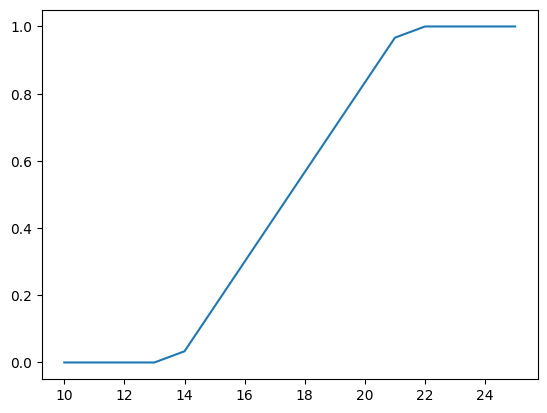

In [ ]:
plt.plot(XS_COND[NARROW], make_μxs(XS_COND[NARROW], res.x[:-1]) )

In [ ]:
cond = NARROW
nbPoints = len(XS_COND[cond])-2
#res4 = min_objf(objf_optimize_μ, x0s=[ list(np.linspace(0,1,nbPoints+2)[1:-1]) + [.2,],], args=(cond,4,.1),
#         bounds=[(0.,1.),]*nbPoints + [(1e-9,None),],
#        constraints=[dict(type='ineq', fun=lambda x: np.diff(x[:-1]).min()), ])
#print(res4)
res0 = min_objf(objf_optimize_μ_cond, x0s=[ list(np.linspace(0,1,nbPoints+2)[1:-1]) + [.2,],], args=(cond,0,.1),
         bounds=[(0.,1.),]*nbPoints + [(1e-9,None),],
        constraints=[dict(type='ineq', fun=lambda x: np.diff(x[:-1]).min()), ])
print(res0)
res00 = min_objf(objf_optimize_μ_cond, x0s=[ list(np.linspace(0,1,nbPoints+2)[1:-1]) + [.2,],], args=(cond,0,1e-6),
         bounds=[(0.,1.),]*nbPoints + [(1e-9,None),],
        constraints=[dict(type='ineq', fun=lambda x: np.diff(x[:-1]).min()), ])
print(res00)

[0.06666666666666667, 0.13333333333333333, 0.2, 0.26666666666666666, 0.3333333333333333, 0.4, 0.4666666666666667, 0.5333333333333333, 0.6, 0.6666666666666666, 0.7333333333333333, 0.8, 0.8666666666666667, 0.9333333333333333, 0.2] -> [0.00000000e+00 0.00000000e+00 1.66365436e-16 7.13833992e-02 2.21357017e-01 3.41876586e-01 4.48623120e-01 5.51187791e-01 6.57752117e-01
 7.78315181e-01 9.28635739e-01 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.91878293e-01] 6.901998324353201
 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 6.901998324353201
       x: [ 0.000e+00  0.000e+00 ...  1.000e+00  1.919e-01]
     nit: 13
     jac: [ 1.676e+00  1.039e+00 ... -1.675e+00 -2.889e-02]
    nfev: 218
    njev: 13
[0.06666666666666667, 0.13333333333333333, 0.2, 0.26666666666666666, 0.3333333333333333, 0.4, 0.4666666666666667, 0.5333333333333333, 0.6, 0.6666666666666666, 0.7333333333333333, 0.8, 0.8666666666666667, 0.9333333333333333, 0.2] -> [0.0668892  0.13376268 0.200

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_slsqp_py.py:437: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  fx = wrapped_fun(x)


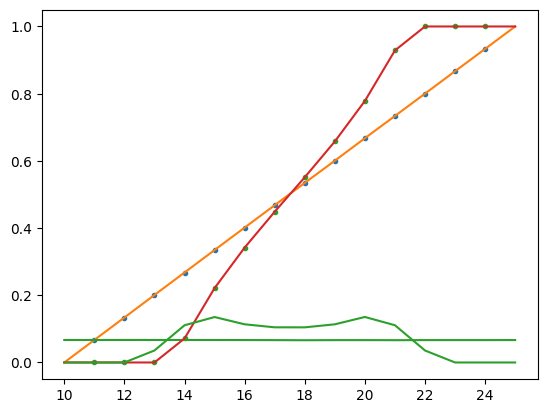

In [ ]:
for res in [res00, res0, ]:
    plt.plot(XS_COND[cond][1:-1], res.x[:-1], '.' )
    plt.plot(XS_COND[cond], make_μxs(XS_COND[cond], res.x[:-1] ) )
    #plt.plot(XS_COND[cond], np.diff(make_μxs(XS_COND[cond], res.x[:-1]), prepend=0), c='C2')
    plt.plot(XS_COND[cond], np.gradient(make_μxs(XS_COND[cond], res.x[:-1]) ), c='C2')
    #plt.plot(XS_COND[cond], PRIORS_COND[cond], c='C2')

(0.0, 3.7113227230814254)

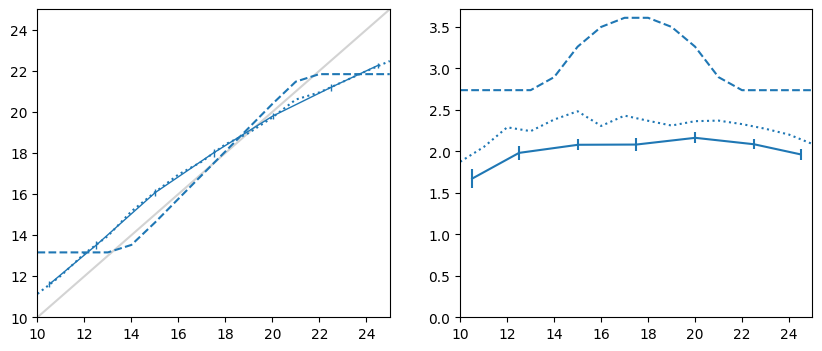

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
cond = NARROW
xs = XS_COND[cond]
pxs = PRIORS_COND[cond]
res = res0
μxs = make_μxs(XS_COND[cond], res.x[:-1] )
σ = 3
ν = res.x[-1]
pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs, ν=ν, σ=σ, NUM_RS=10_000)
axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
#### Subjects
axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
for k, avgzz in binAvgs[cond].items():
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    if k=='A':
        pass #axs[0].plot(xx, np.nanmean(avgzz, axis=0), '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
    else:
        axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
        axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,xs[-1]); axs[0].set_ylim(10,xs[-1]); 
axs[1].set_xlim(10,xs[-1]); axs[1].set_ylim(0,None)

## Gaussian prior

In [ ]:
### We consider a Gaussian prior defined over [0,50] ###
### μxs will have to be defined over that too.       ###
XS50 = np.arange(0,51)
M_COND = {NARROW:17.5, WIDE:25}
SD_COND = {cond:w/np.sqrt(12) for cond,w in WIDTHS_COND.items()}

In [ ]:
SD_COND

{'narrow': 4.330127018922194, 'wide': 8.660254037844387}

In [ ]:
def loss_fct_gaussian(m, sd, μxs, ν, σ, θcost):
    pxs = num.std_normal_pdf((XS50-m)/sd)
    pxs /= pxs.sum()
    return loss_fct(XS50, pxs, μxs, ν, σ, θcost)

@cache
def loss_fct_gaussian_some_μs(m, sd, some_μs, ν, σ, θcost):
    μxs = make_μxs(XS50, some_μs)
    return loss_fct_gaussian(m, sd, μxs, ν, σ, θcost)

def objf_optimize_μ_gaussian(x, m, sd, σ, θcost):
    some_μs = tuple(x[:-1])
    ν = x[-1]
    r = loss_fct_gaussian_some_μs(m, sd, some_μs, ν, σ, θcost)
    #print(x, r)
    return r
objf_optimize_μ_gaussian([1., 2], m=M_COND[NARROW], sd=SD_COND[NARROW], σ=4, θcost=.1)

34.72448700041684

In [ ]:
res = min_objf(objf_optimize_μ_gaussian, x0s=[[.1,.2,.9,.2], [.1,.8,.9,.2],], args=(M_COND[NARROW],SD_COND[NARROW],4,.05), bounds=[(0.,1.),(0.,1.),(0.,1.), (1e-3,None)],
        constraints=[dict(type='ineq', fun=lambda x: np.diff(x[:-1]).min()), ])
res

[0.1, 0.2, 0.9, 0.2] -> [0.         1.         1.         0.13880447] 22.70709206553165
[0.1, 0.8, 0.9, 0.2] -> [1.75507925e-13 1.00000000e+00 1.00000000e+00 1.38796146e-01] 22.70709188827829


 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 22.70709188827829
       x: [ 1.755e-13  1.000e+00  1.000e+00  1.388e-01]
     nit: 9
     jac: [ 3.525e+00 -4.735e+00 -4.578e-01  1.766e-02]
    nfev: 47
    njev: 9

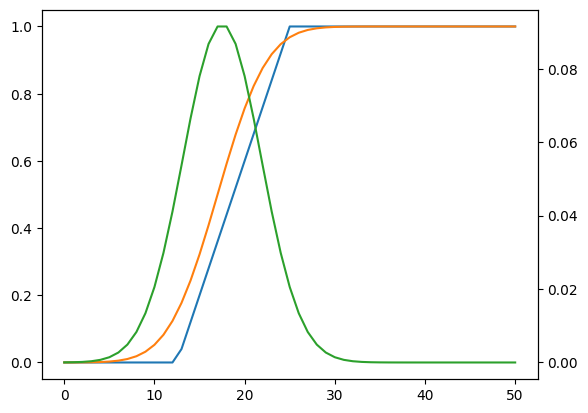

In [ ]:
plt.plot(XS50, make_μxs(XS50, res.x[:-1]) )
pxs = num.std_normal_pdf((XS50-M_COND[NARROW])/SD_COND[NARROW])
pxs /= pxs.sum()
plt.plot(XS50, pxs.cumsum(), c='C1')
plt.twinx().plot(XS50, pxs, c='C2')

In [ ]:
[ w*.2 for w in WIDTHS_COND.values() ]

[3.0, 6.0]

In [ ]:
cond = WIDE
nbPoints = len(XS50)-2
res = min_objf(objf_optimize_μ_gaussian, x0s=[ list(np.linspace(0,1,nbPoints+2)[1:-1]) + [.2,],], args=(M_COND[cond],SD_COND[cond],0,.1),
         bounds=[(0.,1.),]*nbPoints + [(1e-9,None),],
        constraints=[dict(type='ineq', fun=lambda x: np.diff(x[:-1]).min()), ])
print(res)

[0.02, 0.04, 0.06, 0.08, 0.1, 0.12, 0.14, 0.16, 0.18, 0.2, 0.22, 0.24, 0.26, 0.28, 0.3, 0.32, 0.34, 0.36, 0.38, 0.4, 0.42, 0.44, 0.46, 0.48, 0.5, 0.52, 0.54, 0.56, 0.58, 0.6, 0.62, 0.64, 0.66, 0.68, 0.7000000000000001, 0.72, 0.74, 0.76, 0.78, 0.8, 0.8200000000000001, 0.84, 0.86, 0.88, 0.9, 0.92, 0.9400000000000001, 0.96, 0.98, 0.2] -> [0.         0.         0.         0.         0.         0.         0.         0.         0.         0.         0.         0.
 0.         0.         0.03828142 0.09847211 0.15382595 0.20460134 0.25114691 0.29463788 0.33610224 0.37666607 0.41732849 0.45842811
 0.50004133 0.54163401 0.58274483 0.62336697 0.6639253  0.70539228 0.74890455 0.79547045 0.84628231 0.90160662 0.96174627 1.
 1.         1.         1.         1.         1.         1.         1.         1.         1.         1.         1.         1.
 1.         0.11729993] 18.663041255680685
 message: Optimization terminated successfully
 success: True
  status: 0
     fun: 18.663041255680685
       x:

/Users/apc/Documents/Neuro/numerosity-fmri/neural_priors/.venv/lib/python3.10/site-packages/scipy/optimize/_slsqp_py.py:437: RuntimeWarning: Values in x were outside bounds during a minimize step, clipping to bounds
  fx = wrapped_fun(x)


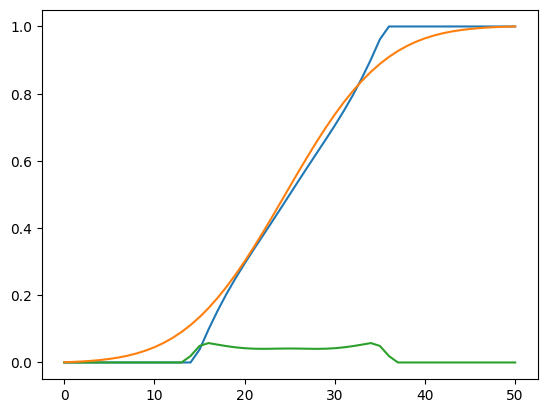

In [ ]:
#plt.plot(XS50[1:-1], res.x[:-1], '.' )
plt.plot(XS50, make_μxs(XS50, res.x[:-1] ) )
plt.plot(XS50, np.gradient(make_μxs(XS50, res.x[:-1]) ), c='C2')
#plt.plot(XS_COND[cond], PRIORS_COND[cond], c='C2')
pxs = num.std_normal_pdf((XS50-M_COND[cond])/SD_COND[cond])
pxs /= pxs.sum()
plt.plot(XS50, pxs.cumsum(), c='C1')

### Gausian-CDF mu

In [ ]:
# we force mu to be equal to a Gaussian CDF, with mean = the correct mean of the prior, and just one parameter, the s.d.

@cache
def loss_fct_gaussian_μ_gaussian_prior(m, sd, μsd, ν, σ, θcost):
    μxs = num.std_normal_cdf((XS50-m)/μsd)
    return loss_fct_gaussian(m, sd, μxs, ν, σ, θcost)

def objf_optimize_gaussian_μ_gaussian_prior(x, m, sd, σ, θcost):
    μsd = x[0]
    ν = x[-1]
    r = loss_fct_gaussian_μ_gaussian_prior(m, sd, μsd, ν, σ, θcost)
    #print(x, r)
    return r
objf_optimize_gaussian_μ_gaussian_prior([5., .2], m=M_COND[NARROW], sd=SD_COND[NARROW], σ=4, θcost=.1)

25.661840502933426

In [ ]:
cond = WIDE
res = min_objf(objf_optimize_gaussian_μ_gaussian_prior, x0s=itertools.product([2,8],[.1,.3]), args=(M_COND[cond],SD_COND[cond],0,.1),
         bounds=[(1,None), (1e-9,None),],)
print(res)

(2, 0.1) -> [7.27163581 0.1170547 ] 19.67151183249546
(2, 0.3) -> [7.27169646 0.1170571 ] 19.67151183001097
(8, 0.1) -> [7.2715987 0.1170541] 19.671511835980255
(8, 0.3) -> [7.27183954 0.11705553] 19.671511829671687
  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 19.671511829671687
        x: [ 7.272e+00  1.171e-01]
      nit: 14
      jac: [ 6.324e-05  1.722e-03]
     nfev: 54
     njev: 18
 hess_inv: <2x2 LbfgsInvHessProduct with dtype=float64>


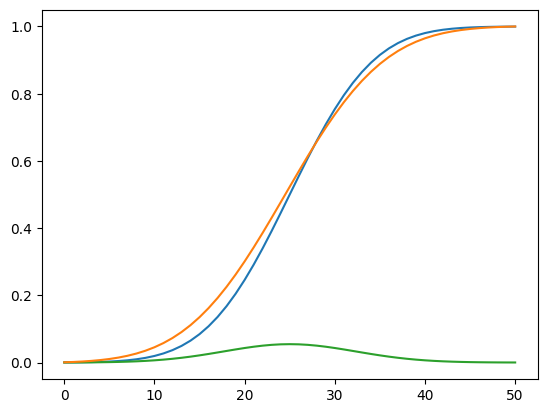

In [ ]:
μxs = num.std_normal_cdf((XS50-M_COND[cond])/res.x[0])
plt.plot(XS50, μxs )
plt.plot(XS50, np.gradient(μxs), c='C2')
pxs = num.std_normal_pdf((XS50-M_COND[cond])/SD_COND[cond])
pxs /= pxs.sum()
plt.plot(XS50, pxs.cumsum(), c='C1')

(0.0, 4.511118032413028)

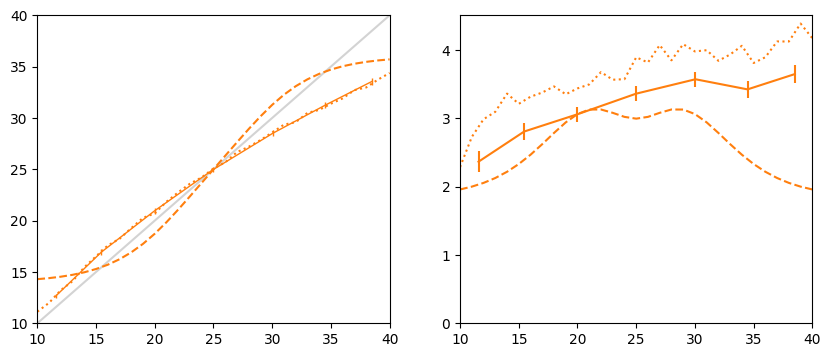

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
cond = WIDE
xs = XS_COND[cond]
pxs = PRIORS_COND[cond]
μxs = num.std_normal_cdf((XS50-M_COND[cond])/res.x[0])
μxs_support = μxs[(XS50>=xs[0]) & (XS50<=xs[-1])]
σ = 1
ν = res.x[-1]
pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs_support, ν=ν, σ=σ, NUM_RS=10_000)
axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
#### Subjects
axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
for k, avgzz in binAvgs[cond].items():
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    if k=='A':
        pass #axs[0].plot(xx, np.nanmean(avgzz, axis=0), '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
    else:
        axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
        axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,xs[-1]); axs[0].set_ylim(10,xs[-1]); 
axs[1].set_xlim(10,xs[-1]); axs[1].set_ylim(0,None)

(0.0, 4.552714094106168)

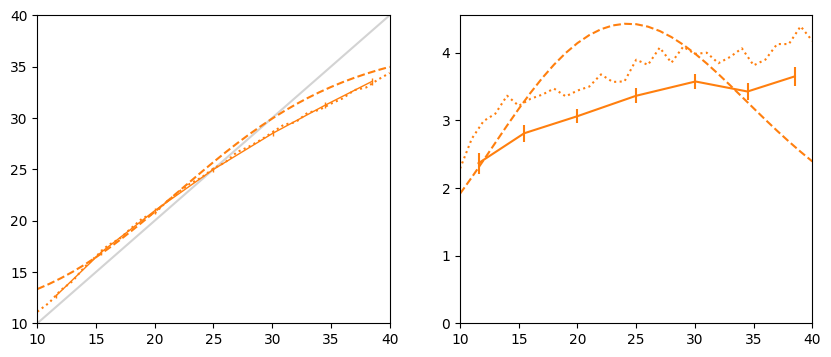

In [ ]:
fig, axs = plt.subplots(ncols=2, figsize=(10,4))
cond = WIDE
xs = XS_COND[cond]
pxs = PRIORS_COND[cond]
μxs = num.std_normal_cdf((XS50-5)/30)
μxs_support = μxs[(XS50>=xs[0]) & (XS50<=xs[-1])]
σ = 0
ν = .05
pxhatx, avg_ests, stddev_ests = model_predictions_rectified(xs, pxs, μxs_support, ν=ν, σ=σ, NUM_RS=10_000)
axs[0].plot(xs, avg_ests, c=COLORS_COND[cond], ls='--')
axs[1].plot(xs, stddev_ests, c=COLORS_COND[cond], ls='--')
#### Subjects
axs[0].plot(binNs_pooled[cond]['A'], binAvgs_pooled[cond]['A'], ':', c=COLORS_COND[cond])
axs[1].plot(binNs_pooled[cond]['A'], binStds_pooled[cond]['A'], ':', c=COLORS_COND[cond])
for k, avgzz in binAvgs[cond].items():
    ns = binNs[cond][k] # shape = (nbSubj, k)
    stdzz = binStds[cond][k]
    xx = ns.mean(axis=0)
    if k=='A':
        pass #axs[0].plot(xx, np.nanmean(avgzz, axis=0), '.-', c=COLORS_COND[cond], alpha=.2, ms=2)
    else:
        axs[0].errorbar(xx, np.nanmean(avgzz, axis=0), stats.sem( avgzz, axis=0 ), c=COLORS_COND[cond], label=cond, lw=1)
        axs[1].errorbar(xx, np.nanmean(stdzz, axis=0), stats.sem( stdzz, axis=0 ), c=COLORS_COND[cond], label=cond)
axs[0].axline((10,10), slope=1, color='lightgrey', zorder=-1000)
axs[0].set_xlim(10,xs[-1]); axs[0].set_ylim(10,xs[-1]); 
axs[1].set_xlim(10,xs[-1]); axs[1].set_ylim(0,None)

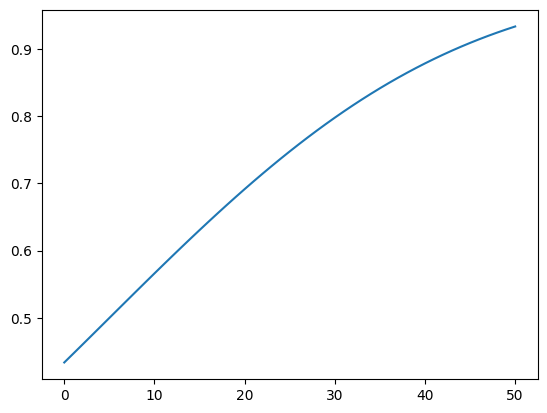

In [ ]:
plt.plot(XS50, μxs)

In [ ]:
M_COND[cond]

25

In [ ]:
res.x

array([7.27183954, 0.11705553])

# Recap LLs

In [ ]:
[1,2,3,4][3:]

[4]

| Model | k | -LL | Notes |
|---|---|---|---|
|No cog noise - n/w motor noise|2| 40835.25 |
|Constrained $\nu$ |2| 41001.09|
|Subjective prior (correct support) Zipf 2  |3| 40763.60 | $\alpha=0$
|Subjective prior (correct support) Zipf 1.1|3| 40905.88 | $\alpha=0$
|Subjective prior (correct support) Zipf 2 alpha n/w  |4|40660.04| $\alpha_w=0$
|Subjective prior (correct support) Zipf 1.1 alpha n/w|4| 40875.91 | $\alpha_w=0$
|Subjective prior (wider support) Zipf 2  |3|40803.18|
|Subjective prior (wider support) Zipf 1.1|3|40721.16|
|Subjective prior (wider support) n/w Zipf 2  |4|40644.94|
|Subjective prior (wider support) n/w Zipf 1.1|4|40636.64|
|||||
|**Rectified** motor noise. **Efficient Coding**||||
|No cog noise - n/w rectified motor noise|2|41438.76|
|Constrained $\nu$, rectified Gaussian|2|40823.39|
|Subjective prior (correct support) Zipf power n/w|4|40305.16|
|Subjective prior (correct support) Zipf 2  |3|40466.31| $\alpha=0$
|Subjective prior (correct support) Zipf 2 alpha n/w  |4|40351.86| $\alpha_w=0$
|Subjective prior (correct support) LogN n/w |6|40194.22|
|Subjective prior (correct support) Gaussian n/w |6|40175.35|
|Subjective prior (wider support) LogN n/w |6|40170.86|
|Subjective prior (wider support) Gaussian n/w|6|39864.77| $\mu_w \approx \mu_n$ and $\sigma=0$! |
|Subjective prior (wider support) Gaussian n/w, $\mu_w = \mu_n$, $\sigma=0$|4| 39867.59 | and $sd_w \approx 2 sd_n$ |
|Subjective prior (wider support) Gaussian n/w, $\mu_w = \mu_n$, $sd_w = 2 sd_n$, $\sigma=0$|3| 39870.66 |  |
|||||
|**LogN encoding** - Same in both conditions||||
|LogN encoding + correct prior|2|40339.42||
|LogN encoding + correct prior; different noises|3|40191.48|Same encoding (log(x)), but different noise levels|
|LogN encoding + logN subjective prior (correct support)|6|39950.23||
|LogN encoding + logN subjective prior (correct support); different noises|7|39719.21|different noise levels|
|LogN encoding + Gaussian subjective prior (correct support)|6|39914.20||
|LogN encoding + Gaussian subjective prior (correct support); different noises|7|39614.72|different noise levels|
|LogN encoding + Gaussian subjective prior (wider support)|6|39586.39|Same encoding in both condition. $\mu_w \approx \mu_n$, $sd_w \approx 2 sd_n$, $\sigma=0$!|
|LogN encoding + Gaussian subjective prior (wider support); different noises||.72|different noise levels|
|||||

In [ ]:
np.log( len(beh) ) / 2

4.864567082695675